In [1]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.tri as tri
from matplotlib.colors import LinearSegmentedColormap
import xarray as xr
import cmocean.cm as cmo 
import gsw
from mpl_toolkits.axes_grid1 import make_axes_locatable
from matplotlib.collections import PolyCollection
from scipy.spatial import Delaunay

from scipy.interpolate import griddata
from scipy.spatial import KDTree

from matplotlib.colors import ListedColormap
import matplotlib.patches as mpatches
import matplotlib.gridspec as gridspec

# View from top


## Data

In [2]:
path ='../../../automated_testing/integrated_tests/idealised/Thule/archive/Thule_LAD/results_5km_iceocean1r_new/'
#/Users/georgiamcquade/Documents/GitHub/UFEMISM2.0/automated_testing/integrated_tests/idealised/Thule/Thule_LAD/results_5km_iceocean1r_new/main_output_ANT_00001.nc

In [3]:
Lad = xr.open_dataset(path + 'main_output_ANT_00001.nc')

In [4]:
Va  = Lad['V']
V = Va.T

Tria = Lad['Tri']-1  
Tri = Tria.T

triang = tri.Triangulation(V[:, 0], V[:, 1], Tri)

In [5]:
Hi_l = Lad['Hi']
Hib_l = Lad['Hib']
Hs_l = Lad['Hs']
Hb_l = Lad['Hb']
BMB_l = Lad['BMB']
E = Lad['entr']
Em = Lad['entr_dmin']
melt = Lad['melt']
So = Lad['S_ocean']
To = Lad['T_ocean']
T_fp = Lad['T_freezing_point']


In [6]:
S_lad = Lad['S_lad']
H_lad = Lad['H_lad']
T_lad = Lad['T_lad']
U_lad = Lad['U_lad']
V_lad = Lad['V_lad']

In [7]:
mask_gr = Lad['mask_grounded_ice']

In [8]:
Lad_g = xr.open_dataset(path + 'main_output_ANT_grid.nc')

In [9]:
u = 0
n = 800000

In [10]:
distances = np.sqrt(V[:, 0]**2 + V[:, 1]**2)
radius = 750000
mask_ocean = distances <= radius
mask_SL = Hb_l[u] < 0
p = 0.01
mask_floating = (Hs_l[u] - Hi_l[u] - Hb_l[u] <= p)
mask_rock= ~mask_floating

# Results

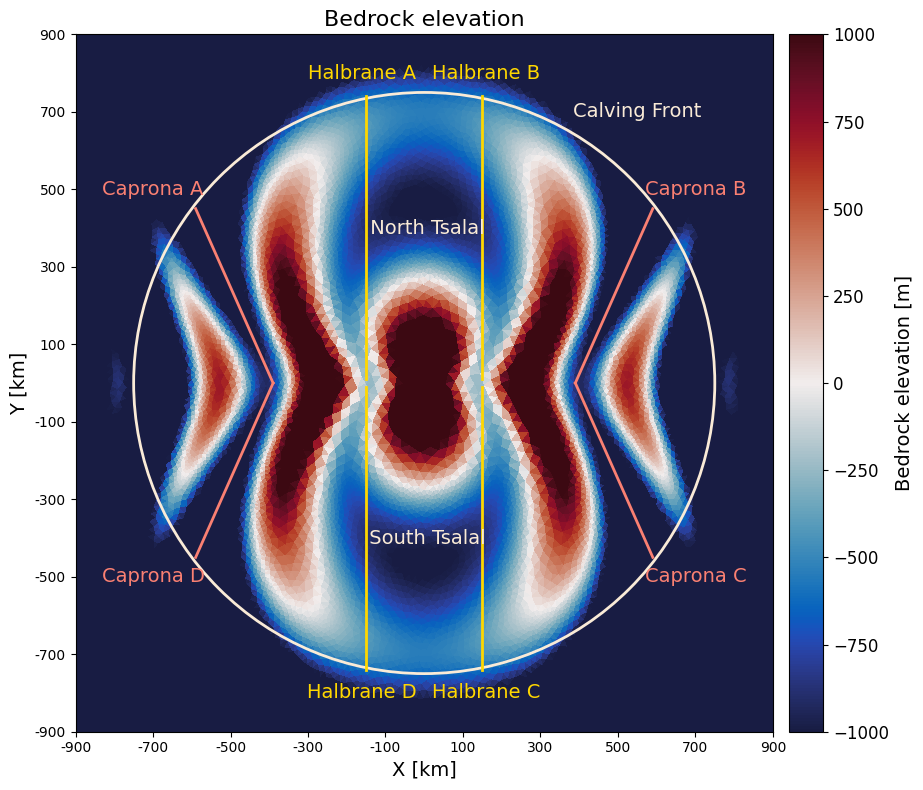

In [28]:
colorbar_kwargs = {
    'aspect': 20,
    'pad': 0.01,
    'shrink': 1, 
}

n = 900000
##############################################################################################################################
fig, ax = plt.subplots(1, 1, figsize=(16, 8)) 

c0 = ax.tripcolor(triang, Hb_l[u], cmap=cmo.balance , vmin=-1000, vmax=1000)

cbar = fig.colorbar(c0, ax=ax, **colorbar_kwargs)
cbar.set_label("Bedrock elevation [m]", fontsize=14)  # Set fontsize here
cbar.ax.tick_params(labelsize=12)

ax.set_title('Bedrock elevation', fontsize=16)
circle = plt.Circle((0, 0), 750000, color='antiquewhite', fill=False, linestyle='-', linewidth=2)
ax.add_artist(circle)
ax.set_aspect('equal')
ax.set_xlabel('X [km]', fontsize=14)
ax.set_ylabel('Y [km]', fontsize=14)
ax.set_xticks(np.arange(-n, n + 1, 200000))
ax.set_xticklabels(np.arange(-n // 1000, n // 1000 + 1, 200))
ax.set_yticks(np.arange(-n, n + 1, 200000))
ax.set_yticklabels(np.arange(-n // 1000, n // 1000 + 1, 200))
ax.set_xlim(-n, n)
ax.set_ylim(-n, n)

ax.plot([150000, 150000], [10000, 740000], color='gold', linestyle='-', linewidth=2)
ax.plot([150000, 150000], [-10000, -740000], color='gold', linestyle='-', linewidth=2)
ax.plot([-150000, -150000], [10000, 740000], color='gold', linestyle='-', linewidth=2)
ax.plot([-150000, -150000], [-10000, -740000], color='gold', linestyle='-', linewidth=2)

ax.text(160000, 800000, 'Halbrane B', fontsize=14, color='gold', ha='center', va='center')
ax.text(-160000, 800000, 'Halbrane A', fontsize=14, color='gold', ha='center', va='center')
ax.text(-160000, -800000, 'Halbrane D', fontsize=14, color='gold', ha='center', va='center')
ax.text(160000, -800000, 'Halbrane C', fontsize=14, color='gold', ha='center', va='center')

ax.text(0, +400000, ' North Tsalal', fontsize=14, color='antiquewhite', ha='center', va='center')
ax.text(0, -400000, ' South Tsalal', fontsize=14, color='antiquewhite', ha='center', va='center')

ax.plot([390000, 590000], [0, 450000], color='salmon', linestyle='-', linewidth=2)
ax.plot([-390000, -590000], [0, 450000], color='salmon', linestyle='-', linewidth=2)
ax.plot([-390000,- 590000], [0, -450000], color='salmon', linestyle='-', linewidth=2)
ax.plot([390000, 590000], [0, -450000], color='salmon', linestyle='-', linewidth=2)

ax.text(700000, 500000, 'Caprona B', fontsize=14, color='salmon', ha='center', va='center')
ax.text(-700000, 500000, 'Caprona A', fontsize=14, color='salmon', ha='center', va='center')
ax.text(-700000, - 500000, 'Caprona D', fontsize=14, color='salmon', ha='center', va='center')
ax.text(700000, - 500000, 'Caprona C', fontsize=14, color='salmon', ha='center', va='center')


ax.text(550000, 700000, 'Calving Front', fontsize=14, color='Antiquewhite', ha='center', va='center')
plt.tight_layout()
plt.show()

### Ice

In [12]:
u = 0 

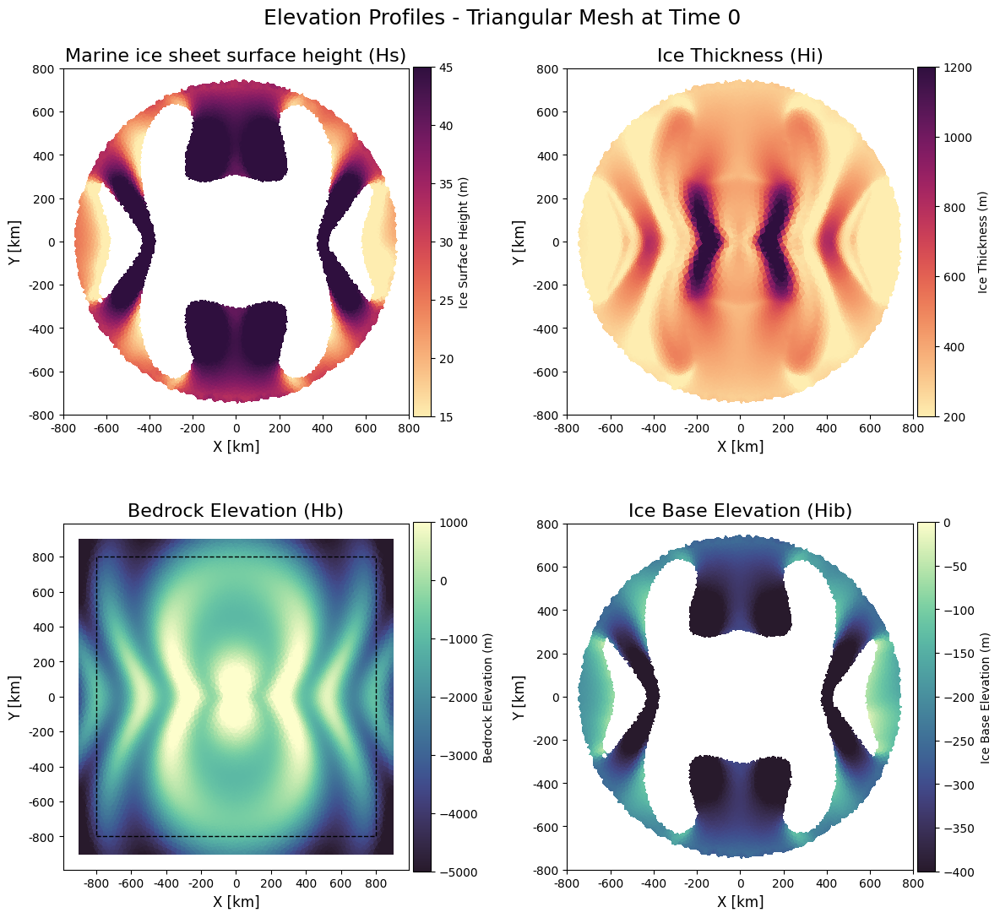

In [13]:
n = 800000

colorbar_kwargs = {
    'aspect': 20,
    'pad': 0.01,
    'shrink': 0.8, 
}

##############################################################################################################################

fig, ax = plt.subplots(2, 2, figsize=(12, 12))
fig.suptitle(f'Elevation Profiles - Triangular Mesh at Time {u}', fontsize=18, x=0.5, y=0.92)


c0 = ax[0, 0].tripcolor(triang, Hs_l[u].where(mask_ocean & mask_rock ), cmap=cmo.matter, vmin = 15 , vmax = 45)
fig.colorbar(c0, ax=ax[0, 0], label="Ice Surface Height (m)", **colorbar_kwargs)
ax[0, 0].set_title('Marine ice sheet surface height (Hs)', fontsize=14)
#cont0 = ax[0, 0].tricontour(triang, Hs_l[u], levels=[0, 500, 1000, 1500], colors='k', linewidths=1)
#ax[0, 0].clabel(cont0, inline=True, fontsize=8)
ax[0, 0].set_xlim(-n,n)
ax[0, 0].set_ylim(-n,n)


c1 = ax[0, 1].tripcolor(triang, Hi_l[u].where(mask_ocean), cmap=cmo.matter, vmin = 200, vmax=1200)
fig.colorbar(c1, ax=ax[0, 1], label="Ice Thickness (m)", **colorbar_kwargs)
ax[0, 1].set_title('Ice Thickness (Hi)', fontsize=14)
#cont1 = ax[0, 1].tricontour(triang, Hi_l[u], levels=[0, 500, 1000, 1500], colors='k', linewidths=1)
#ax[0, 1].clabel(cont1, inline=True, fontsize=8)
ax[0, 1].set_xlim(-n,n)
ax[0, 1].set_ylim(-n,n)


c2 = ax[1, 0].tripcolor(triang, Hb_l[u], cmap=cmo.deep_r, vmin=-5000, vmax=1000)
fig.colorbar(c2, ax=ax[1, 0], label="Bedrock Elevation (m)", **colorbar_kwargs)
ax[1, 0].set_title('Bedrock Elevation (Hb)', fontsize=14)
#cont2 = ax[1, 0].tricontour(triang, Hb_l[u], levels=[-700, -500, -250, 0, 250], colors='k', linewidths=1)
#ax[1, 0].clabel(cont2, inline=True, fontsize=8)
box_x = [-800000, 800000, 800000, -800000, -800000]
box_y = [-800000, -800000, 800000, 800000, -800000]
ax[1, 0].plot(box_x, box_y, color='black', linestyle='--', linewidth=1)


c3 = ax[1, 1].tripcolor(triang, Hib_l[u].where(mask_ocean & mask_rock), cmap=cmo.deep_r , vmin = -400, vmax=0)
fig.colorbar(c3, ax=ax[1, 1], label="Ice Base Elevation (m)", **colorbar_kwargs)
ax[1, 1].set_title('Ice Base Elevation (Hib)', fontsize=14)
#cont3 = ax[1, 1].tricontour(triang, Hs_l[u] - Hi_l[u], levels=[-600, -300, 0, 300], colors='k', linewidths=1)
#ax[1, 1].clabel(cont3, inline=True, fontsize=8)
ax[1, 1].set_xlim(-n,n)
ax[1, 1].set_ylim(-n,n)
 

for i in range(2):
    for j in range(2):
        ax[i, j].set_aspect('equal')
        ax[i, j].title.set_fontsize(16)
        ax[i, j].set_xlabel('X [km]', fontsize=12)
        ax[i, j].set_ylabel('Y [km]', fontsize=12)
        ax[i, j].set_xticks(np.arange(-n, n + 1, 200000))
        ax[i, j].set_xticklabels(np.arange(-n // 1000, n // 1000 + 1, 200))
        ax[i, j].set_yticks(np.arange(-n, n + 1, 200000))
        ax[i, j].set_yticklabels(np.arange(-n // 1000, n // 1000 + 1, 200))


plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.show()




/var/folders/bv/2cj65x2j5v94fp020tpswb0w0000gn/T/ipykernel_5238/1768088864.py:28: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax[j].set_xticklabels(np.arange(-n // 1000, n // 1000 + 1, 200))
/var/folders/bv/2cj65x2j5v94fp020tpswb0w0000gn/T/ipykernel_5238/1768088864.py:28: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax[j].set_xticklabels(np.arange(-n // 1000, n // 1000 + 1, 200))


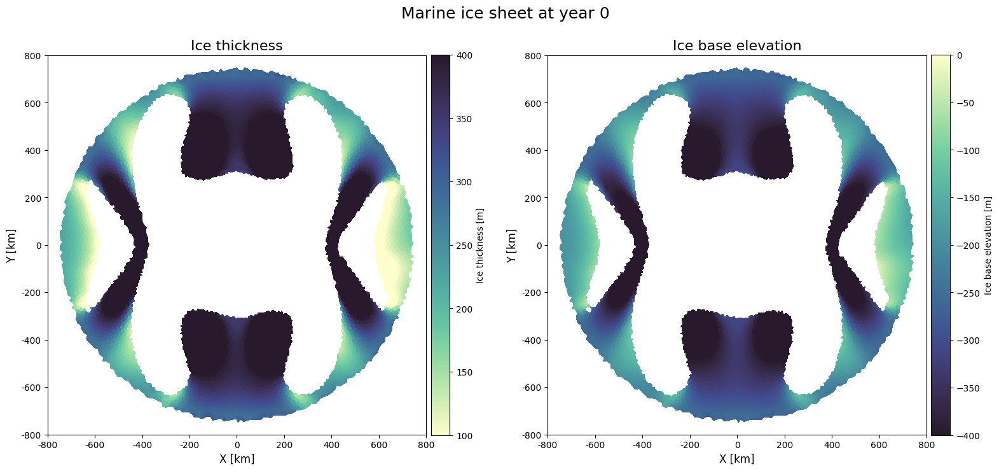

In [14]:
colorbar_kwargs = {
    'aspect': 20,
    'pad': 0.01,
    'shrink': 0.865, 
}
##############################################################################################################################
fig, ax = plt.subplots(1, 2, figsize=(16, 8)) 
fig.suptitle(f'Marine ice sheet at year {u}', fontsize=18, x=0.5, y=0.92)

c0 = ax[0].tripcolor(triang, Hi_l[u].where(mask_ocean & mask_rock), cmap=cmo.deep, vmin = 100, vmax = 400)
fig.colorbar(c0, ax=ax[0], label="Ice thickness [m]", **colorbar_kwargs)
ax[0].set_title('Ice thickness', fontsize=14)
#cont1 = ax[0].tricontour(triang, S_lad[u], levels=[30,31,32,33,34], colors='r', linewidths=1)
#ax[0].clabel(cont1, inline=True, fontsize=8)

c1 = ax[1].tripcolor(triang, Hs_l[u].where(mask_ocean & mask_rock) - Hi_l[u].where(mask_ocean & mask_rock), cmap=cmo.deep_r, vmin = -400, vmax = 0)
fig.colorbar(c1, ax=ax[1], label="Ice base elevation [m]", **colorbar_kwargs)
ax[1].set_title('Ice base elevation', fontsize=14)
#cont2 = ax[1].tricontour(triang, T_lad[u], levels=[-1.5,-1,-0.5], colors='k', linewidths=1)
#ax[1].clabel(cont2, inline=True, fontsize=8)

for j in range(2):
    ax[j].set_aspect('equal')
    ax[j].title.set_fontsize(16)
    ax[j].set_xlabel('X [km]', fontsize=12)
    ax[j].set_ylabel('Y [km]', fontsize=12)
    #ax[j].tripcolor(triang, mask_rock.where(mask_rock), facecolor='beige', edgecolor='none')  # Color masked area in beige
    ax[j].set_xticklabels(np.arange(-n // 1000, n // 1000 + 1, 200))
    ax[j].set_yticks(np.arange(-n, n + 1, 200000))
    ax[j].set_yticklabels(np.arange(-n // 1000, n // 1000 + 1, 200))
    ax[j].set_xlim(-n, n)
    ax[j].set_ylim(-n, n)


plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.show()

/var/folders/bv/2cj65x2j5v94fp020tpswb0w0000gn/T/ipykernel_5238/1971980051.py:24: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax[j].set_xticklabels(np.arange(-n // 1000, n // 1000 + 1, 200))
/var/folders/bv/2cj65x2j5v94fp020tpswb0w0000gn/T/ipykernel_5238/1971980051.py:24: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax[j].set_xticklabels(np.arange(-n // 1000, n // 1000 + 1, 200))


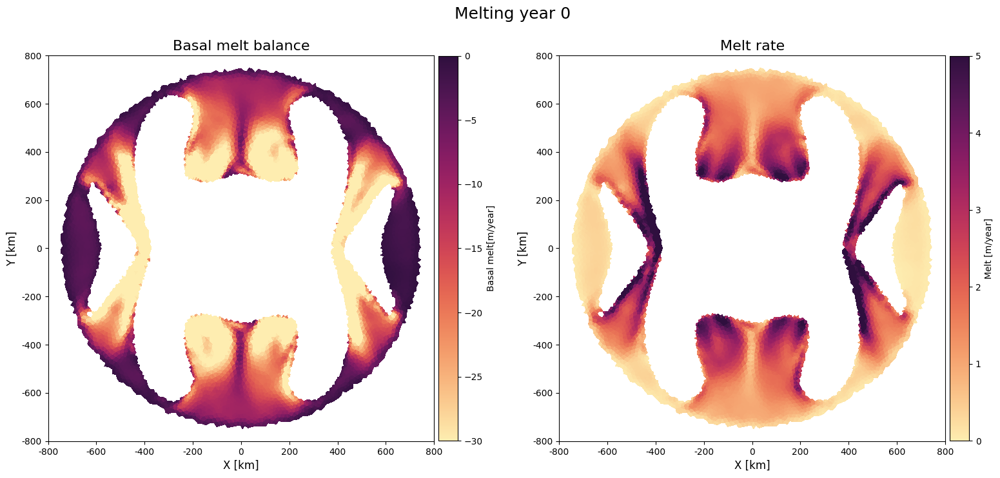

In [15]:
colorbar_kwargs = {
    'aspect': 20,
    'pad': 0.01,
    'shrink': 0.865, 
}
##############################################################################################################################
fig, ax = plt.subplots(1, 2, figsize=(16, 8)) 
fig.suptitle(f'Melting year {u}', fontsize=18, x=0.5, y=0.92)

c0 = ax[0].tripcolor(triang, BMB_l[u].where(mask_ocean & mask_rock), cmap=cmo.matter, vmin = -30, vmax = 0)
fig.colorbar(c0, ax=ax[0], label="Basal melt[m/year]", **colorbar_kwargs)
ax[0].set_title('Basal melt balance', fontsize=14)

c1 = ax[1].tripcolor(triang, melt[u].where(mask_ocean & mask_rock)*24*3600*35, cmap=cmo.matter, vmin = 0, vmax = 5)
fig.colorbar(c1, ax=ax[1], label="Melt [m/year]", **colorbar_kwargs)
ax[1].set_title('Melt rate', fontsize=14)

for j in range(2):
    ax[j].set_aspect('equal')
    ax[j].title.set_fontsize(16)
    ax[j].set_xlabel('X [km]', fontsize=12)
    ax[j].set_ylabel('Y [km]', fontsize=12)
    #ax[j].tripcolor(triang, mask_rock.where(mask_rock), facecolor='beige', edgecolor='none')  # Color masked area in beige
    ax[j].set_xticklabels(np.arange(-n // 1000, n // 1000 + 1, 200))
    ax[j].set_yticks(np.arange(-n, n + 1, 200000))
    ax[j].set_yticklabels(np.arange(-n // 1000, n // 1000 + 1, 200))
    ax[j].set_xlim(-n, n)
    ax[j].set_ylim(-n, n)


plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.show()

### LADDIE 

/var/folders/bv/2cj65x2j5v94fp020tpswb0w0000gn/T/ipykernel_5238/1165813899.py:28: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax[j].set_xticklabels(np.arange(-n // 1000, n // 1000 + 1, 200))
/var/folders/bv/2cj65x2j5v94fp020tpswb0w0000gn/T/ipykernel_5238/1165813899.py:28: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax[j].set_xticklabels(np.arange(-n // 1000, n // 1000 + 1, 200))


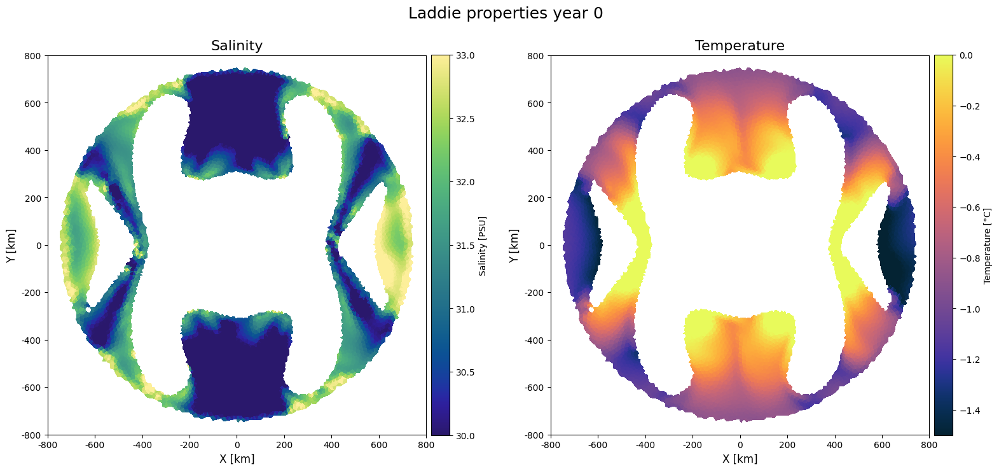

In [16]:
colorbar_kwargs = {
    'aspect': 20,
    'pad': 0.01,
    'shrink': 0.865, 
}
##############################################################################################################################
fig, ax = plt.subplots(1, 2, figsize=(16, 8)) 
fig.suptitle(f'Laddie properties year {u}', fontsize=18, x=0.5, y=0.92)

c0 = ax[0].tripcolor(triang, S_lad[u].where(mask_ocean & mask_rock), cmap=cmo.haline, vmin = 30, vmax = 33)
fig.colorbar(c0, ax=ax[0], label="Salinity [PSU]", **colorbar_kwargs)
ax[0].set_title('Salinity', fontsize=14)
#cont1 = ax[0].tricontour(triang, S_lad[u], levels=[30,31,32,33,34], colors='r', linewidths=1)
#ax[0].clabel(cont1, inline=True, fontsize=8)

c1 = ax[1].tripcolor(triang, T_lad[u].where(mask_ocean & mask_rock), cmap=cmo.thermal, vmin = -1.5, vmax = 0)
fig.colorbar(c1, ax=ax[1], label="Temperature [°C]", **colorbar_kwargs)
ax[1].set_title('Temperature', fontsize=14)
#cont2 = ax[1].tricontour(triang, T_lad[u], levels=[-1.5,-1,-0.5], colors='k', linewidths=1)
#ax[1].clabel(cont2, inline=True, fontsize=8)

for j in range(2):
    ax[j].set_aspect('equal')
    ax[j].title.set_fontsize(16)
    ax[j].set_xlabel('X [km]', fontsize=12)
    ax[j].set_ylabel('Y [km]', fontsize=12)
    #ax[j].tripcolor(triang, mask_rock.where(mask_rock), facecolor='beige', edgecolor='none')  # Color masked area in beige
    ax[j].set_xticklabels(np.arange(-n // 1000, n // 1000 + 1, 200))
    ax[j].set_yticks(np.arange(-n, n + 1, 200000))
    ax[j].set_yticklabels(np.arange(-n // 1000, n // 1000 + 1, 200))
    ax[j].set_xlim(-n, n)
    ax[j].set_ylim(-n, n)


plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.show()

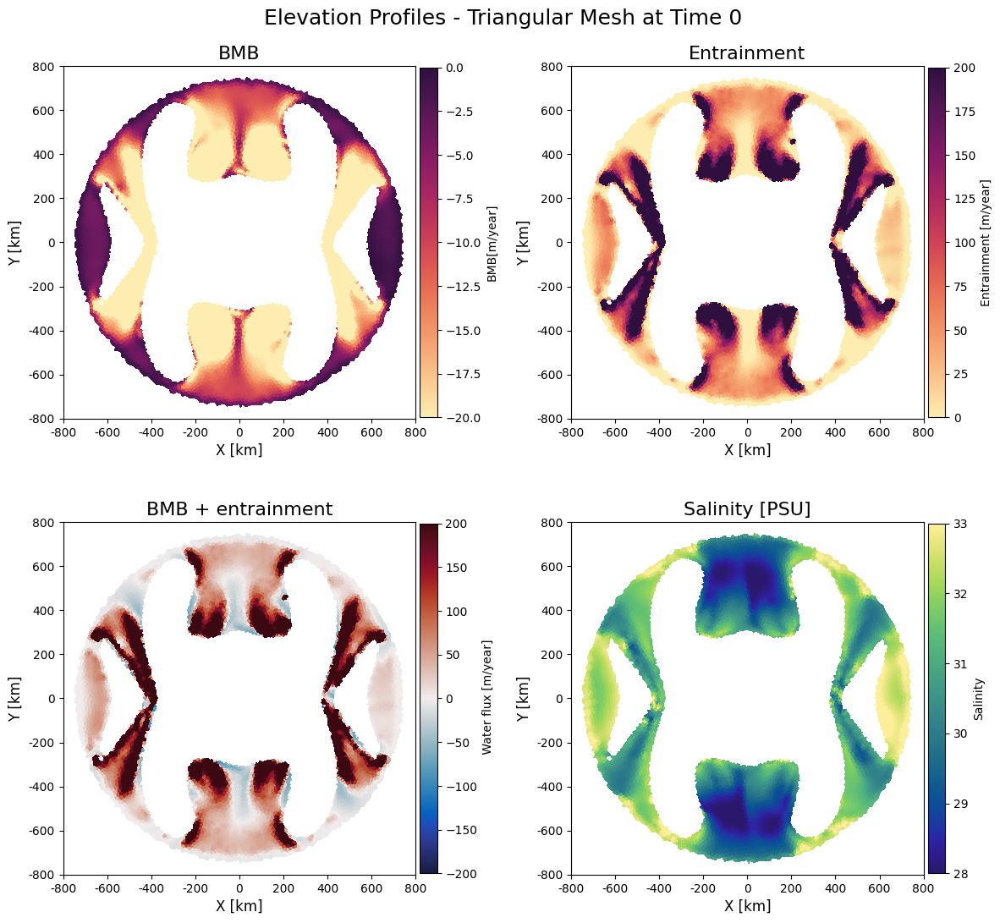

In [17]:
n = 800000

colorbar_kwargs = {
    'aspect': 20,
    'pad': 0.01,
    'shrink': 0.8, 
}
 
u = 0
 #############################################################################################################################

fig, ax = plt.subplots(2, 2, figsize=(12, 12))
fig.suptitle(f'Elevation Profiles - Triangular Mesh at Time {u}', fontsize=18, x=0.5, y=0.92)


c0 = ax[0, 0].tripcolor(triang, BMB_l[u].where(mask_ocean & mask_rock), cmap=cmo.matter, vmin = -20 , vmax = 0)
fig.colorbar(c0, ax=ax[0, 0], label="BMB[m/year]", **colorbar_kwargs)
ax[0, 0].set_title('BMB', fontsize=14)



c1 = ax[0, 1].tripcolor(triang, E[u].where(mask_ocean & mask_rock)*24*3600*365, cmap=cmo.matter, vmin = 0, vmax=200)
fig.colorbar(c1, ax=ax[0, 1], label="Entrainment [m/year]", **colorbar_kwargs)
ax[0, 1].set_title('Entrainment', fontsize=14)



c2 = ax[1, 0].tripcolor(triang, E[u].where(mask_ocean & mask_rock)*24*3600*365+BMB_l[u].where(mask_ocean & mask_rock), cmap=cmo.balance, vmin=-200, vmax=200)
fig.colorbar(c2, ax=ax[1, 0], label=" Water flux [m/year]", **colorbar_kwargs)
ax[1, 0].set_title('BMB + entrainment', fontsize=14)

c3 = ax[1, 1].tripcolor(triang, S_lad[u].where(mask_ocean & mask_rock), cmap=cmo.haline , vmin =28, vmax=33)
fig.colorbar(c3, ax=ax[1, 1], label="Salinity", **colorbar_kwargs)
ax[1, 1].set_title('Salinity [PSU]', fontsize=14)


for i in range(2):
    for j in range(2):
        ax[i, j].set_aspect('equal')
        ax[i, j].title.set_fontsize(16)
        ax[i, j].set_xlabel('X [km]', fontsize=12)
        ax[i, j].set_ylabel('Y [km]', fontsize=12)
        ax[i, j].set_xticks(np.arange(-n, n + 1, 200000))
        ax[i, j].set_xticklabels(np.arange(-n // 1000, n // 1000 + 1, 200))
        ax[i, j].set_yticks(np.arange(-n, n + 1, 200000))
        ax[i, j].set_yticklabels(np.arange(-n // 1000, n // 1000 + 1, 200))
        ax[i, j].set_xlim(-n,n)
        ax[i, j].set_ylim(-n,n)
 


plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.show()




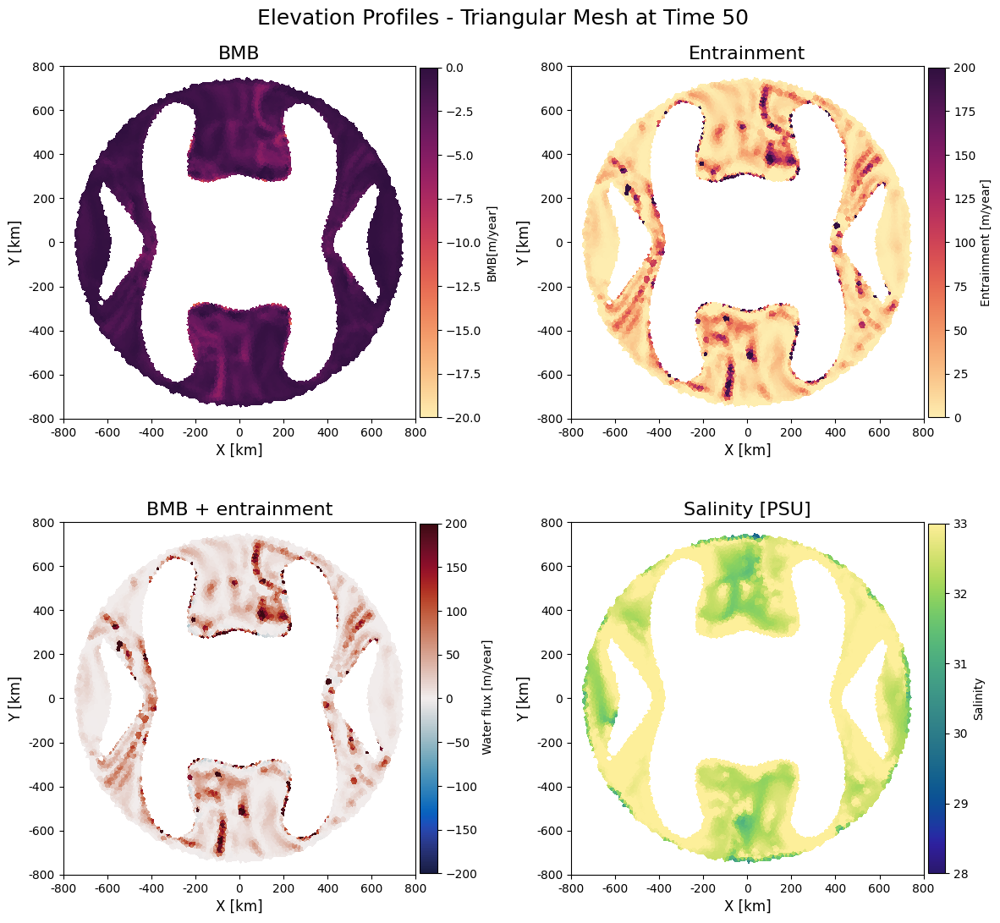

In [18]:
n = 800000

colorbar_kwargs = {
    'aspect': 20,
    'pad': 0.01,
    'shrink': 0.8, 
}
 
u = 50
 #############################################################################################################################

fig, ax = plt.subplots(2, 2, figsize=(12, 12))
fig.suptitle(f'Elevation Profiles - Triangular Mesh at Time {u}', fontsize=18, x=0.5, y=0.92)


c0 = ax[0, 0].tripcolor(triang, BMB_l[u].where(mask_ocean & mask_rock), cmap=cmo.matter, vmin = -20 , vmax = 0)
fig.colorbar(c0, ax=ax[0, 0], label="BMB[m/year]", **colorbar_kwargs)
ax[0, 0].set_title('BMB', fontsize=14)



c1 = ax[0, 1].tripcolor(triang, E[u].where(mask_ocean & mask_rock)*24*3600*365, cmap=cmo.matter, vmin = 0, vmax=200)
fig.colorbar(c1, ax=ax[0, 1], label="Entrainment [m/year]", **colorbar_kwargs)
ax[0, 1].set_title('Entrainment', fontsize=14)



c2 = ax[1, 0].tripcolor(triang, E[u].where(mask_ocean & mask_rock)*24*3600*365+BMB_l[u].where(mask_ocean & mask_rock), cmap=cmo.balance, vmin=-200, vmax=200)
fig.colorbar(c2, ax=ax[1, 0], label=" Water flux [m/year]", **colorbar_kwargs)
ax[1, 0].set_title('BMB + entrainment', fontsize=14)

c3 = ax[1, 1].tripcolor(triang, S_lad[u].where(mask_ocean & mask_rock), cmap=cmo.haline , vmin =28, vmax=33)
fig.colorbar(c3, ax=ax[1, 1], label="Salinity", **colorbar_kwargs)
ax[1, 1].set_title('Salinity [PSU]', fontsize=14)


for i in range(2):
    for j in range(2):
        ax[i, j].set_aspect('equal')
        ax[i, j].title.set_fontsize(16)
        ax[i, j].set_xlabel('X [km]', fontsize=12)
        ax[i, j].set_ylabel('Y [km]', fontsize=12)
        ax[i, j].set_xticks(np.arange(-n, n + 1, 200000))
        ax[i, j].set_xticklabels(np.arange(-n // 1000, n // 1000 + 1, 200))
        ax[i, j].set_yticks(np.arange(-n, n + 1, 200000))
        ax[i, j].set_yticklabels(np.arange(-n // 1000, n // 1000 + 1, 200))
        ax[i, j].set_xlim(-n,n)
        ax[i, j].set_ylim(-n,n)
 


plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.show()




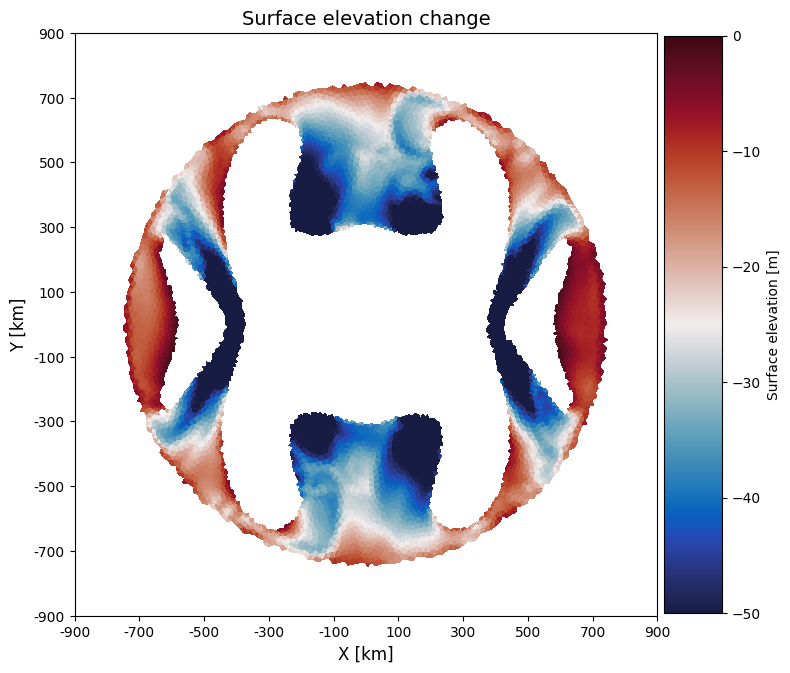

In [19]:
colorbar_kwargs = {
    'aspect': 10,
    'pad': 0.01,
    'shrink': 0.75, 
}

n = 900000
##############################################################################################################################
fig, ax = plt.subplots(1, 1, figsize=(8, 8)) 

c0 = ax.tripcolor(triang, (Hs_l[-1]-Hs_l[0]).where(mask_ocean & mask_rock), cmap=cmo.balance, vmin=-50, vmax=0)
fig.colorbar(c0, ax=ax, label="Surface elevation [m]", **colorbar_kwargs)
ax.set_title('Surface elevation change', fontsize=14)

ax.set_xlabel('X [km]', fontsize=12)
ax.set_ylabel('Y [km]', fontsize=12)
ax.set_xticks(np.arange(-n, n + 1, 200000))
ax.set_xticklabels(np.arange(-n // 1000, n // 1000 + 1, 200))
ax.set_yticks(np.arange(-n, n + 1, 200000))
ax.set_yticklabels(np.arange(-n // 1000, n // 1000 + 1, 200))
ax.set_xlim(-n, n)
ax.set_ylim(-n, n)
ax.set_aspect('equal')

plt.tight_layout()
plt.show()

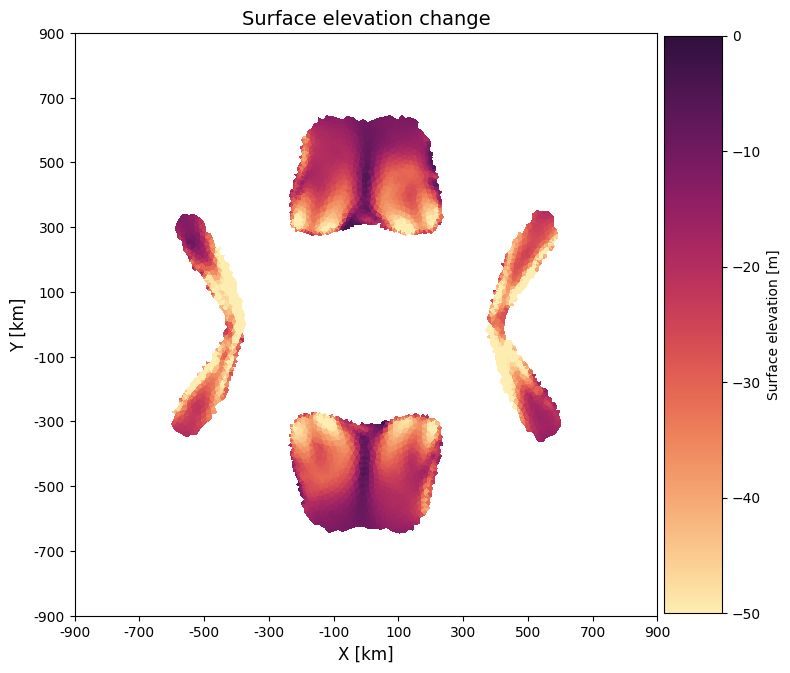

In [13]:
BMB =  BMB_l[0].where(mask_ocean & mask_rock & (Hib_l[0] <(-300)))
colorbar_kwargs = {
    'aspect': 10,
    'pad': 0.01,
    'shrink': 0.75, 
}

n = 900000
##############################################################################################################################
fig, ax = plt.subplots(1, 1, figsize=(8, 8)) 

c0 = ax.tripcolor(triang, BMB_l[0].where(mask_ocean & mask_rock & (Hib_l[0] <(-300))), cmap=cmo.matter, vmin=-50, vmax=0)
fig.colorbar(c0, ax=ax, label="Surface elevation [m]", **colorbar_kwargs)
ax.set_title('Surface elevation change', fontsize=14)

ax.set_xlabel('X [km]', fontsize=12)
ax.set_ylabel('Y [km]', fontsize=12)
ax.set_xticks(np.arange(-n, n + 1, 200000))
ax.set_xticklabels(np.arange(-n // 1000, n // 1000 + 1, 200))
ax.set_yticks(np.arange(-n, n + 1, 200000))
ax.set_yticklabels(np.arange(-n // 1000, n // 1000 + 1, 200))
ax.set_xlim(-n, n)
ax.set_ylim(-n, n)
ax.set_aspect('equal')

plt.tight_layout()
plt.show()

In [14]:
BMB.mean().values

array(-28.90021816)

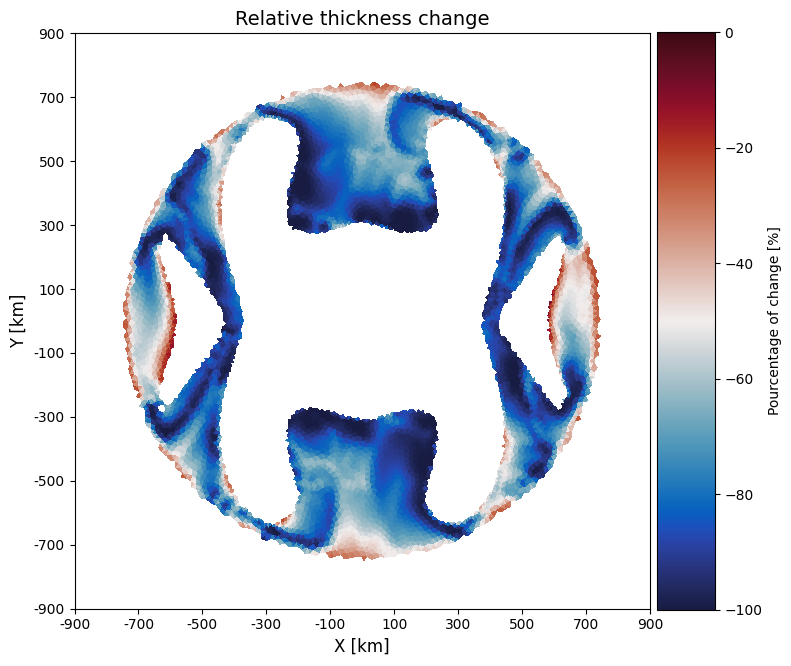

In [48]:
colorbar_kwargs = {
    'aspect': 10,
    'pad': 0.01,
    'shrink': 0.75, 
}

n = 900000
##############################################################################################################################
fig, ax = plt.subplots(1, 1, figsize=(8, 8)) 

c0 = ax.tripcolor(triang, (Hi_l[-1]-Hi_l[0])/(Hi_l[0]).where(mask_ocean & mask_rock)*100, cmap=cmo.balance, vmin=-100, vmax= 0)
fig.colorbar(c0, ax=ax, label="Pourcentage of change [%]", **colorbar_kwargs)
ax.set_title('Relative thickness change', fontsize=14)

ax.set_xlabel('X [km]', fontsize=12)
ax.set_ylabel('Y [km]', fontsize=12)
ax.set_xticks(np.arange(-n, n + 1, 200000))
ax.set_xticklabels(np.arange(-n // 1000, n // 1000 + 1, 200))
ax.set_yticks(np.arange(-n, n + 1, 200000))
ax.set_yticklabels(np.arange(-n // 1000, n // 1000 + 1, 200))
ax.set_xlim(-n, n)
ax.set_ylim(-n, n)
ax.set_aspect('equal')

plt.tight_layout()
plt.show()

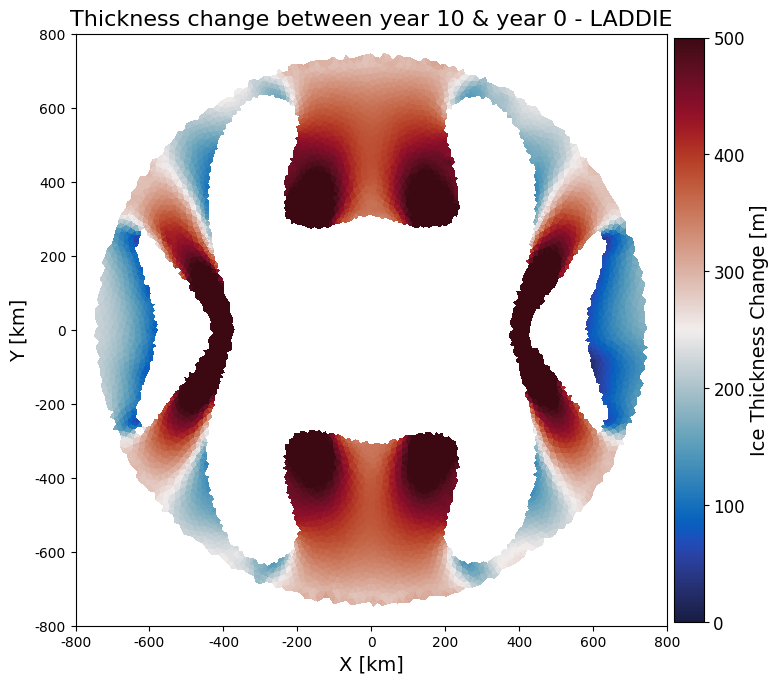

In [35]:
colorbar_kwargs = {
    'aspect': 20,
    'pad': 0.01,
    'shrink': 0.76, 
}

n = 800000
##############################################################################################################################
fig, ax = plt.subplots(1, 1, figsize=(8, 8)) 

c0 = ax.tripcolor(triang, Hi_l[0].where(mask_ocean & mask_rock), cmap=cmo.balance, vmin=0, vmax=500)
cbar = fig.colorbar(c0, ax=ax, **colorbar_kwargs)
cbar.set_label("Ice Thickness Change [m]", fontsize=14)  # Set fontsize here
cbar.ax.tick_params(labelsize=12)
ax.set_title('Thickness change between year 10 & year 0 - LADDIE', fontsize=16)

ax.set_xlabel('X [km]', fontsize=14)
ax.set_ylabel('Y [km]', fontsize=14)
ax.set_xticks(np.arange(-n, n + 1, 200000))
ax.set_xticklabels(np.arange(-n // 1000, n // 1000 + 1, 200))
ax.set_yticks(np.arange(-n, n + 1, 200000))
ax.set_yticklabels(np.arange(-n // 1000, n // 1000 + 1, 200))
ax.set_xlim(-n, n)
ax.set_ylim(-n, n)
ax.set_aspect('equal')

plt.tight_layout()
plt.show()

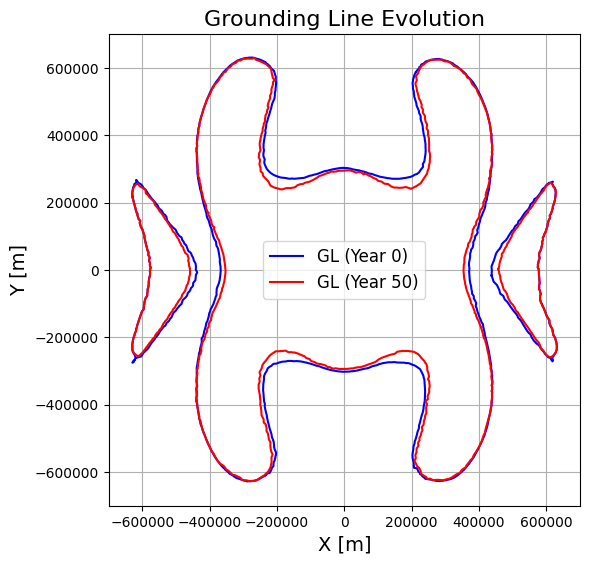

In [111]:
L = Lad['grounding_line'][0]
L50 = Lad['grounding_line'][50]

plt.figure(figsize=(6, 6))
plt.plot(L[0, :], L[1, :], label='GL (Year 0)', color='blue')
plt.plot(L50[0, :], L50[1, :], label='GL (Year 50)', color='red')

plt.title('Grounding Line Evolution', fontsize=16)
plt.xlabel('X [m]', fontsize=14)
plt.ylabel('Y [m]', fontsize=14)
plt.legend(fontsize=12)
plt.grid(True)
 # Ensure equal scaling for X and Y axes
plt.xlim(-700000, 700000)
plt.ylim(-700000, 700000)
plt.tight_layout()
plt.gca().set_aspect('equal', adjustable='box')
plt.show()

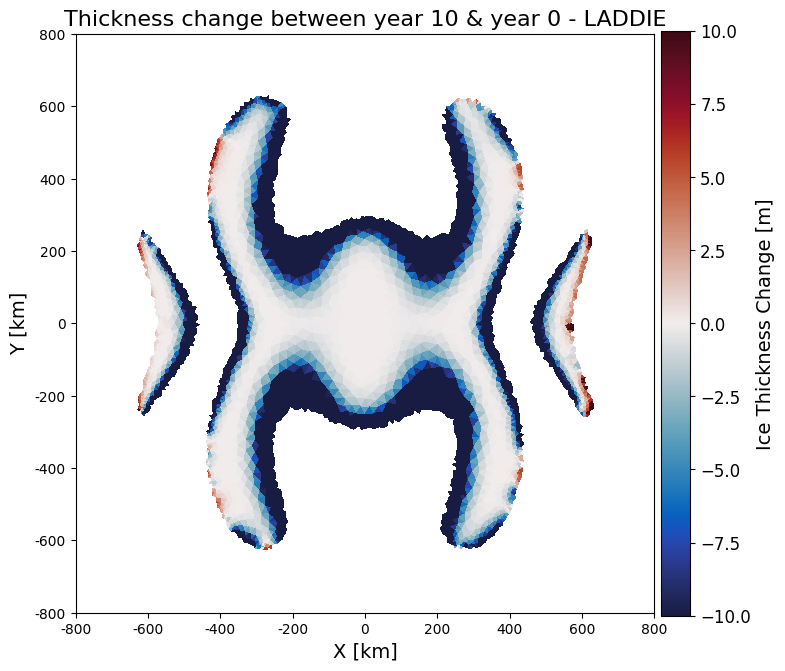

In [117]:
colorbar_kwargs = {
    'aspect': 20,
    'pad': 0.01,
    'shrink': 0.76, 
}

n = 800000
##############################################################################################################################
fig, ax = plt.subplots(1, 1, figsize=(8, 8)) 
u = 0 
p = 0.01
mask_floating = (Hs_l[u] - Hi_l[u] - Hb_l[u] <= p)
mask_rock= ~mask_floating
Hi_l0 = Hi_l[0].where(mask_ocean & ~mask_rock) 

u = 50 
p = 0.01
mask_floating = (Hs_l[u] - Hi_l[u] - Hb_l[u] <= p)
mask_rock50= ~mask_floating
Hi_l50 = Hi_l[50].where(mask_ocean & ~mask_rock50) 

c0 = ax.tripcolor(triang, (Hi_l50-Hi_l0), cmap=cmo.balance, vmin=-10, vmax= 10)
cbar = fig.colorbar(c0, ax=ax, **colorbar_kwargs)
cbar.set_label("Ice Thickness Change [m]", fontsize=14)  # Set fontsize here
cbar.ax.tick_params(labelsize=12)
ax.set_title('Thickness change between year 10 & year 0 - LADDIE', fontsize=16)

ax.set_xlabel('X [km]', fontsize=14)
ax.set_ylabel('Y [km]', fontsize=14)
ax.set_xticks(np.arange(-n, n + 1, 200000))
ax.set_xticklabels(np.arange(-n // 1000, n // 1000 + 1, 200))
ax.set_yticks(np.arange(-n, n + 1, 200000))
ax.set_yticklabels(np.arange(-n // 1000, n // 1000 + 1, 200))
ax.set_xlim(-n, n)
ax.set_ylim(-n, n)
ax.set_aspect('equal')

plt.tight_layout()
plt.show()

In [119]:
(Hi_l50-Hi_l0).mean().values

array(-22.3456531)

In [96]:
data = (Hi_l[10]-Hi_l[0]).where(mask_ocean & mask_rock)

In [52]:
import numpy as np
import matplotlib.pyplot as plt
import cmocean

# Assuming your data range is similar to the tripcolor plot (-400 to 0)
data_min, data_max = -400, 0

plt.figure(figsize=(10, 6))
values = data.values.flatten()

# Create a normalized colormap
norm = plt.Normalize(vmin=data_min, vmax=data_max)
cmap = cmo.balance

# Get colors for each value using the colormap
colors = cmap(norm(values))

# Create histogram with colored bars
n, bins, patches = plt.hist(values, bins=100, alpha=0.7, edgecolor='black')

# Color each bar according to its bin center
for i, (bin_start, bin_end) in enumerate(zip(bins[:-1], bins[1:])):
    bin_center = (bin_start + bin_end) / 2
    patches[i].set_facecolor(cmap(norm(bin_center)))

average = np.nanmean(values)  # Calculate the average, ignoring NaN values
plt.axvline(x=average, color='black', linestyle='-', linewidth=1.5, label=f'Average: {average:.2f}')
plt.legend(fontsize=14)

std = np.nanstd(values)  # Calculate the average, ignoring NaN values
plt.axvline(x=std +average, color='black', linestyle='--', linewidth=1.5, label=f'Standard deviation: $\pm$ {std:.2f}')
plt.axvline(x=-std +average, color='black', linestyle='--', linewidth=1.5)
plt.legend(fontsize=14)

plt.title('Thickness change between year 10 & year 0 - LADDIE', fontsize=16)
plt.xlabel('Ice Thickness Change [m]', fontsize=14)
plt.ylabel('Frequency', fontsize=14)
plt.grid(axis='y', alpha=0.75)

# Add colorbar to show the mapping
sm = plt.cm.ScalarMappable(cmap=cmap, norm=norm)
sm.set_array([])
cbar = plt.colorbar(sm)
cbar.set_label('Ice Thickness Change [m]', fontsize=14)
cbar.ax.tick_params(labelsize=12)

plt.show()

NameError: name 'data' is not defined

<Figure size 1000x600 with 0 Axes>

In [ ]:
(Hi_l[10]-Hi_l[0]).where(mask_ocean & mask_rock).min()

In [31]:
(Hi_l[10]-Hi_l[0]).where(mask_ocean & mask_rock).max()
data = (Hi_l[10] - Hi_l[0]).where(mask_ocean & mask_rock)
percentage_positive = (data > 0).sum() / data.count() * 100
percentage_positive

<xarray.DataArray 'Hi' ()> Size: 8B
array(0.)
Coordinates:
    time     float64 8B 0.0

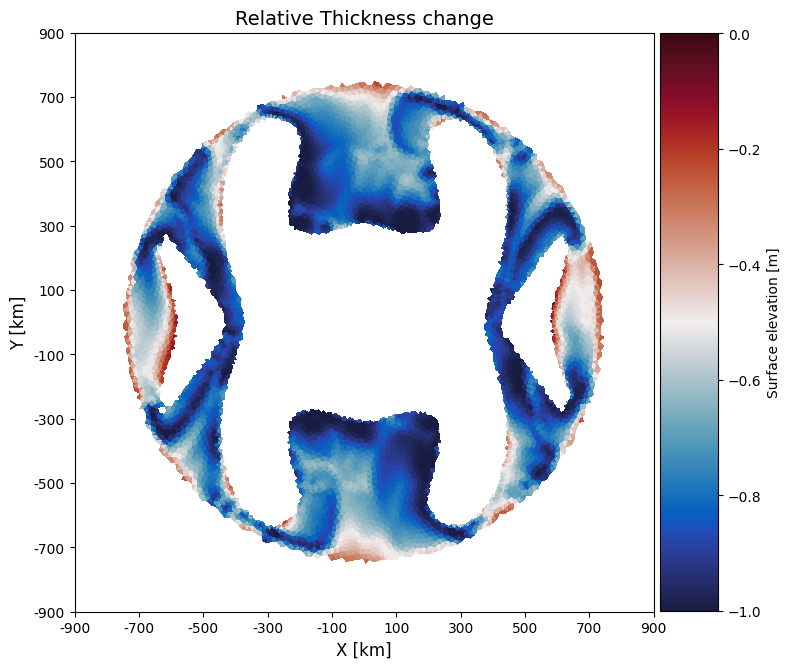

In [ ]:
colorbar_kwargs = {
    'aspect': 10,
    'pad': 0.01,
    'shrink': 0.75, 
}

n = 900000
##############################################################################################################################
fig, ax = plt.subplots(1, 1, figsize=(8, 8)) 

c0 = ax.tripcolor(triang, ((Hi_l[-1]-Hi_l[0])/Hi_l[0]).where(mask_ocean & mask_rock), cmap=cmo.balance, vmin=-1, vmax= 0)
fig.colorbar(c0, ax=ax, label="Surface elevation [m]", **colorbar_kwargs)
ax.set_title('Relative Thickness change', fontsize=14)

ax.set_xlabel('X [km]', fontsize=12)
ax.set_ylabel('Y [km]', fontsize=12)
ax.set_xticks(np.arange(-n, n + 1, 200000))
ax.set_xticklabels(np.arange(-n // 1000, n // 1000 + 1, 200))
ax.set_yticks(np.arange(-n, n + 1, 200000))
ax.set_yticklabels(np.arange(-n // 1000, n // 1000 + 1, 200))
ax.set_xlim(-n, n)
ax.set_ylim(-n, n)
ax.set_aspect('equal')

plt.tight_layout()
plt.show()

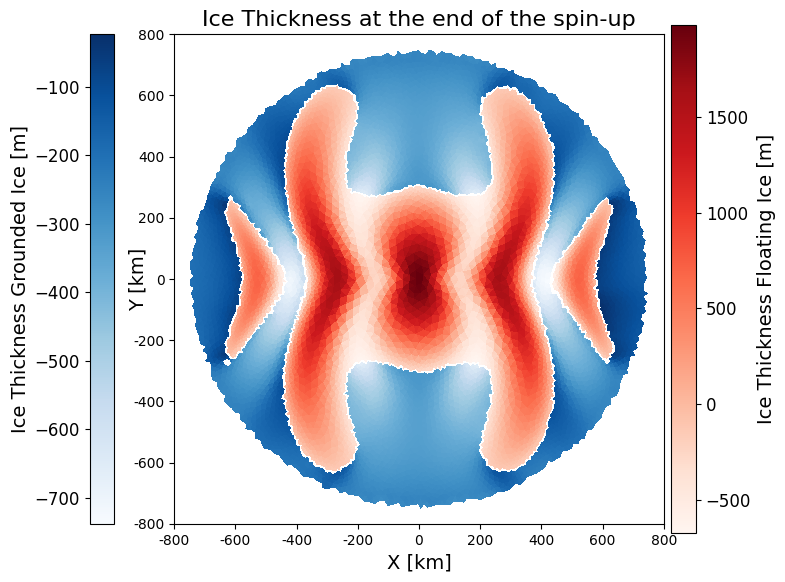

In [11]:
colorbar_kwargs = {
    'aspect': 20,
    'pad': 0.01,
    'shrink': 0.66, 
}

n = 800000
##############################################################################################################################
fig, ax = plt.subplots(1, 1, figsize=(8, 8)) 

# Plot floating ice
c0 = ax.tripcolor(triang, (Hib_l[0]).where(mask_ocean & mask_floating), cmap='Reds')#, vmin=0, vmax=800)
# Add color bar for floating ice
cbar0 = fig.colorbar(c0, ax=ax, **colorbar_kwargs)
cbar0.set_label("Ice Thickness Floating Ice [m]", fontsize=14)
cbar0.ax.tick_params(labelsize=12)

# Plot grounded ice
c1 = ax.tripcolor(triang, (Hib_l[0]).where(mask_ocean & mask_rock), cmap='Blues')#, vmin=0, vmax=800)
# Add color bar for grounded ice on the left
divider = make_axes_locatable(ax)
cax1 = divider.append_axes("left", size="5%", pad=0.6)
cbar1 = fig.colorbar(c1, cax=cax1)
cbar1.set_label("Ice Thickness Grounded Ice [m]", fontsize=14)
cbar1.ax.tick_params(labelsize=12)
cax1.yaxis.set_label_position('left')
cax1.yaxis.tick_left()

ax.set_title('Ice Thickness at the end of the spin-up', fontsize=16)
ax.set_xlabel('X [km]', fontsize=14)
ax.set_ylabel('Y [km]', fontsize=14, labelpad=-10)
ax.set_xticks(np.arange(-n, n + 1, 200000))
ax.set_xticklabels(np.arange(-n // 1000, n // 1000 + 1, 200))
ax.set_yticks(np.arange(-n, n + 1, 200000))
ax.set_yticklabels(np.arange(-n // 1000, n // 1000 + 1, 200))
ax.set_xlim(-n, n)
ax.set_ylim(-n, n)
ax.set_aspect('equal')

plt.tight_layout()
plt.show()

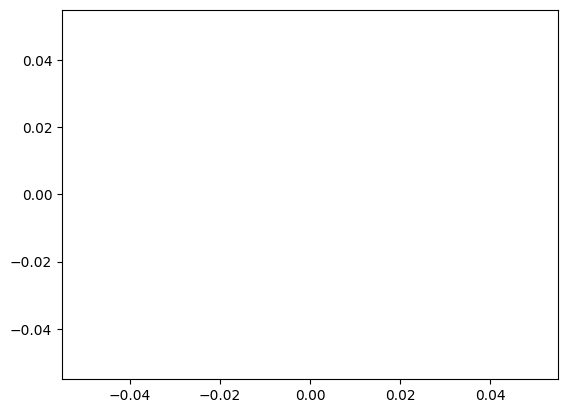

In [ ]:
def triangle_area(vertex1, vertex2, vertex3):
    """
    Calculate the area of a triangle given its three vertices in 2D space.
    
    Parameters:
    vertex1, vertex2, vertex3 : tuples or lists of length 2
        The (x, y) coordinates of the three vertices of the triangle.
    
    Returns:
    float
        The area of the triangle.
    """
    x1, y1 = vertex1
    x2, y2 = vertex2
    x3, y3 = vertex3
    
    area = 0.5 * abs((x1*(y2 - y3) + x2*(y3 - y1) + x3*(y1 - y2))
    return area

In [19]:
Hib_l[10].where(mask_ocean & mask_floating)

<xarray.DataArray 'Hib' (vi: 12346)> Size: 99kB
array([nan, nan, nan, ..., nan, nan, nan], shape=(12346,))
Dimensions without coordinates: vi
Attributes:
    long_name:  Ice base elevation
    units:      m w.r.t. PD sea level

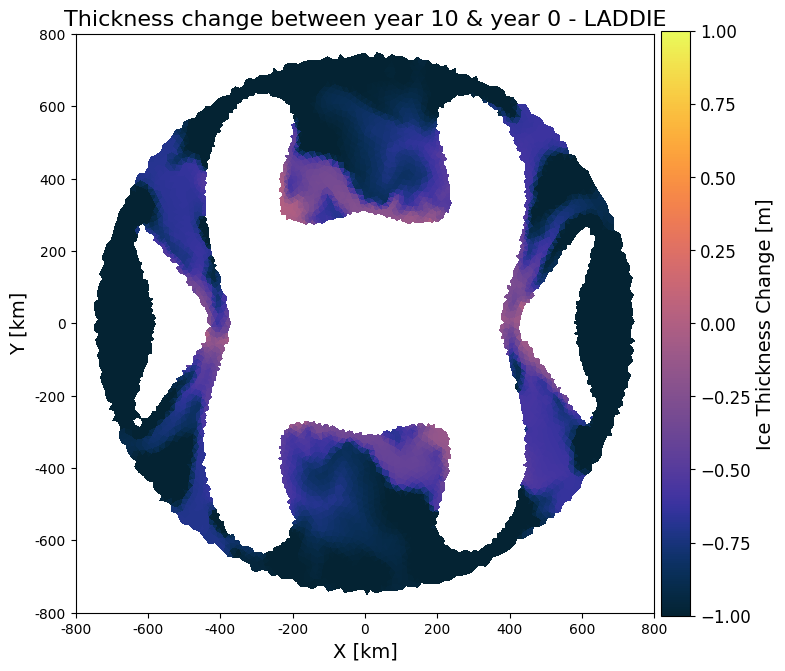

In [17]:
colorbar_kwargs = {
    'aspect': 20,
    'pad': 0.01,
    'shrink': 0.76, 
}

n = 800000
##############################################################################################################################
fig, ax = plt.subplots(1, 1, figsize=(8, 8)) 

c0 = ax.tripcolor(triang, (T_lad[10]).where(mask_ocean & mask_rock), cmap=cmo.thermal, vmin=-1, vmax= 1)
cbar = fig.colorbar(c0, ax=ax, **colorbar_kwargs)
cbar.set_label("Ice Thickness Change [m]", fontsize=14)  # Set fontsize here
cbar.ax.tick_params(labelsize=12)
ax.set_title('Thickness change between year 10 & year 0 - LADDIE', fontsize=16)

ax.set_xlabel('X [km]', fontsize=14)
ax.set_ylabel('Y [km]', fontsize=14)
ax.set_xticks(np.arange(-n, n + 1, 200000))
ax.set_xticklabels(np.arange(-n // 1000, n // 1000 + 1, 200))
ax.set_yticks(np.arange(-n, n + 1, 200000))
ax.set_yticklabels(np.arange(-n // 1000, n // 1000 + 1, 200))
ax.set_xlim(-n, n)
ax.set_ylim(-n, n)
ax.set_aspect('equal')

plt.tight_layout()
plt.show()

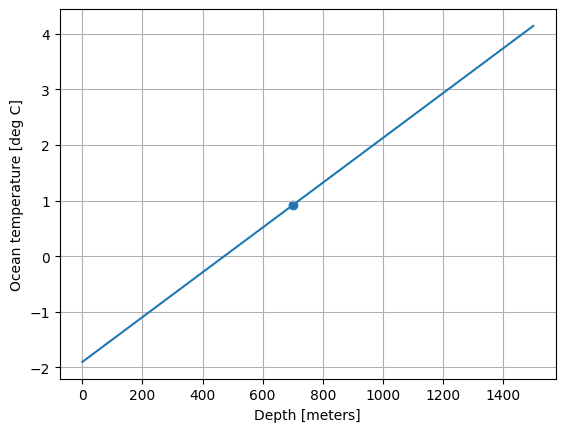

In [34]:
To[:,1].plot()
plt.grid()
plt.scatter(700,a*700 +b )

In [11]:
def Tocean(d):
    a =(To[-1,1].values - To[0,1].values)/ 1500
    b = To[0,1].values
    return a * d + b
Tocean(-700)



np.float64(-4.719444444444445)

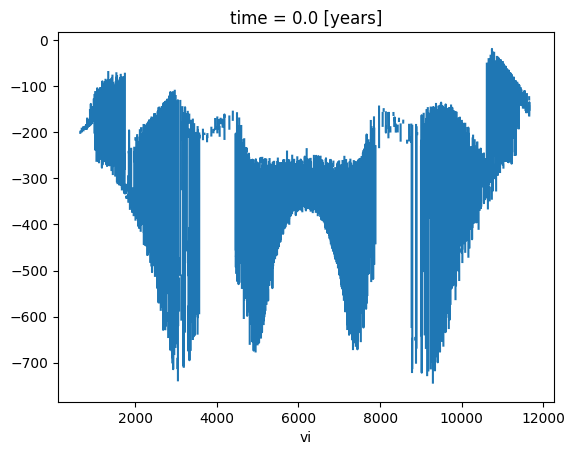

In [80]:
(Hib_l[0]-H_lad[0]).where(mask_ocean & mask_rock).plot()

<xarray.DataArray ()> Size: 8B
array(-1.82169347)
Coordinates:
    time     float64 8B 0.0

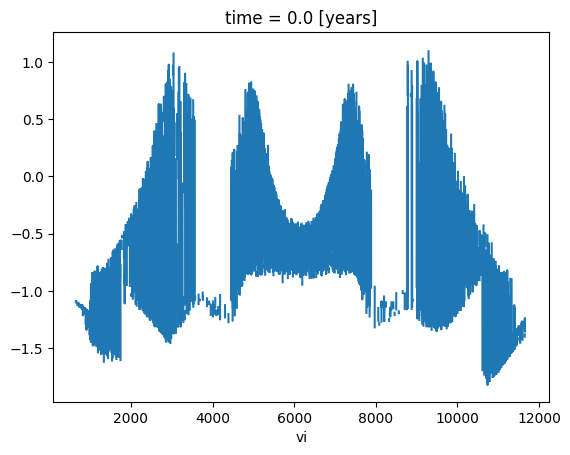

In [74]:
temp = Tocean(-(Hib_l[0]-H_lad[0]).where(mask_ocean & mask_rock))
temp.plot()
temp.min()

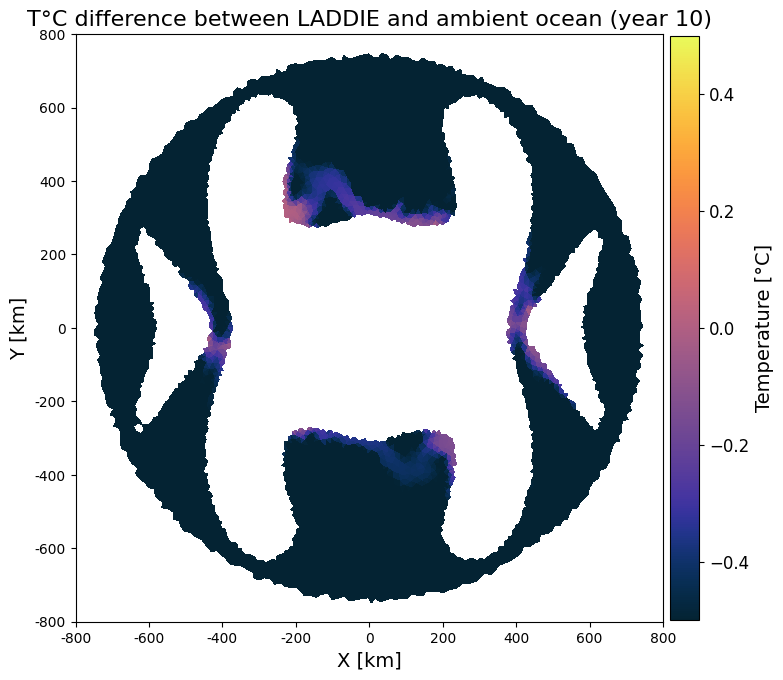

In [12]:
colorbar_kwargs = {
    'aspect': 20,
    'pad': 0.01,
    'shrink': 0.76, 
}

n = 800000
u = 10
##############################################################################################################################
fig, ax = plt.subplots(1, 1, figsize=(8, 8)) 

Temp = Tocean(-(Hib_l[0]-H_lad[0]).where(mask_ocean & mask_rock))
Tem = T_lad[u].where(mask_ocean & mask_rock)
c0 = ax.tripcolor(triang, Tem, cmap=cmo.thermal, vmin=-0.5, vmax= 0.5)
cbar = fig.colorbar(c0, ax=ax, **colorbar_kwargs)
cbar.set_label("Temperature [°C]", fontsize=14)  # Set fontsize here
cbar.ax.tick_params(labelsize=12)
ax.set_title('T°C difference between LADDIE and ambient ocean (year 10)', fontsize=16)

ax.set_xlabel('X [km]', fontsize=14)
ax.set_ylabel('Y [km]', fontsize=14)
ax.set_xticks(np.arange(-n, n + 1, 200000))
ax.set_xticklabels(np.arange(-n // 1000, n // 1000 + 1, 200))
ax.set_yticks(np.arange(-n, n + 1, 200000))
ax.set_yticklabels(np.arange(-n // 1000, n // 1000 + 1, 200))
ax.set_xlim(-n, n)
ax.set_ylim(-n, n)
ax.set_aspect('equal')

plt.tight_layout()
plt.show()

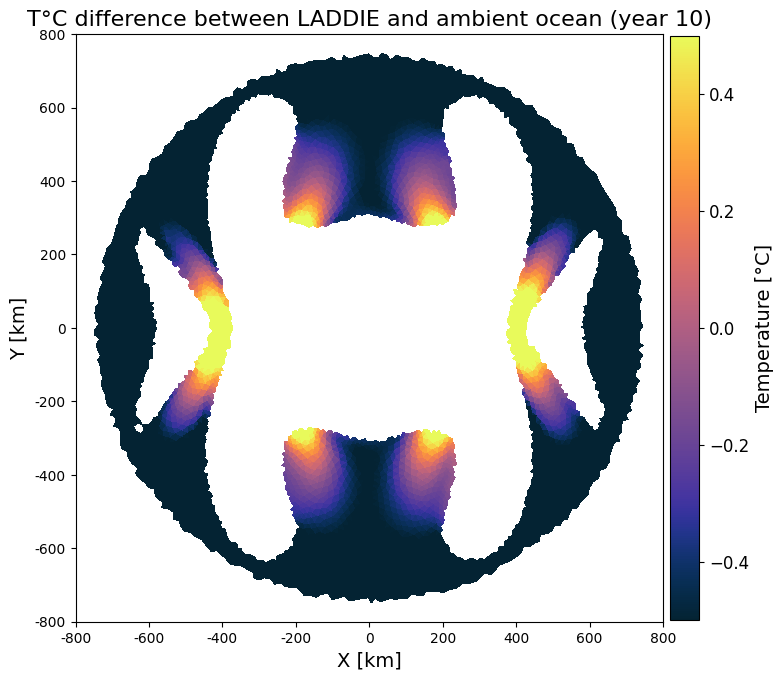

In [13]:
colorbar_kwargs = {
    'aspect': 20,
    'pad': 0.01,
    'shrink': 0.76, 
}

n = 800000
u = 5
##############################################################################################################################
fig, ax = plt.subplots(1, 1, figsize=(8, 8)) 

Temp = Tocean(-(Hib_l[0]-H_lad[0]).where(mask_ocean & mask_rock))
Tem = T_lad[u].where(mask_ocean & mask_rock)
c0 = ax.tripcolor(triang, Temp, cmap=cmo.thermal, vmin=-0.5, vmax= 0.5)
cbar = fig.colorbar(c0, ax=ax, **colorbar_kwargs)
cbar.set_label("Temperature [°C]", fontsize=14)  # Set fontsize here
cbar.ax.tick_params(labelsize=12)
ax.set_title('T°C difference between LADDIE and ambient ocean (year 10)', fontsize=16)

ax.set_xlabel('X [km]', fontsize=14)
ax.set_ylabel('Y [km]', fontsize=14)
ax.set_xticks(np.arange(-n, n + 1, 200000))
ax.set_xticklabels(np.arange(-n // 1000, n // 1000 + 1, 200))
ax.set_yticks(np.arange(-n, n + 1, 200000))
ax.set_yticklabels(np.arange(-n // 1000, n // 1000 + 1, 200))
ax.set_xlim(-n, n)
ax.set_ylim(-n, n)
ax.set_aspect('equal')

plt.tight_layout()
plt.show()

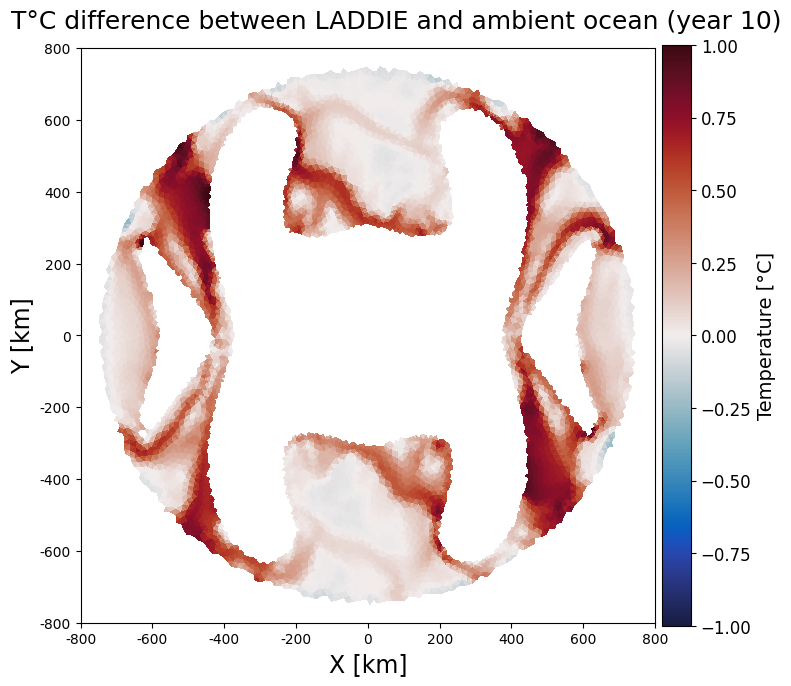

In [38]:
colorbar_kwargs = {
    'aspect': 20,
    'pad': 0.01,
    'shrink': 0.76, 
}

n = 800000
u = 10
##############################################################################################################################
fig, ax = plt.subplots(1, 1, figsize=(8, 8)) 

Temp = Tocean(-(Hib_l[u]-H_lad[u]).where(mask_ocean & mask_rock))
Tem = T_lad[u].where(mask_ocean & mask_rock)
c0 = ax.tripcolor(triang, Tem-Temp, cmap=cmo.balance, vmin=-1, vmax= 1)
cbar = fig.colorbar(c0, ax=ax, **colorbar_kwargs)
cbar.set_label("Temperature [°C]", fontsize=14)  # Set fontsize here
cbar.ax.tick_params(labelsize=12)
ax.set_title('T°C difference between LADDIE and ambient ocean (year 10)', fontsize=18, x = 0.55, y = 1.02)

ax.set_xlabel('X [km]', fontsize=17)
ax.set_ylabel('Y [km]', fontsize=17)
ax.set_xticks(np.arange(-n, n + 1, 200000))
ax.set_xticklabels(np.arange(-n // 1000, n // 1000 + 1, 200))
ax.set_yticks(np.arange(-n, n + 1, 200000))
ax.set_yticklabels(np.arange(-n // 1000, n // 1000 + 1, 200))
ax.set_xlim(-n, n)
ax.set_ylim(-n, n)
ax.set_aspect('equal')

plt.tight_layout()
plt.show()

ValueError: Unable to determine Axes to steal space for Colorbar. Either provide the *cax* argument to use as the Axes for the Colorbar, provide the *ax* argument to steal space from it, or add *mappable* to an Axes.

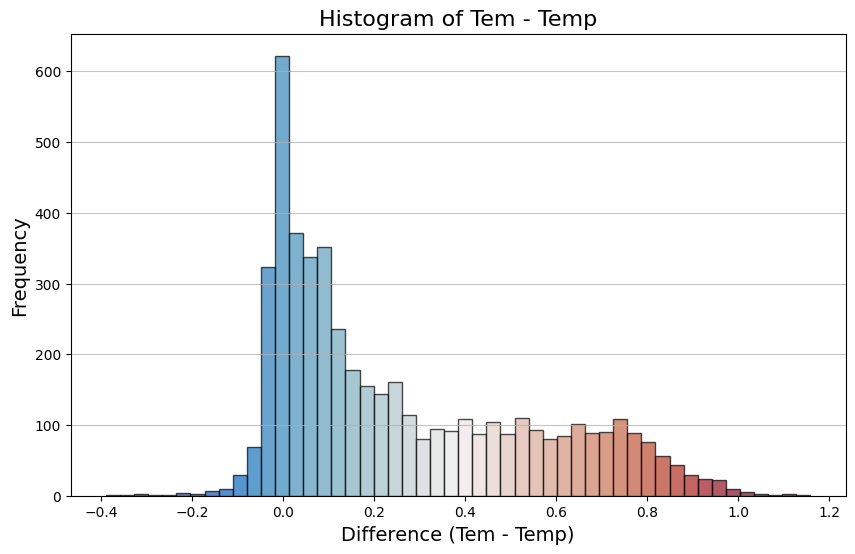

In [34]:
import cmocean

import matplotlib.pyplot as plt

# Flatten the data and remove NaN values
values = (Tem - Temp).values.flatten()
values = values[~np.isnan(values)]

# Create a histogram
plt.figure(figsize=(10, 6))
n, bins, patches = plt.hist(values, bins=50, alpha=0.7, edgecolor='black')

# Apply a colormap to the histogram bars
cmap = cmo.balance
norm = plt.Normalize(vmin=values.min(), vmax=values.max())
for i, patch in enumerate(patches):
    patch.set_facecolor(cmap(norm((bins[i] + bins[i + 1]) / 2)))

# Add labels and title
plt.title('Histogram of Tem - Temp', fontsize=16)
plt.xlabel('Difference (Tem - Temp)', fontsize=14)
plt.ylabel('Frequency', fontsize=14)
plt.grid(axis='y', alpha=0.75)

# Add a colorbar
sm = plt.cm.ScalarMappable(cmap=cmap, norm=norm)
sm.set_array([])
cbar = plt.colorbar(sm)
cbar.set_label('Difference (Tem - Temp)', fontsize=14)
cbar.ax.tick_params(labelsize=12)

plt.show()

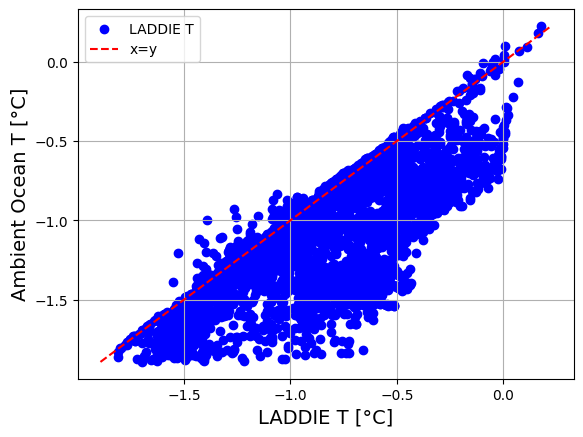

In [30]:
plt.scatter(Tem,Temp, color = 'blue', label = 'LADDIE T')
plt.plot([min(Tem.min(), Temp.min()), max(Tem.max(), Temp.max())], 
         [min(Tem.min(), Temp.min()), max(Tem.max(), Temp.max())], 
         color='red', linestyle='--', label='x=y')
plt.xlabel('LADDIE T [°C]', fontsize=14)
plt.ylabel('Ambient Ocean T [°C]', fontsize=14)
plt.legend()
plt.grid()

In [25]:
(Tem-Temp).max()

<xarray.DataArray ()> Size: 8B
array(1.15890281)

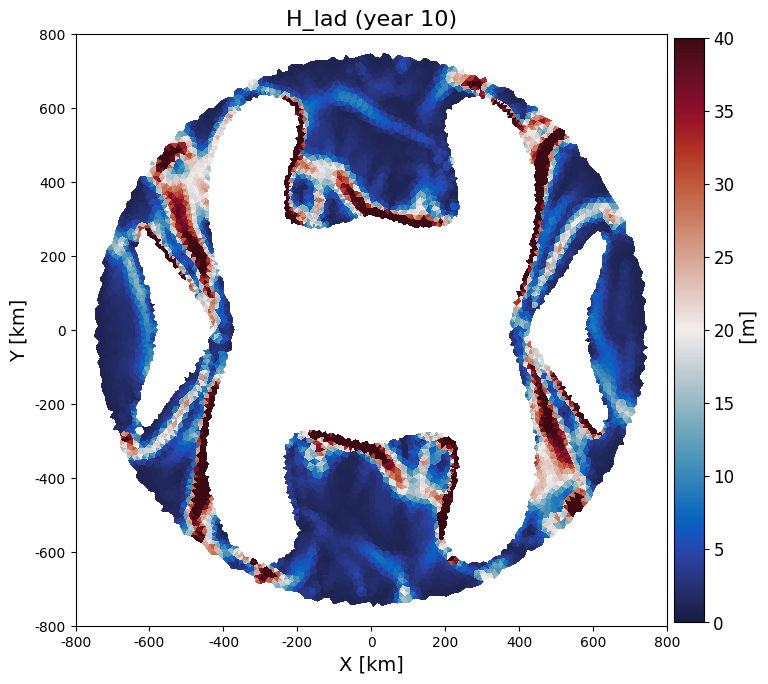

In [24]:
colorbar_kwargs = {
    'aspect': 20,
    'pad': 0.01,
    'shrink': 0.76, 
}

n = 800000
u = 10
##############################################################################################################################
fig, ax = plt.subplots(1, 1, figsize=(8, 8)) 


c0 = ax.tripcolor(triang, H_lad[10].where(mask_ocean &mask_rock), cmap=cmo.balance, vmin= 0, vmax= 40)
cbar = fig.colorbar(c0, ax=ax, **colorbar_kwargs)
cbar.set_label(" [m]", fontsize=14)  # Set fontsize here
cbar.ax.tick_params(labelsize=12)
ax.set_title('H_lad (year 10)', fontsize=16)

ax.set_xlabel('X [km]', fontsize=14)
ax.set_ylabel('Y [km]', fontsize=14)
ax.set_xticks(np.arange(-n, n + 1, 200000))
ax.set_xticklabels(np.arange(-n // 1000, n // 1000 + 1, 200))
ax.set_yticks(np.arange(-n, n + 1, 200000))
ax.set_yticklabels(np.arange(-n // 1000, n // 1000 + 1, 200))
ax.set_xlim(-n, n)
ax.set_ylim(-n, n)
ax.set_aspect('equal')

plt.tight_layout()
plt.show()

In [86]:
print(T_lad[10].max(),T_lad[10].min())

<xarray.DataArray 'T_lad' ()> Size: 8B
array(0.68141462)
Coordinates:
    time     float64 8B 10.0 <xarray.DataArray 'T_lad' ()> Size: 8B
array(-1.81209808)
Coordinates:
    time     float64 8B 10.0


In [84]:
print(Temp.max(),Temp.min())

<xarray.DataArray ()> Size: 8B
array(0.66012804) <xarray.DataArray ()> Size: 8B
array(-1.86579219)


In [87]:
print(Tem.max(),Tem.min())

<xarray.DataArray 'T_lad' ()> Size: 8B
array(0.61438) <xarray.DataArray 'T_lad' ()> Size: 8B
array(-1.77581713)


In [85]:
(T_lad[u]-Temp).max()

<xarray.DataArray ()> Size: 8B
array(1.16951504)
Coordinates:
    time     float64 8B 5.0

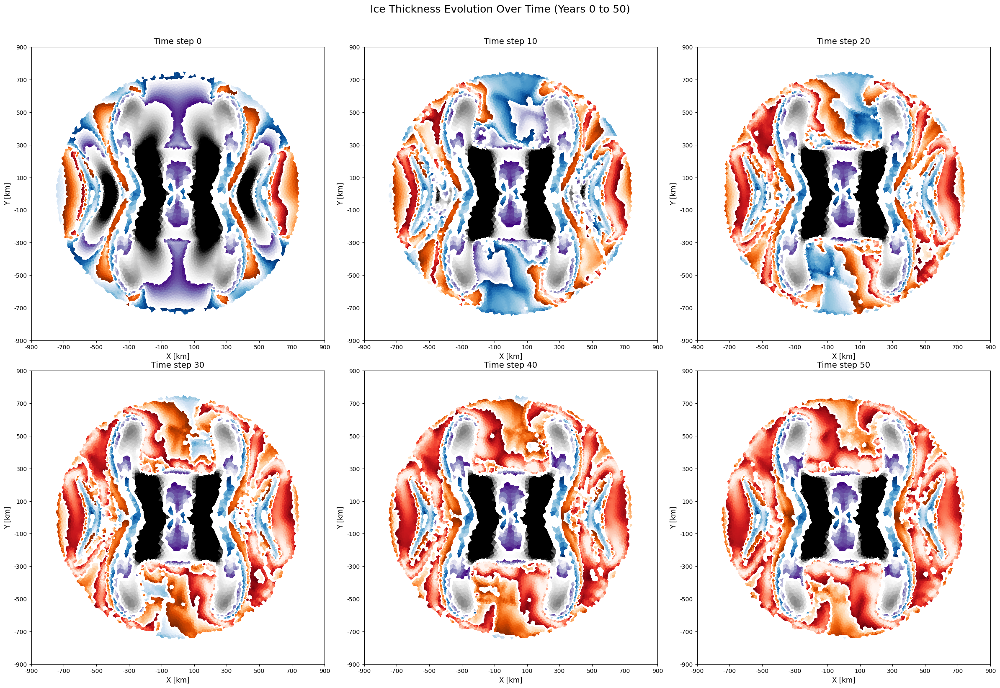

In [24]:

colorbar_kwargs = {
    'aspect': 10,
    'pad': 0.01,
    'shrink': 0.75, 
}

n = 900000  
years = [0, 10, 20, 30, 40, 50]  

fig, axes = plt.subplots(2, 3, figsize=(24, 16))  
plt.suptitle('Ice Thickness Evolution Over Time (Years 0 to 50)', 
             fontsize=18, y=1.02)  

axes = axes.flatten() 

for i, year in enumerate(years):
    ax = axes[i]
    
    # Plot data for each year (adjust Hi_l[year] as needed)
    c0 = ax.tripcolor(triang, Hi_l[year].where(Hi_l[year] > 400), cmap='Greys', vmin = 400 , vmax = 600)
    c1 = ax.tripcolor(triang, Hi_l[year].where((Hi_l[year] > 300) & (Hi_l[year] < 400)), cmap='Purples')
    c2 = ax.tripcolor(triang, Hi_l[year].where((Hi_l[year] > 200) & (Hi_l[year] < 300)), cmap='Blues')
    c3 = ax.tripcolor(triang, Hi_l[year].where((Hi_l[year] > 100) & (Hi_l[year] < 200)), cmap='Oranges')
    c4 = ax.tripcolor(triang, Hi_l[year].where((Hi_l[year] > 0) & (Hi_l[year] < 100)), cmap='Reds')
    
    # Customize subplot
    ax.set_title(f'Time step {year}', fontsize=14)
    ax.set_xlabel('X [km]', fontsize=12)
    ax.set_ylabel('Y [km]', fontsize=12)
    ax.set_xticks(np.arange(-n, n + 1, 200000))
    ax.set_xticklabels(np.arange(-n // 1000, n // 1000 + 1, 200))
    ax.set_yticks(np.arange(-n, n + 1, 200000))
    ax.set_yticklabels(np.arange(-n // 1000, n // 1000 + 1, 200))
    ax.set_xlim(-n, n)
    ax.set_ylim(-n, n)
    ax.set_aspect('equal')

# Adjust layout to prevent overlap
plt.tight_layout()
plt.show()

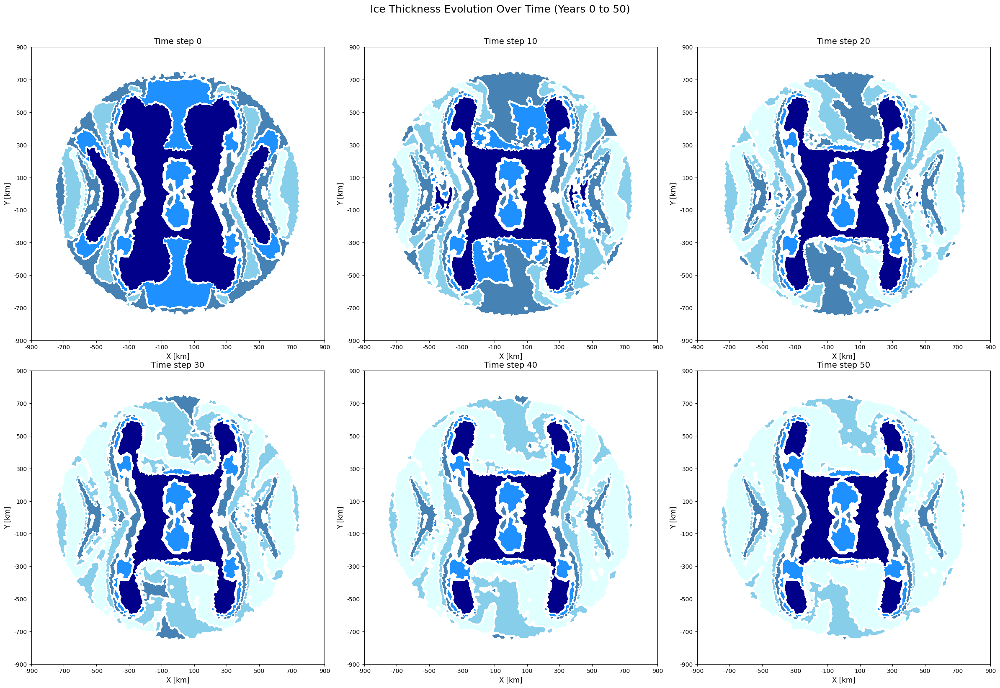

In [ ]:
solid_colors = {
     '>400':  '#00008B',
    '300-400': '#1E90FF',
    '200-300': '#4682B4',
    '100-200': '#87CEEB',
    '0-100': '#E0FFFF',
}

cmap_grey = ListedColormap([solid_colors['>400']])
cmap_purple = ListedColormap([solid_colors['300-400']])
cmap_blue = ListedColormap([solid_colors['200-300']])
cmap_orange = ListedColormap([solid_colors['100-200']])
cmap_red = ListedColormap([solid_colors['0-100']])

n = 900000
years = [0, 10, 20, 30, 40, 50]


fig, axes = plt.subplots(2, 3, figsize=(24, 16))
axes = axes.flatten()

for i, year in enumerate(years):
    ax = axes[i]
    
  
    c0 = ax.tripcolor(triang, Hi_l[year].where(Hi_l[year] > 400), cmap=cmap_grey)
    c1 = ax.tripcolor(triang, Hi_l[year].where((Hi_l[year] > 300) & (Hi_l[year] < 400)), cmap=cmap_purple)
    c2 = ax.tripcolor(triang, Hi_l[year].where((Hi_l[year] > 200) & (Hi_l[year] < 300)), cmap=cmap_blue)
    c3 = ax.tripcolor(triang, Hi_l[year].where((Hi_l[year] > 100) & (Hi_l[year] < 200)), cmap=cmap_orange)
    c4 = ax.tripcolor(triang, Hi_l[year].where((Hi_l[year] > 0) & (Hi_l[year] < 100)), cmap=cmap_red)
    

    ax.set_title(f'Time step {year}', fontsize=14)
    ax.set_xlabel('X [km]', fontsize=12)
    ax.set_ylabel('Y [km]', fontsize=12)
    ax.set_xticks(np.arange(-n, n + 1, 200000))
    ax.set_xticklabels(np.arange(-n // 1000, n // 1000 + 1, 200))
    ax.set_yticks(np.arange(-n, n + 1, 200000))
    ax.set_yticklabels(np.arange(-n // 1000, n // 1000 + 1, 200))
    ax.set_xlim(-n, n)
    ax.set_ylim(-n, n)
    ax.set_aspect('equal')


plt.suptitle('Ice Thickness Evolution Over Time (Years 0 to 50)', 
             fontsize=18, y=1.02)  

plt.tight_layout()
plt.show()

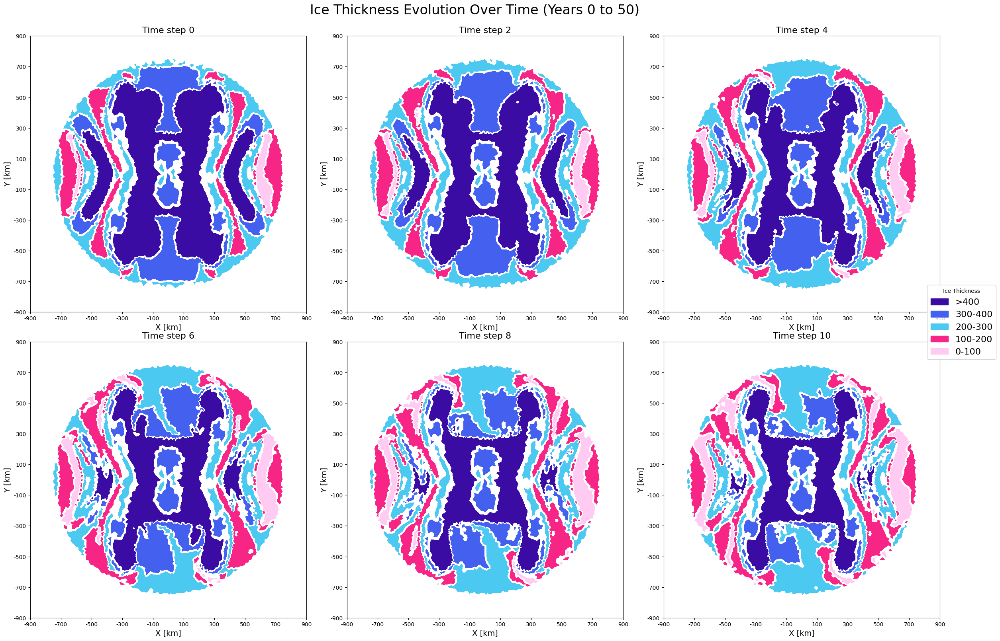

In [12]:

"""
solid_colors = {
    '>400': '#00008B',
    '300-400': '#1E90FF',
    '200-300': '#4682B4',
    '100-200': '#87CEEB',
    '0-100': '#E0FFFF',
}"""


solid_colors = {
    '>400': '#3A0CA3',   # Deep blue
    '300-400': '#4361EE', # Bright blue
    '200-300': '#4CC9F0', # Light teal-blue
    '100-200': '#F72585', # Vibrant pink
    '0-100': '#FFCBF2'    # Light pink
}

# Create colormaps
cmap_grey = ListedColormap([solid_colors['>400']])
cmap_purple = ListedColormap([solid_colors['300-400']])
cmap_blue = ListedColormap([solid_colors['200-300']])
cmap_orange = ListedColormap([solid_colors['100-200']])
cmap_red = ListedColormap([solid_colors['0-100']])

n = 900000
years = [0, 2, 4, 6, 8, 10]

fig, axes = plt.subplots(2, 3, figsize=(24, 16))
axes = axes.flatten()

# Create legend handles
legend_handles = [
    mpatches.Patch(color=solid_colors['>400'], label='>400'),
    mpatches.Patch(color=solid_colors['300-400'], label='300-400'),
    mpatches.Patch(color=solid_colors['200-300'], label='200-300'),
    mpatches.Patch(color=solid_colors['100-200'], label='100-200'),
    mpatches.Patch(color=solid_colors['0-100'], label='0-100')
]

for i, year in enumerate(years):
    ax = axes[i]
    
    c0 = ax.tripcolor(triang, Hi_l[year].where(Hi_l[year] > 400), cmap=cmap_grey)
    c1 = ax.tripcolor(triang, Hi_l[year].where((Hi_l[year] > 300) & (Hi_l[year] < 400)), cmap=cmap_purple)
    c2 = ax.tripcolor(triang, Hi_l[year].where((Hi_l[year] > 200) & (Hi_l[year] < 300)), cmap=cmap_blue)
    c3 = ax.tripcolor(triang, Hi_l[year].where((Hi_l[year] > 100) & (Hi_l[year] < 200)), cmap=cmap_orange)
    c4 = ax.tripcolor(triang, Hi_l[year].where((Hi_l[year] > 0) & (Hi_l[year] < 100)), cmap=cmap_red)
    
    ax.set_title(f'Time step {year}', fontsize=16)
    ax.set_xlabel('X [km]', fontsize=14)
    ax.set_ylabel('Y [km]', fontsize=14)
    ax.set_xticks(np.arange(-n, n + 1, 200000))
    ax.set_xticklabels(np.arange(-n // 1000, n // 1000 + 1, 200))
    ax.set_yticks(np.arange(-n, n + 1, 200000))
    ax.set_yticklabels(np.arange(-n // 1000, n // 1000 + 1, 200))
    ax.set_xlim(-n, n)
    ax.set_ylim(-n, n)
    ax.set_aspect('equal')

# Add a single legend to the right of all subplots
fig.legend(handles=legend_handles, 
           title='Ice Thickness', 
           loc='right', 
           bbox_to_anchor=(1.05, 0.5), 
           fontsize=16)

plt.suptitle('Ice Thickness Evolution Over Time (Years 0 to 50)', 
             fontsize=24, y=1.)  

plt.tight_layout()
plt.show()

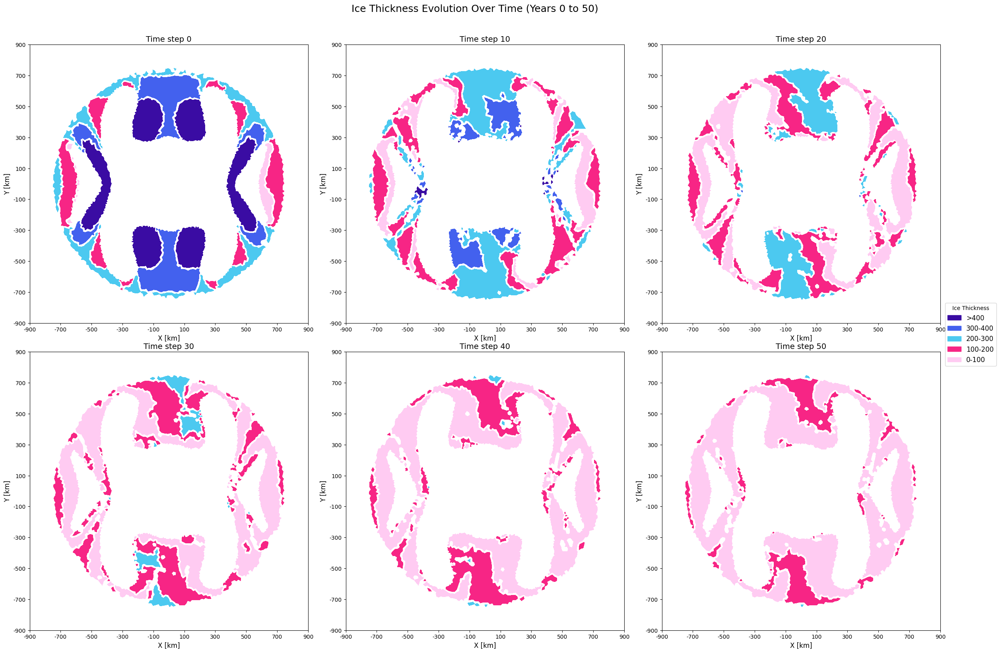

In [43]:
solid_colors = {
    '>400': '#3A0CA3',   # Deep blue
    '300-400': '#4361EE', # Bright blue
    '200-300': '#4CC9F0', # Light teal-blue
    '100-200': '#F72585', # Vibrant pink
    '0-100': '#FFCBF2'    # Light pink
}

# Create colormaps
cmap_grey = ListedColormap([solid_colors['>400']])
cmap_purple = ListedColormap([solid_colors['300-400']])
cmap_blue = ListedColormap([solid_colors['200-300']])
cmap_orange = ListedColormap([solid_colors['100-200']])
cmap_red = ListedColormap([solid_colors['0-100']])

n = 900000
years = [0, 10, 20, 30, 40, 50]

fig, axes = plt.subplots(2, 3, figsize=(24, 16))
axes = axes.flatten()

# Create legend handles
legend_handles = [
    mpatches.Patch(color=solid_colors['>400'], label='>400'),
    mpatches.Patch(color=solid_colors['300-400'], label='300-400'),
    mpatches.Patch(color=solid_colors['200-300'], label='200-300'),
    mpatches.Patch(color=solid_colors['100-200'], label='100-200'),
    mpatches.Patch(color=solid_colors['0-100'], label='0-100')
]


for i, year in enumerate(years):
    ax = axes[i]
    p = 0.01
    mask_floating = (Hs_l[year] - Hi_l[year] - Hb_l[year] <= p)
    mask_rock= ~mask_floating
    Hi = Hi_l[year].where(mask_ocean & mask_rock)  
    c0 = ax.tripcolor(triang,Hi.where(Hi > 400), cmap=cmap_grey)
    c1 = ax.tripcolor(triang,Hi.where((Hi > 300) & (Hi < 400)), cmap=cmap_purple)
    c2 = ax.tripcolor(triang,Hi.where((Hi > 200) & (Hi < 300)), cmap=cmap_blue)
    c3 = ax.tripcolor(triang,Hi.where((Hi > 100) & (Hi < 200)), cmap=cmap_orange)
    c4 = ax.tripcolor(triang, Hi.where((Hi > 0) & (Hi < 100)), cmap=cmap_red)


    ax.set_title(f'Time step {year}', fontsize=14)
    ax.set_xlabel('X [km]', fontsize=12)
    ax.set_ylabel('Y [km]', fontsize=12)
    ax.set_xticks(np.arange(-n, n + 1, 200000))
    ax.set_xticklabels(np.arange(-n // 1000, n // 1000 + 1, 200))
    ax.set_yticks(np.arange(-n, n + 1, 200000))
    ax.set_yticklabels(np.arange(-n // 1000, n // 1000 + 1, 200))
    ax.set_xlim(-n, n)
    ax.set_ylim(-n, n)
    ax.set_aspect('equal')

# Add a single legend to the right of all subplots
fig.legend(handles=legend_handles, 
           title='Ice Thickness', 
           loc='right', 
           bbox_to_anchor=(1.05, 0.5), 
           fontsize=12)

plt.suptitle('Ice Thickness Evolution Over Time (Years 0 to 50)', 
             fontsize=18, y=1.02)  

plt.tight_layout()
plt.show()

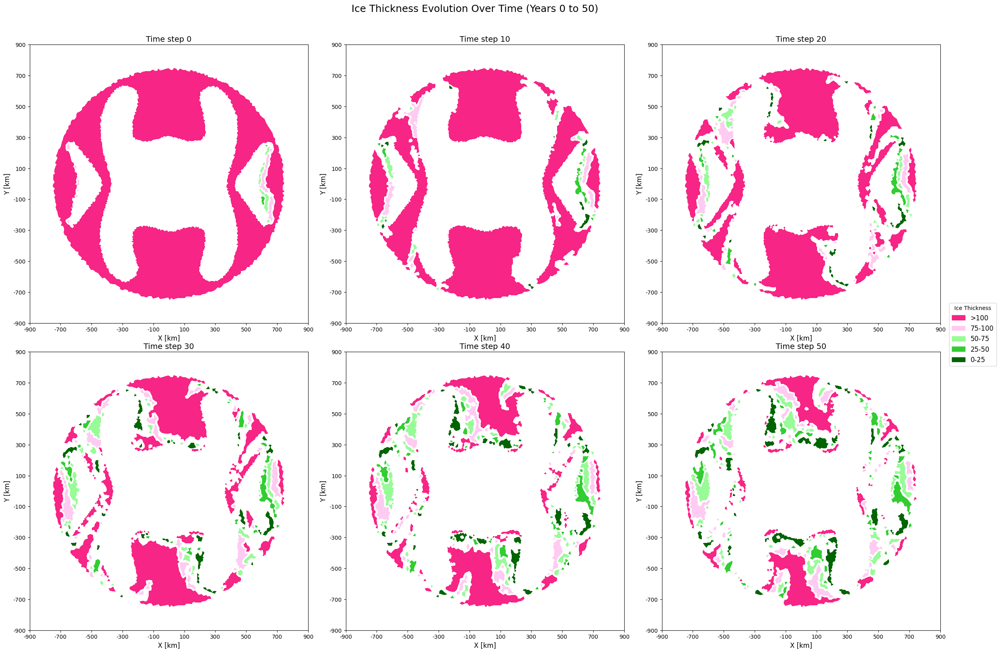

In [13]:
solid_colors = {
    '>400': '#F72585',   # Deep blue
    '300-400': '#FFCBF2', # Bright blue
    '200-300': '#98FB98', # Dark green
    '100-200': '#32CD32', # Lime green
    '0-100': '#006400'    # Pale green
}

# Create colormaps
cmap_grey = ListedColormap([solid_colors['>400']])
cmap_purple = ListedColormap([solid_colors['300-400']])
cmap_blue = ListedColormap([solid_colors['200-300']])
cmap_orange = ListedColormap([solid_colors['100-200']])
cmap_red = ListedColormap([solid_colors['0-100']])

n = 900000
years = [0, 10, 20, 30, 40, 50]

fig, axes = plt.subplots(2, 3, figsize=(24, 16))
axes = axes.flatten()

# Create legend handles
legend_handles = [
    mpatches.Patch(color=solid_colors['>400'], label='>100'),
    mpatches.Patch(color=solid_colors['300-400'], label='75-100'),
    mpatches.Patch(color=solid_colors['200-300'], label='50-75'),
    mpatches.Patch(color=solid_colors['100-200'], label='25-50'),
    mpatches.Patch(color=solid_colors['0-100'], label='0-25')
]


for i, year in enumerate(years):
    ax = axes[i]
    p = 0.01
    mask_floating = (Hs_l[year] - Hi_l[year] - Hb_l[year] <= p)
    mask_rock= ~mask_floating
    Hi = Hi_l[year].where(mask_ocean & mask_rock)  
    c0 = ax.tripcolor(triang,Hi.where(Hi > 100), cmap=cmap_grey)
    c1 = ax.tripcolor(triang,Hi.where((Hi > 75) & (Hi < 100)), cmap=cmap_purple)
    c2 = ax.tripcolor(triang,Hi.where((Hi > 50) & (Hi < 75)), cmap=cmap_blue)
    c3 = ax.tripcolor(triang,Hi.where((Hi > 25) & (Hi < 50)), cmap=cmap_orange)
    c4 = ax.tripcolor(triang, Hi.where((Hi > 0) & (Hi < 10)), cmap=cmap_red)

    ax.set_title(f'Time step {year}', fontsize=14)
    ax.set_xlabel('X [km]', fontsize=12)
    ax.set_ylabel('Y [km]', fontsize=12)
    ax.set_xticks(np.arange(-n, n + 1, 200000))
    ax.set_xticklabels(np.arange(-n // 1000, n // 1000 + 1, 200))
    ax.set_yticks(np.arange(-n, n + 1, 200000))
    ax.set_yticklabels(np.arange(-n // 1000, n // 1000 + 1, 200))
    ax.set_xlim(-n, n)
    ax.set_ylim(-n, n)
    ax.set_aspect('equal')

# Add a single legend to the right of all subplots
fig.legend(handles=legend_handles, 
           title='Ice Thickness', 
           loc='right', 
           bbox_to_anchor=(1.05, 0.5), 
           fontsize=12)

plt.suptitle('Ice Thickness Evolution Over Time (Years 0 to 50)', 
             fontsize=18, y=1.02)  

plt.tight_layout()
plt.show()

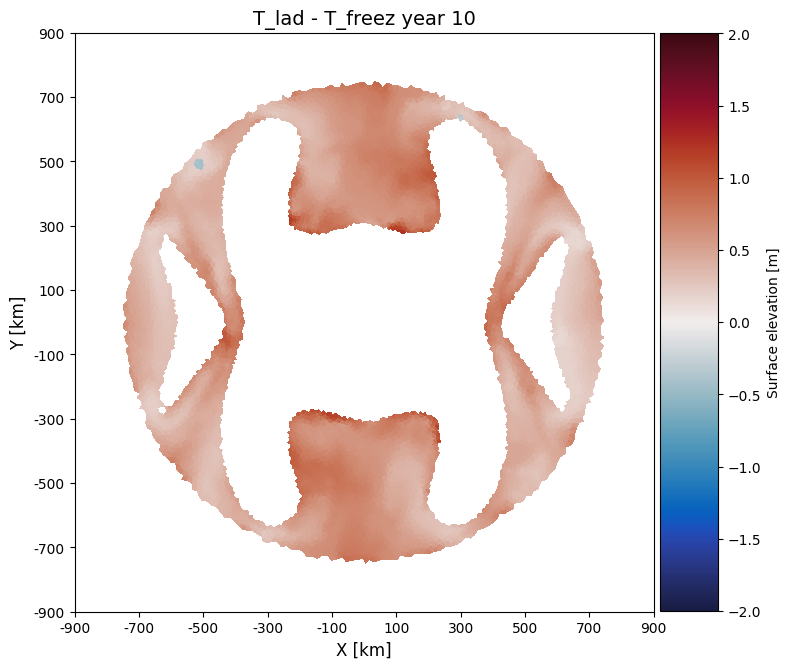

In [40]:
colorbar_kwargs = {
    'aspect': 10,
    'pad': 0.01,
    'shrink': 0.75, 
}

n = 900000
##############################################################################################################################
fig, ax = plt.subplots(1, 1, figsize=(8, 8)) 

c0 = ax.tripcolor(triang, (T_lad[-1]-T_fp[10]).where(mask_ocean & mask_rock), cmap=cmo.balance, vmin=-2, vmax= 2)
fig.colorbar(c0, ax=ax, label="Surface elevation [m]", **colorbar_kwargs)
ax.set_title('T_lad - T_freez year 10', fontsize=14)

ax.set_xlabel('X [km]', fontsize=12)
ax.set_ylabel('Y [km]', fontsize=12)
ax.set_xticks(np.arange(-n, n + 1, 200000))
ax.set_xticklabels(np.arange(-n // 1000, n // 1000 + 1, 200))
ax.set_yticks(np.arange(-n, n + 1, 200000))
ax.set_yticklabels(np.arange(-n // 1000, n // 1000 + 1, 200))
ax.set_xlim(-n, n)
ax.set_ylim(-n, n)
ax.set_aspect('equal')

plt.tight_layout()
plt.show()

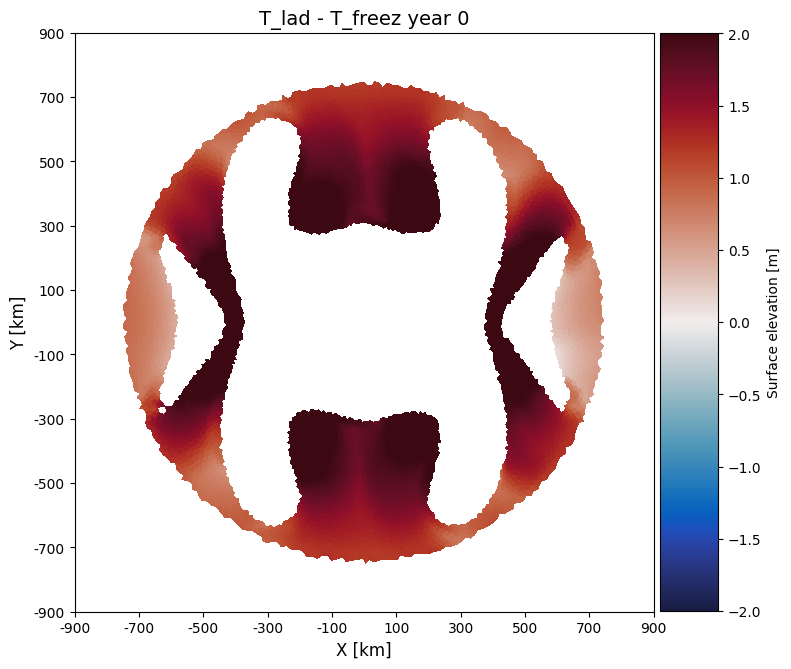

In [24]:
colorbar_kwargs = {
    'aspect': 10,
    'pad': 0.01,
    'shrink': 0.75, 
}

n = 900000
##############################################################################################################################
fig, ax = plt.subplots(1, 1, figsize=(8, 8)) 

c0 = ax.tripcolor(triang, (T_lad[0]-T_fp[0]).where(mask_ocean & mask_rock), cmap=cmo.balance, vmin=-2, vmax= 2)
fig.colorbar(c0, ax=ax, label="Surface elevation [m]", **colorbar_kwargs)
ax.set_title('T_lad - T_freez year 0', fontsize=14)

ax.set_xlabel('X [km]', fontsize=12)
ax.set_ylabel('Y [km]', fontsize=12)
ax.set_xticks(np.arange(-n, n + 1, 200000))
ax.set_xticklabels(np.arange(-n // 1000, n // 1000 + 1, 200))
ax.set_yticks(np.arange(-n, n + 1, 200000))
ax.set_yticklabels(np.arange(-n // 1000, n // 1000 + 1, 200))
ax.set_xlim(-n, n)
ax.set_ylim(-n, n)
ax.set_aspect('equal')

plt.tight_layout()
plt.show()

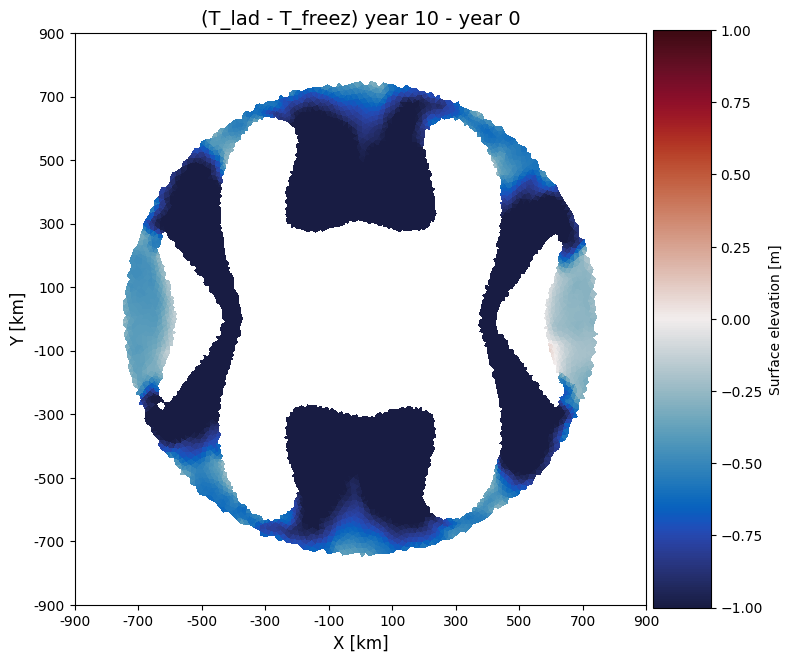

In [41]:
colorbar_kwargs = {
    'aspect': 10,
    'pad': 0.01,
    'shrink': 0.75, 
}

n = 900000
##############################################################################################################################
fig, ax = plt.subplots(1, 1, figsize=(8, 8)) 

c0 = ax.tripcolor(triang, (T_lad[-1] - T_fp[-1]- (T_lad[0]-T_fp[0])).where(mask_ocean & mask_rock), cmap=cmo.balance, vmin=-1, vmax= 1)
fig.colorbar(c0, ax=ax, label="Surface elevation [m]", **colorbar_kwargs)
ax.set_title('(T_lad - T_freez) year 10 - year 0', fontsize=14)

ax.set_xlabel('X [km]', fontsize=12)
ax.set_ylabel('Y [km]', fontsize=12)
ax.set_xticks(np.arange(-n, n + 1, 200000))
ax.set_xticklabels(np.arange(-n // 1000, n // 1000 + 1, 200))
ax.set_yticks(np.arange(-n, n + 1, 200000))
ax.set_yticklabels(np.arange(-n // 1000, n // 1000 + 1, 200))
ax.set_xlim(-n, n)
ax.set_ylim(-n, n)
ax.set_aspect('equal')

plt.tight_layout()
plt.show()

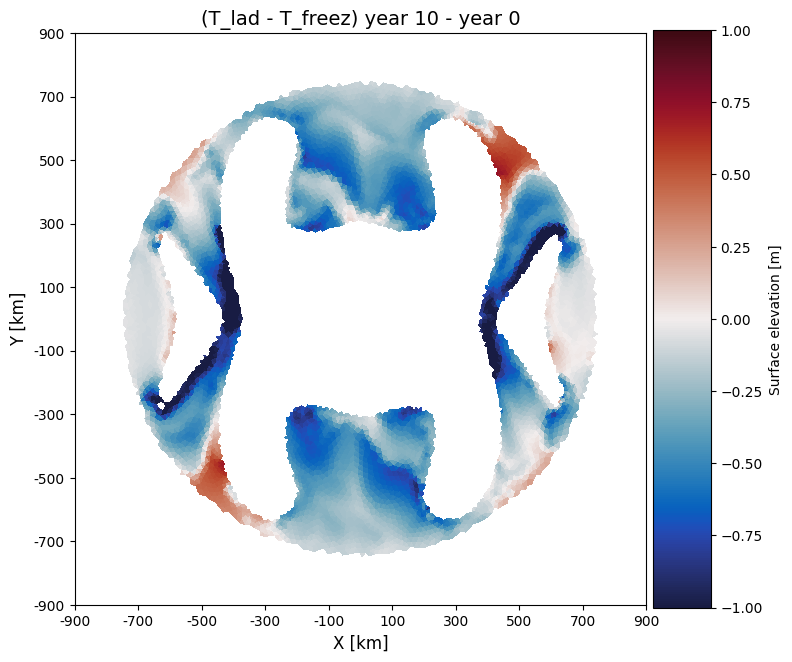

In [26]:
colorbar_kwargs = {
    'aspect': 10,
    'pad': 0.01,
    'shrink': 0.75, 
}

n = 900000
##############################################################################################################################
fig, ax = plt.subplots(1, 1, figsize=(8, 8)) 

c0 = ax.tripcolor(triang, (T_lad[10] - T_lad[0]).where(mask_ocean & mask_rock), cmap=cmo.balance, vmin=-1, vmax= 1)
fig.colorbar(c0, ax=ax, label="Surface elevation [m]", **colorbar_kwargs)
ax.set_title('(T_lad - T_freez) year 10 - year 0', fontsize=14)

ax.set_xlabel('X [km]', fontsize=12)
ax.set_ylabel('Y [km]', fontsize=12)
ax.set_xticks(np.arange(-n, n + 1, 200000))
ax.set_xticklabels(np.arange(-n // 1000, n // 1000 + 1, 200))
ax.set_yticks(np.arange(-n, n + 1, 200000))
ax.set_yticklabels(np.arange(-n // 1000, n // 1000 + 1, 200))
ax.set_xlim(-n, n)
ax.set_ylim(-n, n)
ax.set_aspect('equal')

plt.tight_layout()
plt.show()

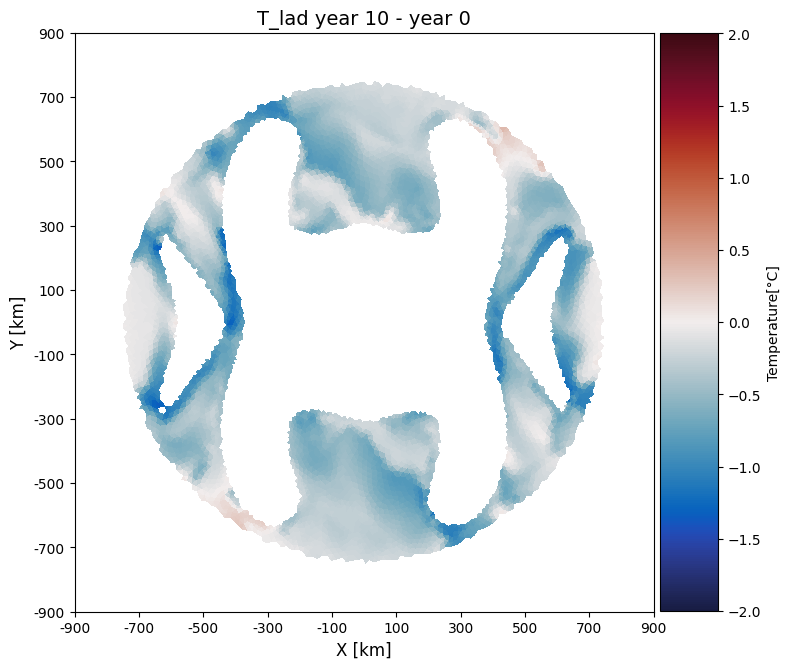

In [54]:
colorbar_kwargs = {
    'aspect': 10,
    'pad': 0.01,
    'shrink': 0.75, 
}

n = 900000
##############################################################################################################################
fig, ax = plt.subplots(1, 1, figsize=(8, 8)) 

c0 = ax.tripcolor(triang, (T_lad[10] -T_lad[1]).where(mask_ocean & mask_rock), cmap=cmo.balance, vmin=-2, vmax= 2)
fig.colorbar(c0, ax=ax, label="Temperature[°C]", **colorbar_kwargs)
ax.set_title('T_lad year 10 - year 0', fontsize=14)

ax.set_xlabel('X [km]', fontsize=12)
ax.set_ylabel('Y [km]', fontsize=12)
ax.set_xticks(np.arange(-n, n + 1, 200000))
ax.set_xticklabels(np.arange(-n // 1000, n // 1000 + 1, 200))
ax.set_yticks(np.arange(-n, n + 1, 200000))
ax.set_yticklabels(np.arange(-n // 1000, n // 1000 + 1, 200))
ax.set_xlim(-n, n)
ax.set_ylim(-n, n)
ax.set_aspect('equal')

plt.tight_layout()
plt.show()

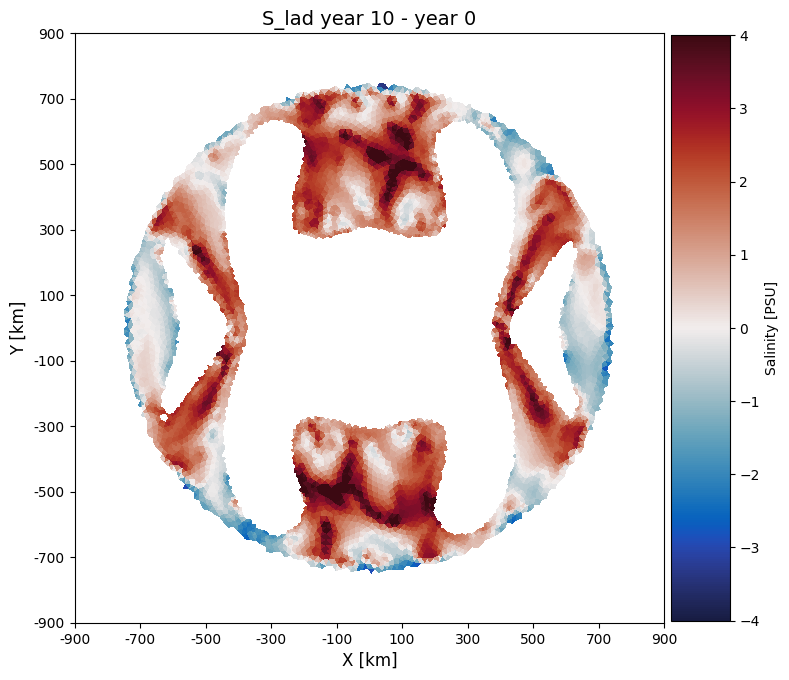

In [57]:
colorbar_kwargs = {
    'aspect': 10,
    'pad': 0.01,
    'shrink': 0.76, 
}

n = 900000
##############################################################################################################################
fig, ax = plt.subplots(1, 1, figsize=(8, 8)) 

c0 = ax.tripcolor(triang, (S_lad[10]-S_lad[0]).where(mask_ocean & mask_rock), cmap=cmo.balance, vmin=-4, vmax= 4)
fig.colorbar(c0, ax=ax, label="Salinity [PSU]", **colorbar_kwargs)
ax.set_title('S_lad year 10 - year 0', fontsize=14)

ax.set_xlabel('X [km]', fontsize=12)
ax.set_ylabel('Y [km]', fontsize=12)
ax.set_xticks(np.arange(-n, n + 1, 200000))
ax.set_xticklabels(np.arange(-n // 1000, n // 1000 + 1, 200))
ax.set_yticks(np.arange(-n, n + 1, 200000))
ax.set_yticklabels(np.arange(-n // 1000, n // 1000 + 1, 200))
ax.set_xlim(-n, n)
ax.set_ylim(-n, n)
ax.set_aspect('equal')

plt.tight_layout()
plt.show()

### Speed

In [26]:
Tricc = Lad['Tricc']
Mag = np.sqrt(U_lad**2 + V_lad**2)

distancess = np.sqrt(Tricc[0, :]**2 + Tricc[1, :]**2)
radius = 750000
mask_ocean2 = distances <= radius

/opt/miniconda3/envs/myenv/lib/python3.10/site-packages/xarray/core/common.py:180: RuntimeWarning: invalid value encountered in cast
  return np.array(self.values, dtype=dtype, copy=copy)


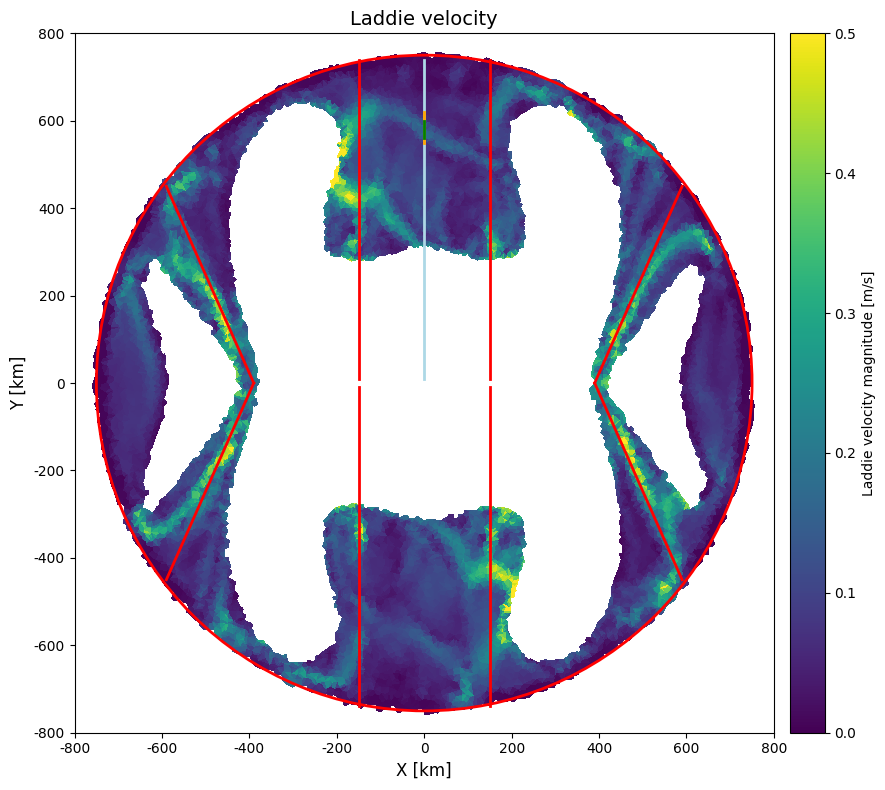

In [25]:
colorbar_kwargs = {
    'aspect': 20,
    'pad': 0.01,
    'shrink': 1, 
}
u = 10
m = 4
subsampled_mask = (Mag[u][::m] >= 0.01) 

##############################################################################################################################
fig, ax = plt.subplots(1, 1, figsize=(16, 8)) 

c0 = ax.tripcolor(
    Tricc[0, :], 
    Tricc[1, :], 
    Mag[u].where(Mag[0] != 0), 
    cmap='viridis', 
    vmin=0, 
    vmax=0.5
)

fig.colorbar(c0, ax=ax, label="Laddie velocity magnitude [m/s]", **colorbar_kwargs)
ax.set_title('Laddie velocity', fontsize=14)

'''
plt.quiver(Tricc[0, :][::m][subsampled_mask],
    Tricc[1, :][::m][subsampled_mask],
    U_lad[u][::m][subsampled_mask],
    V_lad[u][::m][subsampled_mask],
    scale=10,
    width=0.002,
    headwidth=2,
    headlength=2,
    headaxislength=3,
    color = 'k'
)
plt.quiverkey(
    plt.quiver(0, 0, 0, 0, scale=10, width=0.002),
    X=0.75,
    Y=0.9,
    U=0.25,
    label=' 25 cm/s',
    labelpos='E',
    coordinates='figure',
    color='k'
)
'''

circle = plt.Circle((0, 0), 750000, color='red', fill=False, linestyle='-', linewidth=2)
ax.add_artist(circle)
ax.set_aspect('equal')

ax.plot([150000, 150000], [10000, 740000], color='red', linestyle='-', linewidth=2)
ax.plot([150000, 150000], [-10000, -740000], color='red', linestyle='-', linewidth=2)
ax.plot([0, 0], [10000, 740000], color='lightblue', linestyle='-', linewidth=2)
ax.plot([-150000, -150000], [10000, 740000], color='red', linestyle='-', linewidth=2)
ax.plot([-150000, -150000], [-10000, -740000], color='red', linestyle='-', linewidth=2)

#ax.plot([-150000, -150000], [600000, 670000], color='pink', linestyle='-', linewidth=2)
ax.plot([0, 0], [550000, 620000], color='orange', linestyle='-', linewidth=2)

ax.plot([0, 0], [560000, 600000], color='green', linestyle='-', linewidth=2)

#ax.plot([-180000, 180000], [680000, 480000], color='pink', linestyle='-', linewidth=2)
#ax.plot([-180000, 180000], [380000, 520000], color='pink', linestyle='-', linewidth=2)
#ax.plot([-180000, 180000], [-480000, -680000], color='pink', linestyle='-', linewidth=2)
#ax.plot([-180000, 180000], [-520000, -380000], color='pink', linestyle='-', linewidth=2)

ax.plot([390000, 590000], [0, 450000], color='red', linestyle='-', linewidth=2)
ax.plot([-390000, -590000], [0, 450000], color='red', linestyle='-', linewidth=2)
ax.plot([-390000,- 590000], [0, -450000], color='red', linestyle='-', linewidth=2)
ax.plot([390000, 590000], [0, -450000], color='red', linestyle='-', linewidth=2)

ax.set_aspect('equal')
ax.set_xlabel('X [km]', fontsize=12)
ax.set_ylabel('Y [km]', fontsize=12)
ax.set_xticks(np.arange(-n, n + 1, 200000))
ax.set_xticklabels(np.arange(-n // 1000, n // 1000 + 1, 200))
ax.set_yticks(np.arange(-n, n + 1, 200000))
ax.set_yticklabels(np.arange(-n // 1000, n // 1000 + 1, 200))
ax.set_xlim(-n, n)
ax.set_ylim(-n, n)

plt.tight_layout()
plt.show()

/opt/miniconda3/envs/myenv/lib/python3.10/site-packages/xarray/core/common.py:180: RuntimeWarning: invalid value encountered in cast
  return np.array(self.values, dtype=dtype, copy=copy)


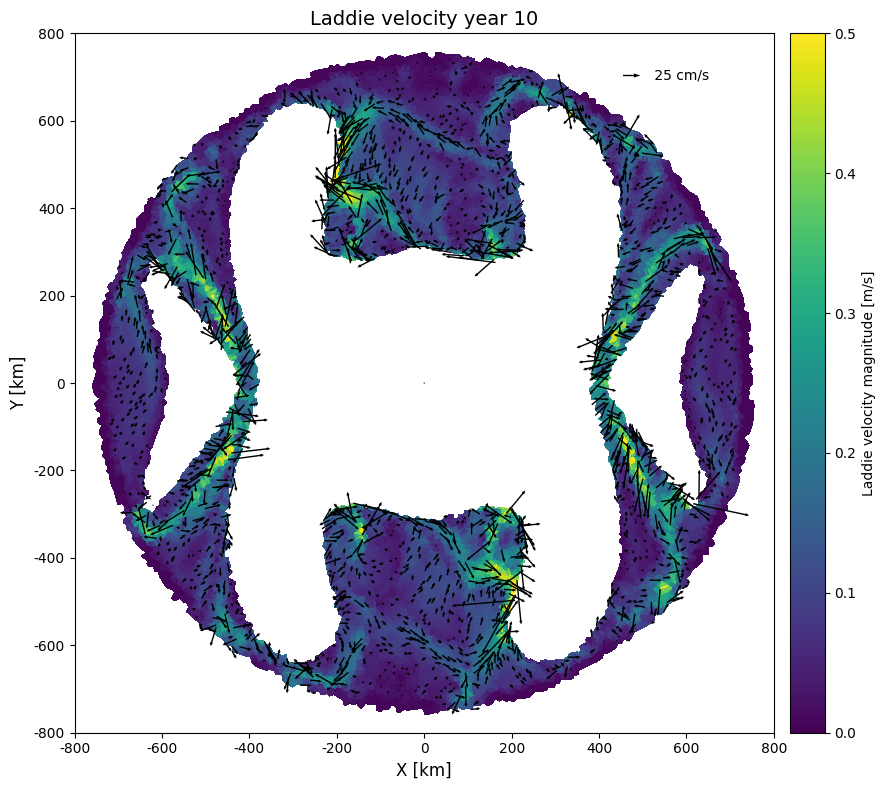

In [51]:
colorbar_kwargs = {
    'aspect': 20,
    'pad': 0.01,
    'shrink': 1, 
}
u = 10
m = 4
subsampled_mask = (Mag[u][::m] >= 0.01) 

##############################################################################################################################
fig, ax = plt.subplots(1, 1, figsize=(16, 8)) 

c0 = ax.tripcolor(
    Tricc[0, :], 
    Tricc[1, :], 
    Mag[u].where(Mag[0] != 0), 
    cmap='viridis', 
    vmin=0, 
    vmax=0.5
)

fig.colorbar(c0, ax=ax, label="Laddie velocity magnitude [m/s]", **colorbar_kwargs)
ax.set_title('Laddie velocity year 10', fontsize=14)

plt.quiver(Tricc[0, :][::m][subsampled_mask],
    Tricc[1, :][::m][subsampled_mask],
    U_lad[u][::m][subsampled_mask],
    V_lad[u][::m][subsampled_mask],
    scale=10,
    width=0.002,
    headwidth=2,
    headlength=2,
    headaxislength=3,
    color = 'k'
)
plt.quiverkey(
    plt.quiver(0, 0, 0, 0, scale=10, width=0.002),
    X=0.75,
    Y=0.9,
    U=0.25,
    label=' 25 cm/s',
    labelpos='E',
    coordinates='figure',
    color='k'
)


ax.set_aspect('equal')
ax.set_xlabel('X [km]', fontsize=12)
ax.set_ylabel('Y [km]', fontsize=12)
ax.set_xticks(np.arange(-n, n + 1, 200000))
ax.set_xticklabels(np.arange(-n // 1000, n // 1000 + 1, 200))
ax.set_yticks(np.arange(-n, n + 1, 200000))
ax.set_yticklabels(np.arange(-n // 1000, n // 1000 + 1, 200))
ax.set_xlim(-n, n)
ax.set_ylim(-n, n)

plt.tight_layout()
plt.show()

/opt/miniconda3/envs/myenv/lib/python3.10/site-packages/xarray/core/common.py:180: RuntimeWarning: invalid value encountered in cast
  return np.array(self.values, dtype=dtype, copy=copy)


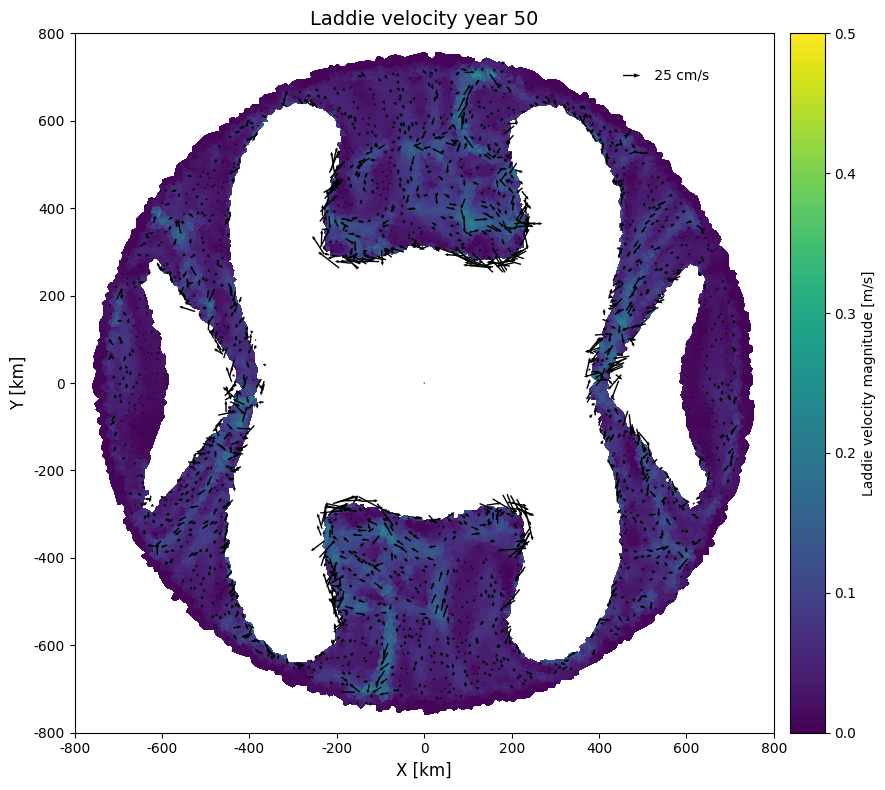

In [52]:
colorbar_kwargs = {
    'aspect': 20,
    'pad': 0.01,
    'shrink': 1, 
}
u = 50
m = 4
subsampled_mask = (Mag[u][::m] >= 0.01) 

##############################################################################################################################
fig, ax = plt.subplots(1, 1, figsize=(16, 8)) 

c0 = ax.tripcolor(
    Tricc[0, :], 
    Tricc[1, :], 
    Mag[u].where(Mag[0] != 0), 
    cmap='viridis', 
    vmin=0, 
    vmax=0.5
)

fig.colorbar(c0, ax=ax, label="Laddie velocity magnitude [m/s]", **colorbar_kwargs)
ax.set_title('Laddie velocity year 50', fontsize=14)

plt.quiver(Tricc[0, :][::m][subsampled_mask],
    Tricc[1, :][::m][subsampled_mask],
    U_lad[u][::m][subsampled_mask],
    V_lad[u][::m][subsampled_mask],
    scale=10,
    width=0.002,
    headwidth=2,
    headlength=2,
    headaxislength=3,
    color = 'k'
)
plt.quiverkey(
    plt.quiver(0, 0, 0, 0, scale=10, width=0.002),
    X=0.75,
    Y=0.9,
    U=0.25,
    label=' 25 cm/s',
    labelpos='E',
    coordinates='figure',
    color='k'
)


ax.set_aspect('equal')
ax.set_xlabel('X [km]', fontsize=12)
ax.set_ylabel('Y [km]', fontsize=12)
ax.set_xticks(np.arange(-n, n + 1, 200000))
ax.set_xticklabels(np.arange(-n // 1000, n // 1000 + 1, 200))
ax.set_yticks(np.arange(-n, n + 1, 200000))
ax.set_yticklabels(np.arange(-n // 1000, n // 1000 + 1, 200))
ax.set_xlim(-n, n)
ax.set_ylim(-n, n)

plt.tight_layout()
plt.show()

In [53]:
Lad

<xarray.Dataset> Size: 337MB
Dimensions:                     (two: 2, vi: 12346, ci: 32, three: 3,
                                 ti: 24428, ei: 36773, four: 4, vori: 24694,
                                 bin: 11, time: 51, zeta: 12, month: 12,
                                 depth: 16)
Coordinates:
  * time                        (time) float64 408B 0.0 1.0 2.0 ... 49.0 50.0
  * zeta                        (zeta) float64 96B 0.0 0.09091 ... 0.9091 1.0
  * month                       (month) int32 48B 1 2 3 4 5 6 7 8 9 10 11 12
  * depth                       (depth) float64 128B 0.0 100.0 ... 1.5e+03
Dimensions without coordinates: two, vi, ci, three, ti, ei, four, vori, bin
Data variables: (12/79)
    xmin                        float64 8B ...
    xmax                        float64 8B ...
    ymin                        float64 8B ...
    ymax                        float64 8B ...
    tol_dist                    float64 8B ...
    lambda_M                    float64 8B ...
    ...                          ...
    basal_shear_stress          (time, vi) float64 5MB ...
    S_ocean                     (depth, vi) float64 2MB ...
    T_ocean                     (depth, vi) float64 2MB ...
    T_freezing_point            (time, vi) float64 5MB ...
    melt                        (time, vi) float64 5MB ...
    Hib                         (time, vi) float64 5MB ...
Attributes:
    git commit hash:  bbc87cb2bd832dcc6cc0b199a7a4ccc6b20f2611 (with uncommit...

In [ ]:
u_s = Lad['u_surf']
v_s = Lad['v_surf']
          
magice = np.sqrt(u_s**2 +v_s**2)
colorbar_kwargs = {
    'aspect': 20,
    'pad': 0.01,
    'shrink': 1, 
}
u = 50
m = 10



##############################################################################################################################
fig, ax = plt.subplots(1, 1, figsize=(16, 8)) 

c0 = ax.tripcolor(
    Tricc[0, :], 
    Tricc[1, :], 
    magice[u], 
    cmap='viridis', 
    vmin=0, 
    vmax=400

)

fig.colorbar(c0, ax=ax, label="Velocity magnitude [m/y]", **colorbar_kwargs)
ax.set_title('Ice velocity', fontsize=14)


u_s_norm = u_s[u][::m] / np.sqrt(u_s[u][::m]**2 + v_s[u][::m]**2)
v_s_norm = v_s[u][::m] / np.sqrt(u_s[u][::m]**2 + v_s[u][::m]**2)


plt.quiver(Tricc[0, :][::m],
    Tricc[1, :][::m],
    u_s_norm,
    v_s_norm,
    scale=50,
    width=0.002,
    headwidth=3,
    headlength=4,
    headaxislength=3
)

plt.quiverkey(
    plt.quiver(0, 0, 0, 0, scale=10000, width=0.002),
    X=0.75,
    Y=0.97,
    U= 200,
    label=' Normalized quivers',
    labelpos='E',
    coordinates='figure',
    color='k'
)

ax.set_aspect('equal')
ax.set_xlabel('X [km]', fontsize=12)
ax.set_ylabel('Y [km]', fontsize=12)
ax.set_xticks(np.arange(-n, n + 1, 200000))
ax.set_xticklabels(np.arange(-n // 1000, n // 1000 + 1, 200))
ax.set_yticks(np.arange(-n, n + 1, 200000))
ax.set_yticklabels(np.arange(-n // 1000, n // 1000 + 1, 200))
ax.set_xlim(-n, n)
ax.set_ylim(-n, n)

plt.tight_layout()
plt.show()

/opt/miniconda3/envs/myenv/lib/python3.10/site-packages/xarray/core/common.py:180: RuntimeWarning: invalid value encountered in cast
  return np.array(self.values, dtype=dtype, copy=copy)


ValueError: Collections can only map rank 1 arrays

<Figure size 1600x800 with 2 Axes>

In [55]:
plt.close('all')

# New tests 

In [35]:
u = 3

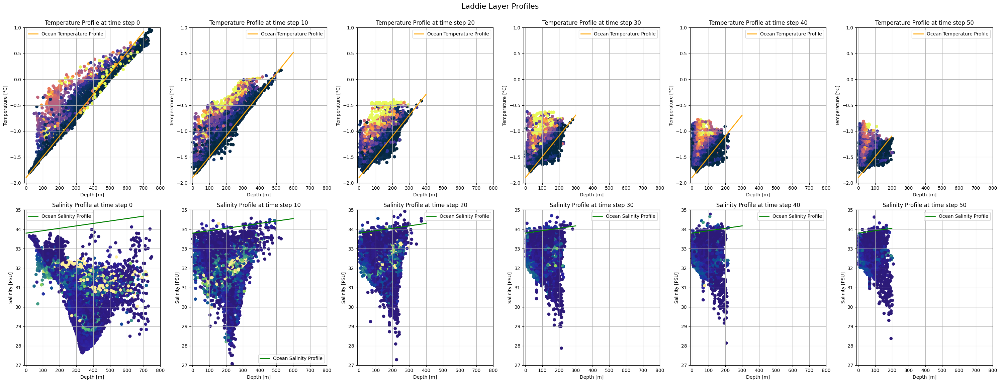

In [63]:
fig, axes = plt.subplots(2, 6, figsize=(30, 12))  # Create a 2x3 grid of subplots
fig.suptitle("Laddie Layer Profiles", fontsize=16, x= 0.5 , y = 0.95)

u = [0,10,20,30,40,50]
k = [8,7,5,4,4,3]

for i in range (6):
    Thick = Hib_l[u[i]].where(mask_rock & mask_ocean) - H_lad[u[i]]
    scatter = axes[0, i].scatter(-Thick, T_lad[u[i]], c=H_lad[u[i]], cmap=cmo.thermal, vmin=-0, vmax=50)
    axes[0, i].plot(To.depth[0:k[i]], To[0:k[i], 0], label="Ocean Temperature Profile", color="orange", linewidth=2)
    axes[0, i].set_xlabel("Depth [m]")
    axes[0, i].set_ylabel("Temperature [°C]")
    axes[0, i].set_title(f"Temperature Profile at time step {u[i]}")
    axes[0, i].legend()
    axes[0, i].grid()
    axes[0, i].set_xlim(-10,800)
    axes[0, i].set_ylim(-2,1)
    #fig.colorbar(scatter, ax=axes[0, i])


for i in range (6):
    Thick = Hib_l[u[i]].where(mask_rock & mask_ocean) - H_lad[u[i]]
    scatter = axes[1, i].scatter(-Thick, S_lad[u[i]], c=H_lad[u[i]], cmap=cmo.haline, vmin=-0, vmax=50)
    axes[1, i].plot(To.depth[0:k[i]], So[0:k[i], 0], label="Ocean Salinity Profile", color="green", linewidth=2)
    axes[1, i].set_xlabel("Depth [m]")
    axes[1, i].set_ylabel("Salinity [PSU]")
    axes[1, i].set_title(f"Salinity Profile at time step {u[i]}")
    axes[1, i].legend()
    axes[1, i].grid()
    axes[1, i].set_xlim(-10,800)
    axes[1, i].set_ylim(27,35)
    #fig.colorbar(scatter, ax=axes[1, i])

plt.tight_layout(rect=[0, 0, 1, 0.95])  # Adjust layout to fit the title
plt.show()

In [284]:
pathw ='../../../automated_testing/integrated_tests/idealised/Thule/warm/'
pathc ='../../../automated_testing/integrated_tests/idealised/Thule/cold/'
Warm = xr.open_dataset(pathw + 'main_output_ANT_00001.nc')
Cold = xr.open_dataset(pathc + 'main_output_ANT_00001.nc')


In [285]:
T_warm = Warm['T_ocean']
S_warm = Warm['S_ocean']
T_cold = Cold['T_ocean']
S_cold = Cold['S_ocean']


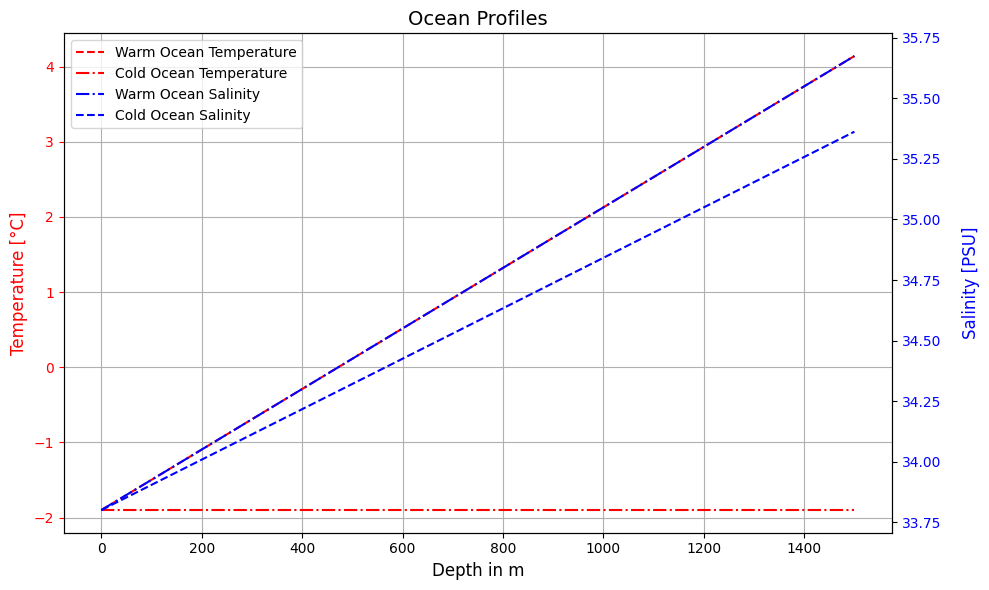

In [299]:
fig, ax1 = plt.subplots(figsize=(10, 6))

# Plot temperature profiles on the primary Y-axis
ax1.plot(T_warm['depth'], T_warm[:, 0], label="Warm Ocean Temperature", color="red", linestyle="--")
ax1.plot(T_cold['depth'], T_cold[:, 0], label="Cold Ocean Temperature", color="red", linestyle="-.")
ax1.set_xlabel("Depth in m", fontsize=12)
ax1.set_ylabel("Temperature [°C]", fontsize=12, color="red")
ax1.tick_params(axis='y', labelcolor="red", color="red")
ax1.spines['left'].set_color("red")
ax1.set_title("Ocean Profiles", fontsize=14)
ax1.grid(True)

# Create a secondary Y-axis for salinity
ax2 = ax1.twinx()
ax2.plot(S_warm['depth'], S_warm[:, 0], label="Warm Ocean Salinity", color="blue", linestyle="-.")
ax2.plot(S_cold['depth'], S_cold[:, 0], label="Cold Ocean Salinity", color="blue", linestyle="--")
ax2.set_ylabel("Salinity [PSU]", fontsize=12, color="blue", labelpad=15)  # Move salinity label up
ax2.tick_params(axis='y', labelcolor="blue")

# Combine legends from both axes
lines1, labels1 = ax1.get_legend_handles_labels()
lines2, labels2 = ax2.get_legend_handles_labels()
ax1.legend(lines1 + lines2, labels1 + labels2, loc="best", fontsize=10)

plt.tight_layout()
plt.show()

# Decades


In [128]:
n = 800000
years = [0, 10, 20, 30, 40, 50]
from mpl_toolkits.axes_grid1.inset_locator import inset_axes

NameError: name 'sizes' is not defined

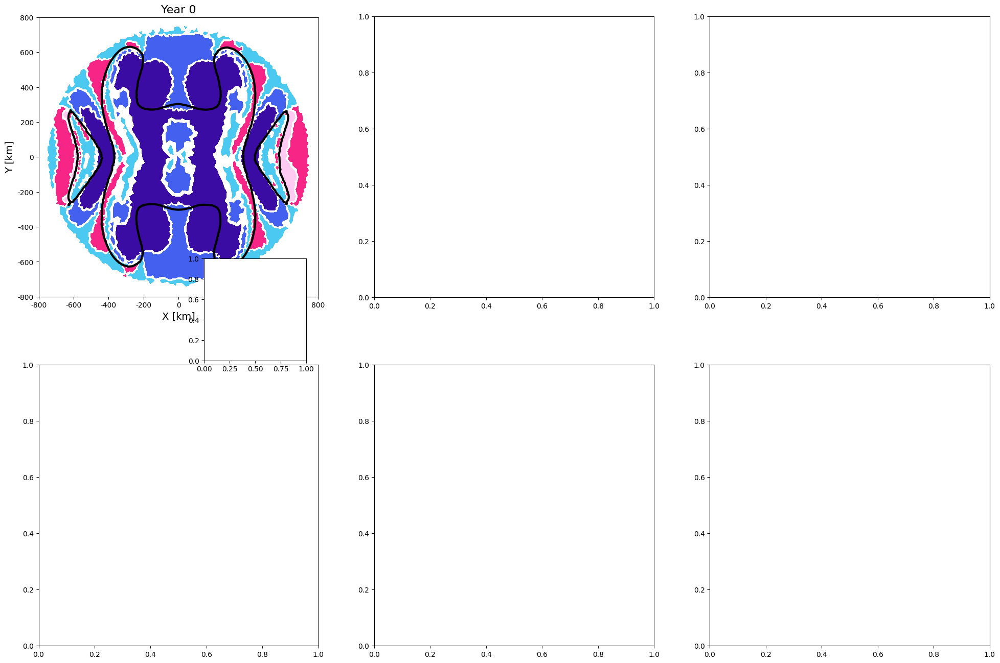

In [129]:
solid_colors = {
    '>400': '#3A0CA3',   # Deep blue
    '300-400': '#4361EE', # Bright blue
    '200-300': '#4CC9F0', # Light teal-blue
    '100-200': '#F72585', # Vibrant pink
    '0-100': '#FFCBF2'    # Light pink
}

# Create colormaps
cmap_grey = ListedColormap([solid_colors['>400']])
cmap_purple = ListedColormap([solid_colors['300-400']])
cmap_blue = ListedColormap([solid_colors['200-300']])
cmap_orange = ListedColormap([solid_colors['100-200']])
cmap_red = ListedColormap([solid_colors['0-100']])

fig = plt.figure(figsize=(24, 16))
# Create 3 rows: 2 for plots, 1 for legend
gs = gridspec.GridSpec(3, 3, height_ratios=[1, 0.1, 1], hspace=0.1)

# Create subplots in first and third rows
axes = []
for i in range(6):
    if i < 3:
        axes.append(plt.subplot(gs[0, i]))  # First row
    else:
        axes.append(plt.subplot(gs[2, i-3]))  # Third row

# Create legend handles
legend_handles = [
    mpatches.Patch(color=solid_colors['>400'], label='>400 m'),
    mpatches.Patch(color=solid_colors['300-400'], label='300-400 m'),
    mpatches.Patch(color=solid_colors['200-300'], label='200-300 m'),
    mpatches.Patch(color=solid_colors['100-200'], label='100-200 m'),
    mpatches.Patch(color=solid_colors['0-100'], label='0-100 m')
]

for i, year in enumerate(years):
    ax = axes[i]
    GL = Lad['grounding_line'][year]
    c0 = ax.tripcolor(triang, Hi_l[year].where(Hi_l[year] > 400), cmap=cmap_grey)
    c1 = ax.tripcolor(triang, Hi_l[year].where((Hi_l[year] > 300) & (Hi_l[year] < 400)), cmap=cmap_purple)
    c2 = ax.tripcolor(triang, Hi_l[year].where((Hi_l[year] > 200) & (Hi_l[year] < 300)), cmap=cmap_blue)
    c3 = ax.tripcolor(triang, Hi_l[year].where((Hi_l[year] > 100) & (Hi_l[year] < 200)), cmap=cmap_orange)
    c4 = ax.tripcolor(triang, Hi_l[year].where((Hi_l[year] > 0) & (Hi_l[year] < 100)), cmap=cmap_red)
   
    ax.plot(GL[0, :], GL[1, :], color='black', linewidth=3, label='Grounding Line')
    
    ax.set_title(f'Year {year}', fontsize=16)
    ax.set_xlabel('X [km]', fontsize=14)
    ax.set_ylabel('Y [km]', fontsize=14)
    ax.set_xticks(np.arange(-n, n + 1, 200000))
    ax.set_xticklabels(np.arange(-n // 1000, n // 1000 + 1, 200))
    ax.set_yticks(np.arange(-n, n + 1, 200000))
    ax.set_yticklabels(np.arange(-n // 1000, n // 1000 + 1, 200))
    ax.set_xlim(-n, n)
    ax.set_ylim(-n, n)
    ax.set_aspect('equal')


    # Create smaller pie chart
    pie_ax = inset_axes(ax, width=2, height=2, loc='upper right',
                    bbox_to_anchor=(0.97, 0.15), bbox_transform=ax.transAxes)

    wedges, texts = pie_ax.pie(sizes, colors=colors, startangle=90,
                            wedgeprops=dict(width=0.5, edgecolor='w'))

    # Add percentage labels outside wedges
    for i, wedge in enumerate(wedges):
        angle = (wedge.theta2 - wedge.theta1) / 2 + wedge.theta1
        x = 1.4 * np.cos(np.deg2rad(angle))
        y = 1.2 * np.sin(np.deg2rad(angle))
        pie_ax.text(x, y, percentages[i], ha='center', va='center',
                fontsize=10, color='black')

    pie_ax.set_title('Area Distribution', fontsize=12, pad=10)
ax.legend(loc='upper left', bbox_to_anchor=(-0.01, 1.146), edgecolor='white', fontsize=16, frameon=False)
# Add legend in the middle row
legend_ax = plt.subplot(gs[1, :])  # Span all columns in middle row
legend_ax.axis('off')  # Hide axes
legend = legend_ax.legend(handles=legend_handles, 
                         title='Ice Thickness', 
                         loc='center', 
                         ncol=5,  # Display in a single row
                         fontsize=16,
                         frameon=False,
                         bbox_to_anchor=(0.42, 0.5),
                         title_fontsize=18)  # Increase title font size

plt.suptitle('Ice Thickness Evolution each decade (Years 0 to 50) - LADDIE ', fontsize=20, y=0.92)  

plt.tight_layout()
plt.show()

In [47]:
data = (Hi_l[50]).where(mask_ocean & mask_rock)

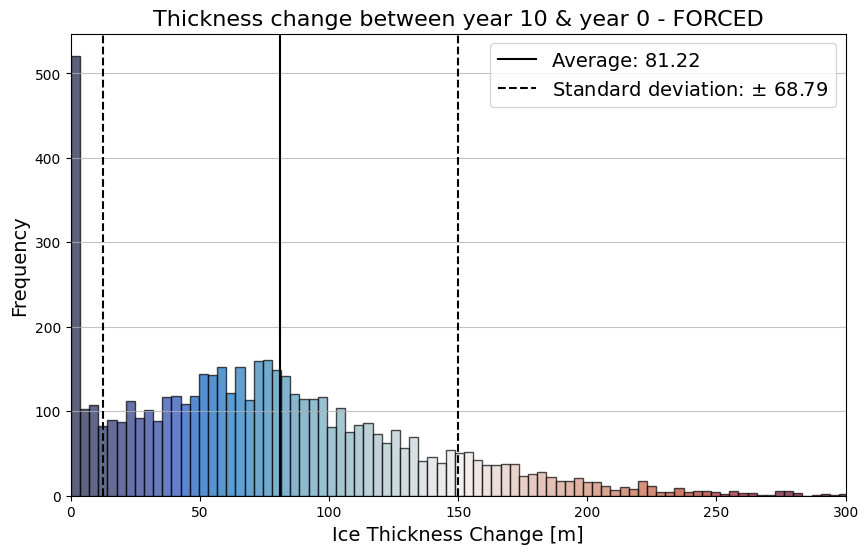

In [ ]:
solid_colors = {
    '>400': '#3A0CA3',   # Deep blue
    '300-400': '#4361EE', # Bright blue
    '200-300': '#4CC9F0', # Light teal-blue
    '100-200': '#F72585', # Vibrant pink
    '0-100': '#FFCBF2'    # Light pink
}

# Assuming your data range is similar to the tripcolor plot (-400 to 0)
data_min, data_max = 0, 300

plt.figure(figsize=(10, 6))
values = data.values.flatten()

# Create a normalized colormap
norm = plt.Normalize(vmin=data_min, vmax=data_max)
cmap = cmo.balance

# Get colors for each value using the colormap
colors = cmap(norm(values))

# Create histogram with colored bars
n, bins, patches = plt.hist(values, bins=200, alpha=0.7, edgecolor='black')

# Color each bar according to its bin center
for i, (bin_start, bin_end) in enumerate(zip(bins[:-1], bins[1:])):
    bin_center = (bin_start + bin_end) / 2
    patches[i].set_facecolor(cmap(norm(bin_center)))
    # Add a horizontal line for the average
average = np.nanmean(values)  # Calculate the average, ignoring NaN values
plt.axvline(x=average, color='black', linestyle='-', linewidth=1.5, label=f'Average: {average:.2f}')
plt.legend(fontsize=14)

std = np.nanstd(values)  # Calculate the average, ignoring NaN values
plt.axvline(x=std +average, color='black', linestyle='--', linewidth=1.5, label=f'Standard deviation: $\pm$ {std:.2f}')
plt.axvline(x=-std +average, color='black', linestyle='--', linewidth=1.5)
plt.legend(fontsize=14)


plt.title('Thickness change between year 10 & year 0 - FORCED', fontsize=16)
plt.xlabel('Ice Thickness Change [m]', fontsize=14)
plt.ylabel('Frequency', fontsize=14)
plt.grid(axis='y', alpha=0.75)

plt.xlim(data_min, data_max)

plt.show()

Data range: 0.0 to 300.0 m


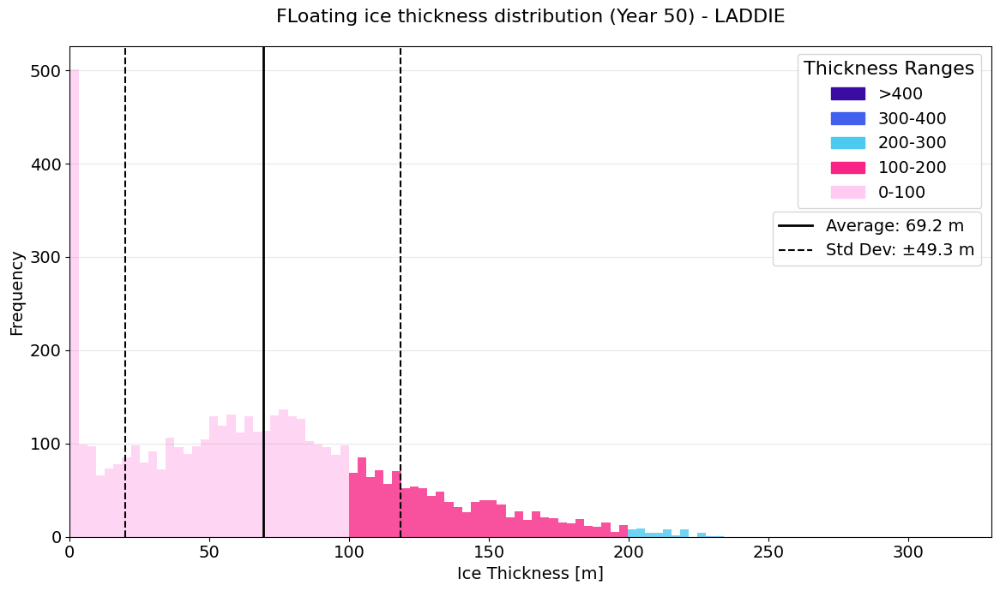

In [130]:
# Your custom color bins
solid_colors = {
    '>400': '#3A0CA3',   # Deep blue
    '300-400': '#4361EE', # Bright blue
    '200-300': '#4CC9F0', # Light teal-blue
    '100-200': '#F72585', # Vibrant pink
    '0-100': '#FFCBF2'    # Light pink
}

# Load your data
data = Hi_l[50].where(mask_rock & mask_ocean).values.flatten()
data = data[~np.isnan(data)]  # Remove NaN values

# Calculate data range
data_min, data_max = 0, 300
print(f"Data range: {data_min:.1f} to {data_max:.1f} m")  # Verify range matches expectations

# Create figure
plt.figure(figsize=(12, 7))

# Set number of bins (25x typical amount)
num_bins = 75  # 25 * 8

# Create histogram with fine bins
n, bins, patches = plt.hist(data, bins=num_bins, 
                           edgecolor='none', 
                           alpha=0.8)

# Color each bar according to your thresholds
for patch, bin_left, bin_right in zip(patches, bins[:-1], bins[1:]):
    bin_center = (bin_left + bin_right)/2
    
    if bin_center > 400:
        patch.set_facecolor(solid_colors['>400'])
    elif bin_center > 300:
        patch.set_facecolor(solid_colors['300-400'])
    elif bin_center > 200:
        patch.set_facecolor(solid_colors['200-300'])
    elif bin_center > 100:
        patch.set_facecolor(solid_colors['100-200'])
    else:
        patch.set_facecolor(solid_colors['0-100'])

# Add statistical markers
average = np.nanmean(data)
std = np.nanstd(data)
avg_line = plt.axvline(x=average, color='black', linestyle='-', linewidth=2)
std_line = plt.axvline(x=average + std, color='black', linestyle='--', linewidth=1.5)
plt.axvline(x=average - std, color='black', linestyle='--', linewidth=1.5)

# Create combined legend
from matplotlib.lines import Line2D

# Color range patches
color_patches = [mpatches.Patch(color=color, label=label) 
                for label, color in solid_colors.items()]

# Statistical line markers
stat_lines = [
    Line2D([0], [0], color='black', linestyle='-', lw=2, label=f'Average: {average:.1f} m'),
    Line2D([0], [0], color='black', linestyle='--', lw=1.5, label=f'Std Dev: ±{std:.1f} m')
]

# Combine both legends
first_legend = plt.legend(handles=color_patches, 
                         bbox_to_anchor=(0.78, 1), 
                         loc='upper left',
                         title='Thickness Ranges', fontsize=14, title_fontsize=16)

# Add the second legend manually
plt.gca().add_artist(first_legend)
plt.legend(handles=stat_lines, 
          bbox_to_anchor=(0.753, 0.68), 
          loc='upper left', fontsize=14, title_fontsize=16)


plt.title(f'FLoating ice thickness distribution (Year 50) - LADDIE', fontsize=16, pad=20)
plt.xlabel('Ice Thickness [m]', fontsize=14)
plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.ylabel('Frequency', fontsize=14)
plt.grid(axis='y', alpha=0.3)
plt.xlim(max(0, data_min*0.9), min(500, data_max*1.1))

plt.tight_layout()
plt.show()

Data range: 0.0 to 300.0 m


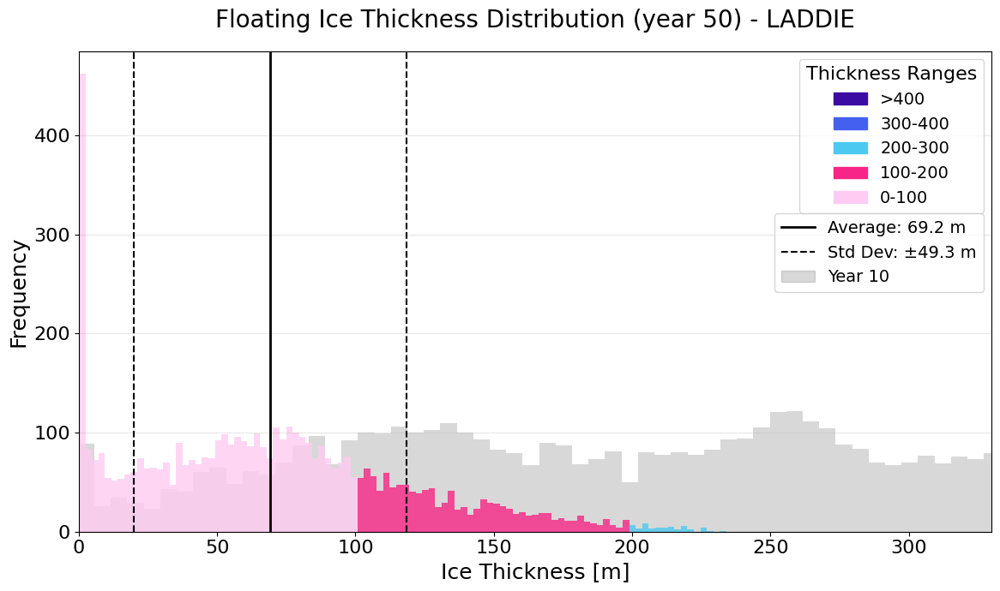

In [135]:
# Your custom color bins
solid_colors = {
    '>400': '#3A0CA3',   # Deep blue
    '300-400': '#4361EE', # Bright blue
    '200-300': '#4CC9F0', # Light teal-blue
    '100-200': '#F72585', # Vibrant pink
    '0-100': '#FFCBF2'    # Light pink
}

# Load your data for both years
data_year50 = Hi_l[50].where(mask_rock & mask_ocean).values.flatten()
data_year50 = data_year50[~np.isnan(data_year50)]  # Remove NaN values

data_year0 = Hi_l[10].where(mask_rock & mask_ocean).values.flatten()
data_year0 = data_year0[~np.isnan(data_year0)]  # Remove NaN values

# Calculate data range
data_min, data_max = 0, 300
print(f"Data range: {data_min:.1f} to {data_max:.1f} m")  # Verify range matches expectations

# Create figure
plt.figure(figsize=(12, 7))

# Set number of bins
num_bins = 100

# First plot the year 0 distribution in background (faded)
n0, bins0, patches0 = plt.hist(data_year0, bins=num_bins, 
                              edgecolor='none', 
                              alpha=0.3,  # More transparent
                              color='gray',  # Unified faded color
                              label='Year 0 Distribution')

# Then plot the year 50 distribution
n50, bins50, patches50 = plt.hist(data_year50, bins=num_bins, 
                                edgecolor='none', 
                                alpha=0.8)

# Color each bar according to your thresholds (only for year 50)
for patch, bin_left, bin_right in zip(patches50, bins50[:-1], bins50[1:]):
    bin_center = (bin_left + bin_right)/2
    
    if bin_center > 400:
        patch.set_facecolor(solid_colors['>400'])
    elif bin_center > 300:
        patch.set_facecolor(solid_colors['300-400'])
    elif bin_center > 200:
        patch.set_facecolor(solid_colors['200-300'])
    elif bin_center > 100:
        patch.set_facecolor(solid_colors['100-200'])
    else:
        patch.set_facecolor(solid_colors['0-100'])

# Add statistical markers (for year 50)
average = np.nanmean(data_year50)
std = np.nanstd(data_year50)
avg_line = plt.axvline(x=average, color='black', linestyle='-', linewidth=2)
std_line = plt.axvline(x=average + std, color='black', linestyle='--', linewidth=1.5)
plt.axvline(x=average - std, color='black', linestyle='--', linewidth=1.5)

# Create combined legend
from matplotlib.lines import Line2D

# Color range patches
color_patches = [mpatches.Patch(color=color, label=label) 
                for label, color in solid_colors.items()]

# Statistical line markers
stat_lines = [
    Line2D([0], [0], color='black', linestyle='-', lw=2, label=f'Average: {average:.1f} m'),
    Line2D([0], [0], color='black', linestyle='--', lw=1.5, label=f'Std Dev: ±{std:.1f} m'),
    mpatches.Patch(color='gray', alpha=0.3, label='Year 10 ')
]

# Combine all legends
first_legend = plt.legend(handles=color_patches, 
                         bbox_to_anchor=(0.78, 1), 
                         loc='upper left',
                         title='Thickness Ranges', 
                         fontsize=14, 
                         title_fontsize=16)

# Add the second legend manually
plt.gca().add_artist(first_legend)
plt.legend(handles=stat_lines, 
          bbox_to_anchor=(0.753, 0.68), 
          loc='upper left', 
          fontsize=14)

# Format plot
plt.title('Floating Ice Thickness Distribution (year 50) - LADDIE', 
          fontsize=20, pad=20)
plt.xlabel('Ice Thickness [m]', fontsize=18)
plt.xticks(fontsize=16)
plt.yticks(fontsize=16)
plt.ylabel('Frequency', fontsize=18)
plt.grid(axis='y', alpha=0.3)
plt.xlim(max(0, data_min*0.9), min(500, data_max*1.1))

plt.tight_layout()
plt.show()

AttributeError: module 'matplotlib.pyplot' has no attribute 'AutoMinorLocator'

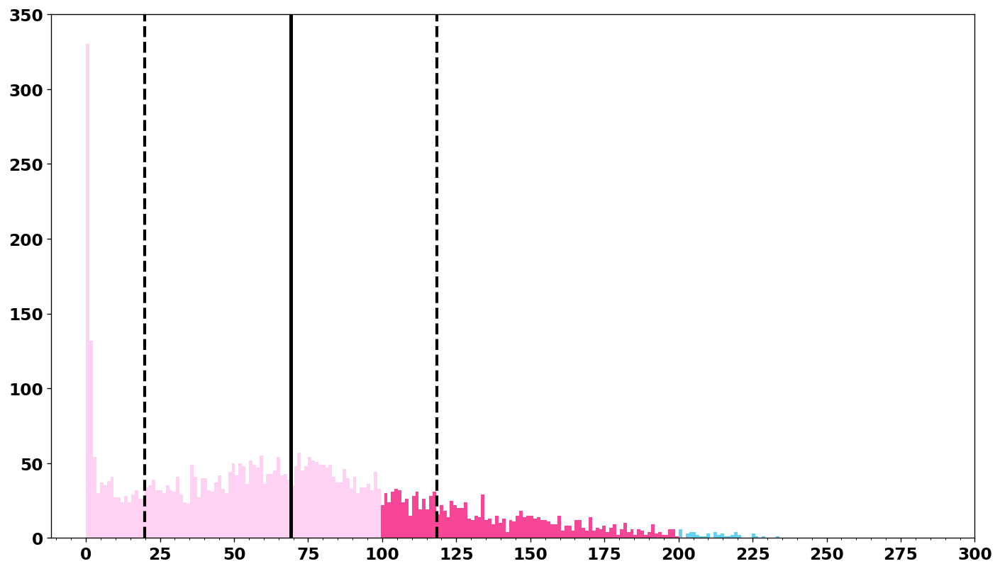

In [120]:
# Your custom color bins
solid_colors = {
    '>400': '#3A0CA3',   # Deep blue
    '300-400': '#4361EE', # Bright blue
    '200-300': '#4CC9F0', # Light teal-blue
    '100-200': '#F72585', # Vibrant pink
    '0-100': '#FFCBF2'    # Light pink
}

# Load your data
data = Hi_l[50].where(mask_rock & mask_ocean).values.flatten()
data = data[~np.isnan(data)]  # Remove NaN values

# Create figure with higher DPI
plt.figure(figsize=(14, 8), dpi=120)

# Set number of bins
num_bins = 200

# Create histogram with fine bins
n, bins, patches = plt.hist(data, bins=num_bins, 
                           edgecolor='none', 
                           alpha=0.85)

# Color each bar according to your thresholds
for patch, bin_left, bin_right in zip(patches, bins[:-1], bins[1:]):
    bin_center = (bin_left + bin_right)/2
    
    if bin_center > 400:
        patch.set_facecolor(solid_colors['>400'])
    elif bin_center > 300:
        patch.set_facecolor(solid_colors['300-400'])
    elif bin_center > 200:
        patch.set_facecolor(solid_colors['200-300'])
    elif bin_center > 100:
        patch.set_facecolor(solid_colors['100-200'])
    else:
        patch.set_facecolor(solid_colors['0-100'])

# Add statistical markers
average = np.nanmean(data)
std = np.nanstd(data)
avg_line = plt.axvline(x=average, color='black', linestyle='-', linewidth=3)
std_line = plt.axvline(x=average + std, color='black', linestyle='--', linewidth=2.5)
plt.axvline(x=average - std, color='black', linestyle='--', linewidth=2.5)

# PRECISE TICK CONTROL
xtick_values = np.arange(0, 301, 25)  # From 0 to 300 in steps of 25
ytick_values = plt.MaxNLocator(8).tick_values(0, max(n))  # 8 optimal y-ticks

plt.xticks(xtick_values, fontsize=14, weight='semibold')
plt.yticks(ytick_values, fontsize=14, weight='semibold')

# Custom minor ticks
ax = plt.gca()
ax.xaxis.set_minor_locator(plt.MultipleLocator(5))  # Minor ticks every 5m
ax.yaxis.set_minor_locator(plt.AutoMinorLocator(2))  # Minor ticks between majors

# Enhanced grid
ax.grid(which='major', axis='both', linestyle='-', linewidth=0.8, alpha=0.4)
ax.grid(which='minor', axis='both', linestyle=':', linewidth=0.5, alpha=0.2)

# Create combined legend
color_patches = [mpatches.Patch(color=color, label=label) 
                for label, color in solid_colors.items()]

stat_lines = [
    Line2D([0], [0], color='black', linestyle='-', lw=3, label=f'Average: {average:.1f} m'),
    Line2D([0], [0], color='black', linestyle='--', lw=2.5, label=f'Std Dev: ±{std:.1f} m')
]

# First legend for colors
first_legend = plt.legend(handles=color_patches, 
                        bbox_to_anchor=(0.78, 1), 
                        loc='upper left',
                        title='Thickness Ranges',
                        fontsize=14,
                        title_fontsize=16,
                        framealpha=0.9)

# Second legend for statistics
plt.gca().add_artist(first_legend)
plt.legend(handles=stat_lines, 
          bbox_to_anchor=(0.78, 0.68), 
          loc='upper left',
          fontsize=14,
          framealpha=0.9)

# Format plot
plt.title('Ice Thickness Distribution (Year 50) - LADDIE', 
          fontsize=18, pad=20, weight='bold')
plt.xlabel('Ice Thickness [m]', fontsize=16, weight='bold')
plt.ylabel('Frequency', fontsize=16, weight='bold')

# Set axis limits
plt.xlim(0, 300)
plt.ylim(0, max(n)*1.05)  # 5% padding on top

# Adjust layout
plt.tight_layout()
plt.show()

In [85]:
Hi_l[50].where(mask_rock & mask_ocean).min()

<xarray.DataArray 'Hi' ()> Size: 8B
array(0.05603889)
Coordinates:
    time     float64 8B 50.0

In [29]:
years = [30,40,50]

/var/folders/bv/2cj65x2j5v94fp020tpswb0w0000gn/T/ipykernel_4965/251977507.py:69: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


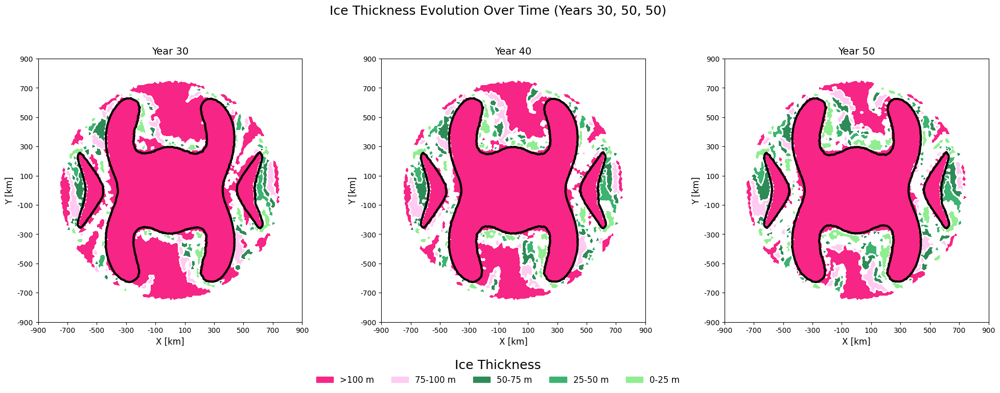

In [33]:
solid_colors = {
    '>100': '#F72585',   # Deep blue
    '75-100': '#FFCBF2', # Bright blue
    '50-75': '#2E8B57',  # Light teal-blue
    '25-50': '#3CB371',  # Vibrant pink
    '0-25':'#90EE90'     # Light pink
}


# Create colormaps
cmap_grey = ListedColormap([solid_colors['>100']])
cmap_purple = ListedColormap([solid_colors['75-100']])
cmap_blue = ListedColormap([solid_colors['50-75']])
cmap_orange = ListedColormap([solid_colors['25-50']])
cmap_red = ListedColormap([solid_colors['0-25']])

fig = plt.figure(figsize=(24, 8))
# Create 1 row and 3 columns
gs = gridspec.GridSpec(1, 3, wspace=0.3)

# Create subplots in a single row
axes = [plt.subplot(gs[i]) for i in range(3)]

# Create legend handles
legend_handles = [
    mpatches.Patch(color=solid_colors['>100'], label='>100 m'),
    mpatches.Patch(color=solid_colors['75-100'], label='75-100 m'),
    mpatches.Patch(color=solid_colors['50-75'], label='50-75 m'),
    mpatches.Patch(color=solid_colors['25-50'], label='25-50 m'),
    mpatches.Patch(color=solid_colors['0-25'], label='0-25 m')
]

for i, year in enumerate(years):
    ax = axes[i]
    GL = Lad['grounding_line'][year]
    c0 = ax.tripcolor(triang, Hi_l[year].where(Hi_l[year] >= 100), cmap=cmap_grey, edgecolor = 'None')
    c1 = ax.tripcolor(triang, Hi_l[year].where((Hi_l[year] >= 75) & (Hi_l[year] < 100)), cmap=cmap_purple, edgecolor = 'None')
    c2 = ax.tripcolor(triang, Hi_l[year].where((Hi_l[year] >= 50) & (Hi_l[year] < 75)), cmap=cmap_blue,  edgecolor = 'None')
    c3 = ax.tripcolor(triang, Hi_l[year].where((Hi_l[year] >= 25) & (Hi_l[year] < 50)), cmap=cmap_orange,  edgecolor = 'None')
    c4 = ax.tripcolor(triang, Hi_l[year].where((Hi_l[year] > 0) & (Hi_l[year] < 10)), cmap=cmap_red,  edgecolor = 'None')
   
    ax.plot(GL[0, :], GL[1, :], color='black', linewidth=3, label='Grounding Line')
    
    ax.set_title(f'Year {year}', fontsize=14)
    ax.set_xlabel('X [km]', fontsize=12)
    ax.set_ylabel('Y [km]', fontsize=12)
    ax.set_xticks(np.arange(-n, n + 1, 200000))
    ax.set_xticklabels(np.arange(-n // 1000, n // 1000 + 1, 200))
    ax.set_yticks(np.arange(-n, n + 1, 200000))
    ax.set_yticklabels(np.arange(-n // 1000, n // 1000 + 1, 200))
    ax.set_xlim(-n, n)
    ax.set_ylim(-n, n)
    ax.set_aspect('equal')
   # ax.set_facecolor('#3A0CA3')

# Add legend below the plots
fig.legend(handles=legend_handles, 
           title='Ice Thickness', 
           loc='lower center', 
           ncol=5, 
           fontsize=12,
           frameon=False,
           bbox_to_anchor=(0.5, 0),
           title_fontsize=18)

plt.suptitle('Ice Thickness Evolution Over Time (Years 30, 50, 50)', fontsize=18, y=0.95)  
plt.rcParams['figure.edgecolor'] = 'none'

plt.tight_layout()
plt.show()


/var/folders/bv/2cj65x2j5v94fp020tpswb0w0000gn/T/ipykernel_12435/2057667883.py:41: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(pad=1.5)  # Reduced padding


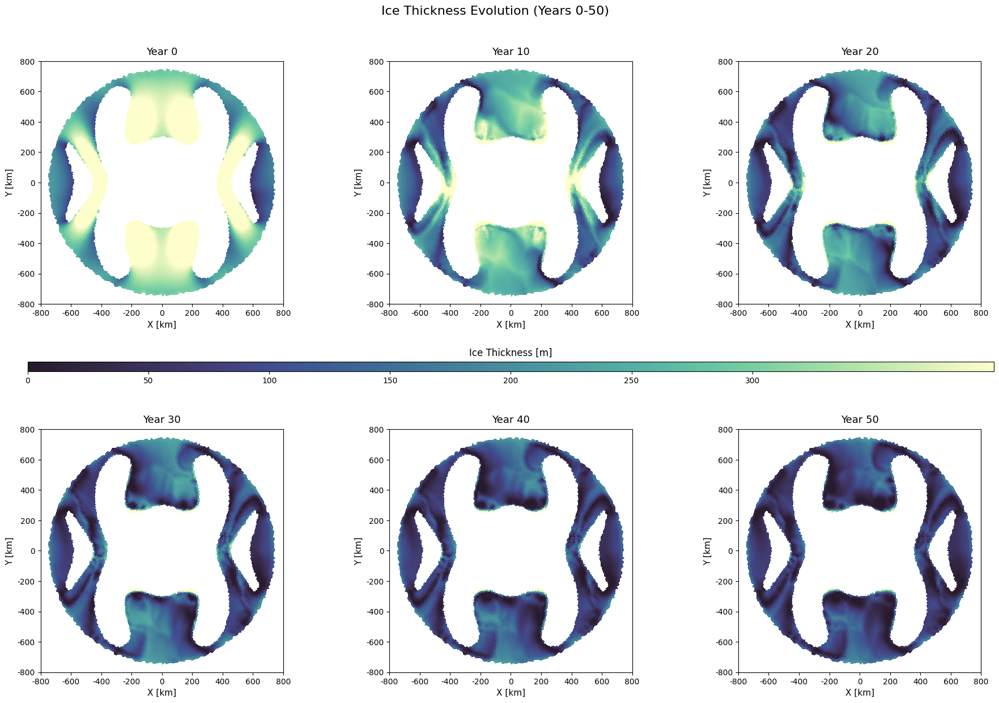

In [17]:
fig = plt.figure(figsize=(22, 14))  # Slightly reduced figure size
gs = gridspec.GridSpec(3, 3, height_ratios=[1, 0.04, 1], hspace=0.35, wspace=0.3)  # Tighter spacing

# Create subplots
axes = []
for i in range(6):
    if i < 3:
        axes.append(fig.add_subplot(gs[0, i]))  # First row
    else:
        axes.append(fig.add_subplot(gs[2, i-3]))  # Third row

# Create horizontal colorbar axis between rows
cax = fig.add_subplot(gs[1, :])  # Span all columns in middle row

for i, year in enumerate(years):
    ax = axes[i]
    # Main plot with contour lines
    c0 = ax.tripcolor(triang, Hi_l[year].where(mask_rock&mask_ocean), cmap=cmo.deep_r, vmin=0, vmax=400)

    ax.set_title(f'Year {year}', fontsize=13, pad=8)  # Reduced padding
    ax.set_xlabel('X [km]', fontsize=11)
    ax.set_ylabel('Y [km]', fontsize=11)
    ax.set_xticks(np.arange(-n, n+1, 200000))
    ax.set_yticks(np.arange(-n, n+1, 200000))
    ax.set_xticklabels(np.arange(-800, 801, 200))  # Direct labels
    ax.set_yticklabels(np.arange(-800, 801, 200))
    ax.set_xlim(-n, n)
    ax.set_ylim(-n, n)
    ax.set_aspect('equal')
    # Colorbar formatting
    cbar = fig.colorbar(c0, cax=cax, orientation='horizontal')
    cbar.set_label('Ice Thickness [m]', fontsize=12, labelpad=8)
    cbar.set_ticks(np.arange(0, 301, 50))  # Match contour levels
    cbar.ax.tick_params(labelsize=10)  # Adjust tick label size
    cax.xaxis.set_ticks_position('bottom')
    cax.xaxis.set_label_position('top')

# Main title with adjusted position
plt.suptitle('Ice Thickness Evolution (Years 0-50)', 
            fontsize=16, y=0.95)  # More compact title
plt.tight_layout(pad=1.5)  # Reduced padding
plt.show()

/var/folders/bv/2cj65x2j5v94fp020tpswb0w0000gn/T/ipykernel_12435/2137675118.py:44: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(pad=1.5)  # Reduced padding


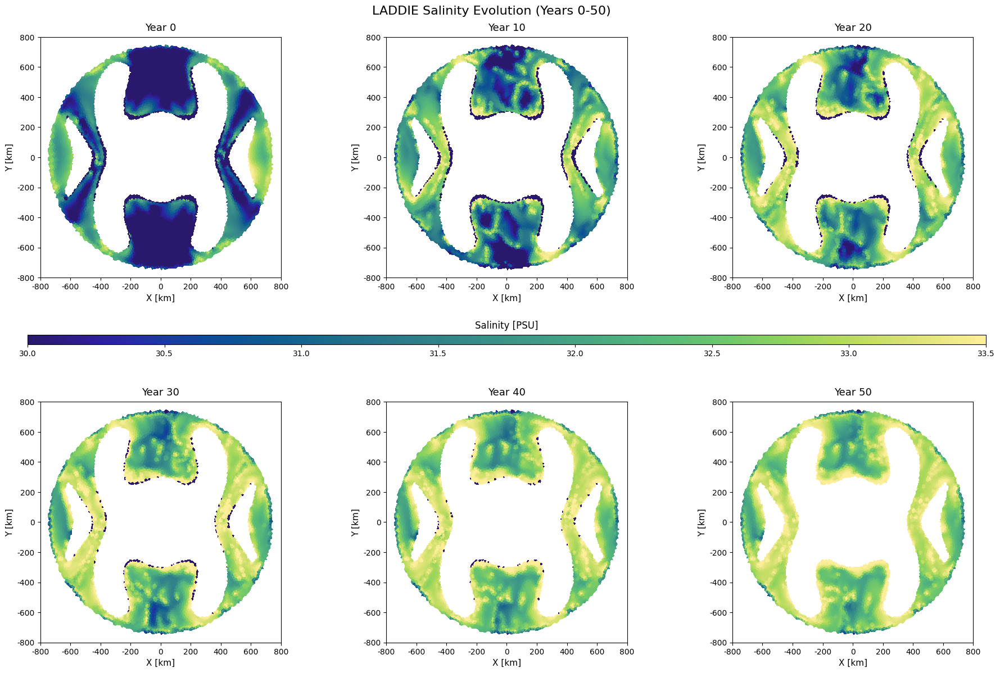

In [18]:
fig = plt.figure(figsize=(22, 14))  # Slightly reduced figure size
gs = gridspec.GridSpec(3, 3, height_ratios=[1, 0.04, 1], hspace=0.35, wspace=0.3)  # Tighter spacing

# Create subplots
axes = []
for i in range(6):
    if i < 3:
        axes.append(fig.add_subplot(gs[0, i]))  # First row
    else:
        axes.append(fig.add_subplot(gs[2, i-3]))  # Third row

# Create horizontal colorbar axis between rows
cax = fig.add_subplot(gs[1, :])  # Span all columns in middle row

for i, year in enumerate(years):
    ax = axes[i]
    # Main plot with contour lines
    c0 = ax.tripcolor(triang, S_lad[year].where(mask_rock & mask_ocean), cmap=cmo.haline, vmin=30, vmax=33.5)
    #contours = ax.tricontour(triang, Hi_l[year].where(mask_rock), 
    #                        levels=np.arange(0, 301, 50), 
    #                        colors='k', linewidths=0.7)  # Darker contours
    #ax.clabel(contours, inline=True, fontsize=9, fmt='%d m')
    
    # Axis formatting
    ax.set_title(f'Year {year}', fontsize=13, pad=8)  # Reduced padding
    ax.set_xlabel('X [km]', fontsize=11)
    ax.set_ylabel('Y [km]', fontsize=11)
    ax.set_xticks(np.arange(-n, n+1, 200000))
    ax.set_yticks(np.arange(-n, n+1, 200000))
    ax.set_xticklabels(np.arange(-800, 801, 200))  # Direct labels
    ax.set_yticklabels(np.arange(-800, 801, 200))
    ax.set_xlim(-n, n)
    ax.set_ylim(-n, n)
    ax.set_aspect('equal')
    # Colorbar formatting
    cbar = fig.colorbar(c0, cax=cax, orientation='horizontal', ticks=np.arange(28, 34, 0.5))
    cbar.set_label('Salinity [PSU]', fontsize=12, labelpad=8)
    cax.xaxis.set_ticks_position('bottom')
    cax.xaxis.set_label_position('top')

# Main title with adjusted position
plt.suptitle('LADDIE Salinity Evolution (Years 0-50)', 
            fontsize=16, y=0.92)  # More compact title
plt.tight_layout(pad=1.5)  # Reduced padding
plt.show()

/var/folders/bv/2cj65x2j5v94fp020tpswb0w0000gn/T/ipykernel_7454/2045055829.py:46: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(pad=1.5)  # Reduced padding


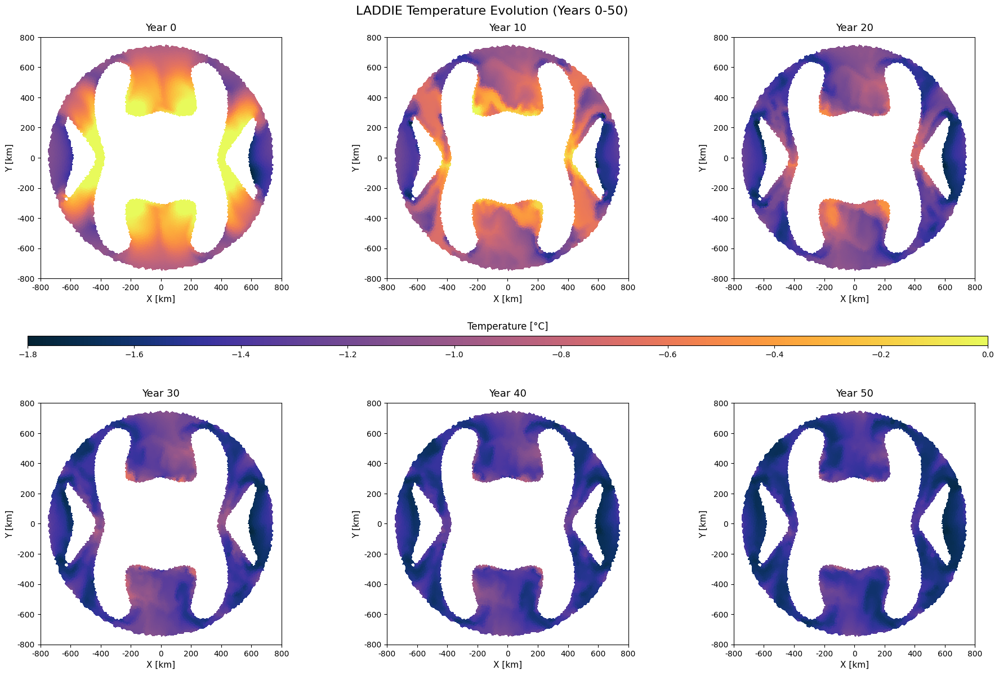

In [274]:
fig = plt.figure(figsize=(22, 14))  # Slightly reduced figure size
gs = gridspec.GridSpec(3, 3, height_ratios=[1, 0.04, 1], hspace=0.35, wspace=0.3)  # Tighter spacing

# Create subplots
axes = []
for i in range(6):
    if i < 3:
        axes.append(fig.add_subplot(gs[0, i]))  # First row
    else:
        axes.append(fig.add_subplot(gs[2, i-3]))  # Third row

# Create horizontal colorbar axis between rows
cax = fig.add_subplot(gs[1, :])  # Span all columns in middle row

for i, year in enumerate(years):
    ax = axes[i]
    # Main plot with contour lines
    c0 = ax.tripcolor(triang, T_lad[year].where(mask_rock & mask_ocean), cmap=cmo.thermal, vmin=-1.8, vmax=0)
    #contours = ax.tricontour(triang, Hi_l[year].where(mask_rock), 
    #                        levels=np.arange(0, 301, 50), 
    #                        colors='k', linewidths=0.7)  # Darker contours
    #ax.clabel(contours, inline=True, fontsize=9, fmt='%d m')
    
    # Axis formatting
    ax.set_title(f'Year {year}', fontsize=13, pad=8)  # Reduced padding
    ax.set_xlabel('X [km]', fontsize=11)
    ax.set_ylabel('Y [km]', fontsize=11)
    ax.set_xticks(np.arange(-n, n+1, 200000))
    ax.set_yticks(np.arange(-n, n+1, 200000))
    ax.set_xticklabels(np.arange(-800, 801, 200))  # Direct labels
    ax.set_yticklabels(np.arange(-800, 801, 200))
    ax.set_xlim(-n, n)
    ax.set_ylim(-n, n)
    ax.set_aspect('equal')

# Colorbar formatting
cbar = fig.colorbar(c0, cax=cax, orientation='horizontal')
cbar.set_label('Temperature [°C]', fontsize=12, labelpad=8)
cbar.set_ticks(np.linspace(-1.8, 0, 10))  # Add evenly spaced ticks
cax.xaxis.set_ticks_position('bottom')
cax.xaxis.set_label_position('top')

# Main title with adjusted position
plt.suptitle('LADDIE Temperature Evolution (Years 0-50)', 
            fontsize=16, y=0.92)  # More compact title
plt.tight_layout(pad=1.5)  # Reduced padding
plt.show()

/var/folders/bv/2cj65x2j5v94fp020tpswb0w0000gn/T/ipykernel_7454/3838897394.py:46: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(pad=1.5)  # Reduced padding


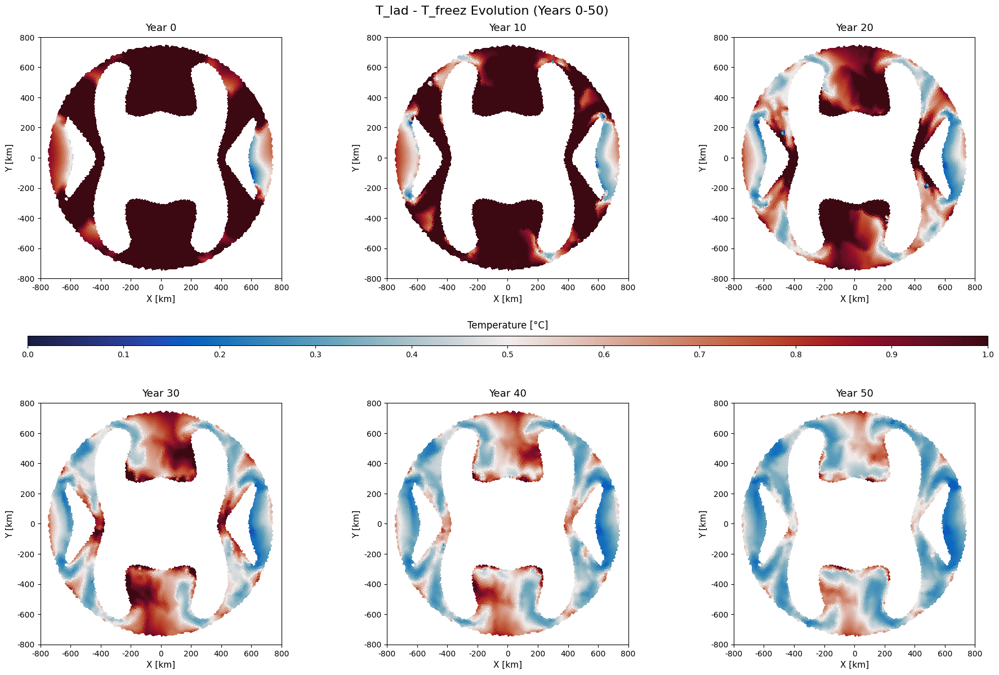

In [275]:
fig = plt.figure(figsize=(22, 14))  # Slightly reduced figure size
gs = gridspec.GridSpec(3, 3, height_ratios=[1, 0.04, 1], hspace=0.35, wspace=0.3)  # Tighter spacing

# Create subplots
axes = []
for i in range(6):
    if i < 3:
        axes.append(fig.add_subplot(gs[0, i]))  # First row
    else:
        axes.append(fig.add_subplot(gs[2, i-3]))  # Third row

# Create horizontal colorbar axis between rows
cax = fig.add_subplot(gs[1, :])  # Span all columns in middle row

for i, year in enumerate(years):
    ax = axes[i]
    # Main plot with contour lines
    c0 = ax.tripcolor(triang, T_lad[year]-T_fp[year].where(mask_rock & mask_ocean), cmap=cmo.balance, vmin=0, vmax=1)
    #contours = ax.tricontour(triang, Hi_l[year].where(mask_rock), 
    #                        levels=np.arange(0, 301, 50), 
    #                        colors='k', linewidths=0.7)  # Darker contours
    #ax.clabel(contours, inline=True, fontsize=9, fmt='%d m')
    
    # Axis formatting
    ax.set_title(f'Year {year}', fontsize=13, pad=8)  # Reduced padding
    ax.set_xlabel('X [km]', fontsize=11)
    ax.set_ylabel('Y [km]', fontsize=11)
    ax.set_xticks(np.arange(-n, n+1, 200000))
    ax.set_yticks(np.arange(-n, n+1, 200000))
    ax.set_xticklabels(np.arange(-800, 801, 200))  # Direct labels
    ax.set_yticklabels(np.arange(-800, 801, 200))
    ax.set_xlim(-n, n)
    ax.set_ylim(-n, n)
    ax.set_aspect('equal')

# Colorbar formatting
cbar = fig.colorbar(c0, cax=cax, orientation='horizontal')
cbar.set_label('Temperature [°C]', fontsize=12, labelpad=10)
cbar.set_ticks(np.linspace(0, 1, 11))  # Add evenly spaced ticks
cax.xaxis.set_ticks_position('bottom')
cax.xaxis.set_label_position('top')

# Main title with adjusted position
plt.suptitle('T_lad - T_freez Evolution (Years 0-50)', 
            fontsize=16, y=0.92)  # More compact title
plt.tight_layout(pad=1.5)  # Reduced padding
plt.show()

In [276]:
melt

<xarray.DataArray 'melt' (time: 51, vi: 12346)> Size: 5MB
[629646 values with dtype=float64]
Coordinates:
  * time     (time) float64 408B 0.0 1.0 2.0 3.0 4.0 ... 47.0 48.0 49.0 50.0
Dimensions without coordinates: vi
Attributes:
    long_name:  Melt rate
    units:      m s^-1

/var/folders/bv/2cj65x2j5v94fp020tpswb0w0000gn/T/ipykernel_7454/3166521963.py:46: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(pad=1.5)  # Reduced padding


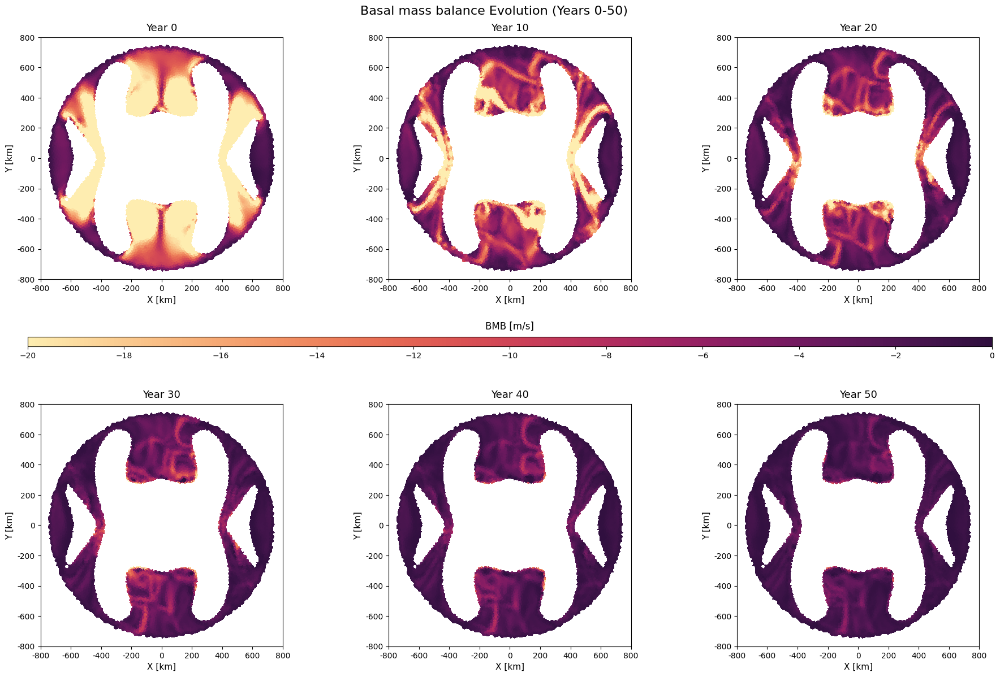

In [277]:
fig = plt.figure(figsize=(22, 14))  # Slightly reduced figure size
gs = gridspec.GridSpec(3, 3, height_ratios=[1, 0.04, 1], hspace=0.35, wspace=0.3)  # Tighter spacing

# Create subplots
axes = []
for i in range(6):
    if i < 3:
        axes.append(fig.add_subplot(gs[0, i]))  # First row
    else:
        axes.append(fig.add_subplot(gs[2, i-3]))  # Third row

# Create horizontal colorbar axis between rows
cax = fig.add_subplot(gs[1, :])  # Span all columns in middle row

for i, year in enumerate(years):
    ax = axes[i]
    # Main plot with contour lines
    c0 = ax.tripcolor(triang, BMB_l[year].where(mask_rock & mask_ocean), cmap=cmo.matter, vmin=-20, vmax=0)
    #contours = ax.tricontour(triang, Hi_l[year].where(mask_rock), 
    #                        levels=np.arange(0, 301, 50), 
    #                        colors='k', linewidths=0.7)  # Darker contours
    #ax.clabel(contours, inline=True, fontsize=9, fmt='%d m')
    
    # Axis formatting
    ax.set_title(f'Year {year}', fontsize=13, pad=8)  # Reduced padding
    ax.set_xlabel('X [km]', fontsize=11)
    ax.set_ylabel('Y [km]', fontsize=11)
    ax.set_xticks(np.arange(-n, n+1, 200000))
    ax.set_yticks(np.arange(-n, n+1, 200000))
    ax.set_xticklabels(np.arange(-800, 801, 200))  # Direct labels
    ax.set_yticklabels(np.arange(-800, 801, 200))
    ax.set_xlim(-n, n)
    ax.set_ylim(-n, n)
    ax.set_aspect('equal')

# Colorbar formatting
cbar = fig.colorbar(c0, cax=cax, orientation='horizontal')
cbar.set_label('BMB [m/s]', fontsize=12, labelpad=10)
cbar.set_ticks(np.linspace(-20, 0, 11))  # Add evenly spaced ticks
cax.xaxis.set_ticks_position('bottom')
cax.xaxis.set_label_position('top')

# Main title with adjusted position
plt.suptitle('Basal mass balance Evolution (Years 0-50)', 
            fontsize=16, y=0.92)  # More compact title
plt.tight_layout(pad=1.5)  # Reduced padding
plt.show()

/opt/miniconda3/envs/myenv/lib/python3.10/site-packages/xarray/core/common.py:180: RuntimeWarning: invalid value encountered in cast
  return np.array(self.values, dtype=dtype, copy=copy)
/opt/miniconda3/envs/myenv/lib/python3.10/site-packages/xarray/core/common.py:180: RuntimeWarning: invalid value encountered in cast
  return np.array(self.values, dtype=dtype, copy=copy)
/opt/miniconda3/envs/myenv/lib/python3.10/site-packages/xarray/core/common.py:180: RuntimeWarning: invalid value encountered in cast
  return np.array(self.values, dtype=dtype, copy=copy)
/opt/miniconda3/envs/myenv/lib/python3.10/site-packages/xarray/core/common.py:180: RuntimeWarning: invalid value encountered in cast
  return np.array(self.values, dtype=dtype, copy=copy)
/opt/miniconda3/envs/myenv/lib/python3.10/site-packages/xarray/core/common.py:180: RuntimeWarning: invalid value encountered in cast
  return np.array(self.values, dtype=dtype, copy=copy)
/opt/miniconda3/envs/myenv/lib/python3.10/site-packages/xarr

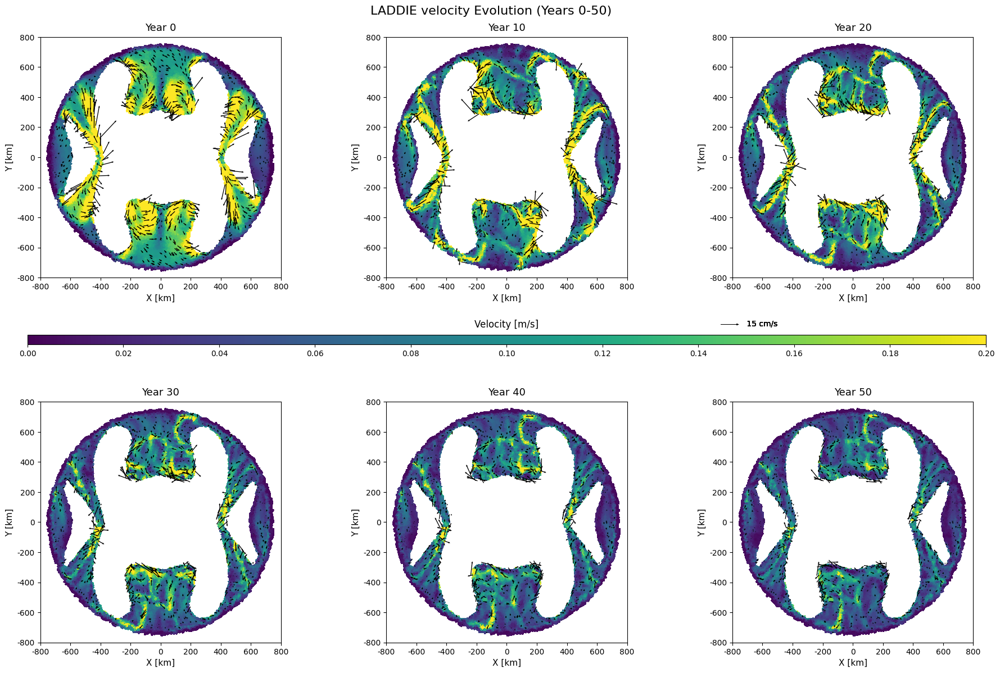

Year 50: <xarray.DataArray ()> Size: 8B
array(873)
Coordinates:
    time     float64 8B 50.0 arrows being plotted


In [278]:
Mag = np.sqrt(U_lad**2 + V_lad**2)
m = 10
Tricc = Lad['Tricc']

fig = plt.figure(figsize=(22, 14))  # Slightly reduced figure size
gs = gridspec.GridSpec(3, 3, height_ratios=[1, 0.04, 1], hspace=0.35, wspace=0.3)  # Tighter spacing

# Create subplots
axes = []
for i in range(6):
    if i < 3:
        axes.append(fig.add_subplot(gs[0, i]))  # First row
    else:
        axes.append(fig.add_subplot(gs[2, i-3]))  # Third row

# Create horizontal colorbar axis between rows
cax = fig.add_subplot(gs[1, :])  # Span all columns in middle row

for i, year in enumerate(years):
    ax = axes[i]

    # Main plot with contour lines
    c0 = ax.tripcolor(
    Tricc[0, :], 
    Tricc[1, :], 
    Mag[year].where(Mag[0] != 0), 
    cmap='viridis', 
    vmin=0, 
    vmax=0.2
    )
    # Axis formatting
    ax.set_title(f'Year {year}', fontsize=13, pad=8)  # Reduced padding
    ax.set_xlabel('X [km]', fontsize=11)
    ax.set_ylabel('Y [km]', fontsize=11)
    ax.set_xticks(np.arange(-n, n+1, 200000))
    ax.set_yticks(np.arange(-n, n+1, 200000))
    ax.set_xticklabels(np.arange(-800, 801, 200))  # Direct labels
    ax.set_yticklabels(np.arange(-800, 801, 200))
    ax.set_xlim(-n, n)
    ax.set_ylim(-n, n)
    ax.set_aspect('equal')


    subsampled_mask = (Mag[year][::m] >= 0.01) 
    ax.quiver(Tricc[0, :][::m][subsampled_mask],
        Tricc[1, :][::m][subsampled_mask],
        U_lad[year][::m][subsampled_mask],
        V_lad[year][::m][subsampled_mask],
        scale=8,
        width=0.003,
        headwidth=2,
        headlength=2,
        headaxislength=3,
        color = 'k'
    )
    ax.quiverkey(
        plt.quiver(0, 0, 0, 0, scale=8, width=0.0005),
        X=0.70,
        Y=0.515,
        U=0.15,
        label=' 15 cm/s',
        labelpos='E',
        coordinates='figure',
        color='k',
    )

# Colorbar formatting
cbar = fig.colorbar(c0, cax=cax, orientation='horizontal')
cbar.set_label('Velocity [m/s]', fontsize=12, labelpad=10)
cbar.set_ticks(np.linspace(0, 0.2, 11))  # Add evenly spaced ticks
cax.xaxis.set_ticks_position('bottom')
cax.xaxis.set_label_position('top')

# Main title with adjusted position
plt.suptitle('LADDIE velocity Evolution (Years 0-50)', 
            fontsize=16, y=0.92)  # More compact title
plt.tight_layout(pad=1.5)  # Reduced padding
plt.show()
print(f"Year {year}: {np.sum(subsampled_mask)} arrows being plotted")

/var/folders/bv/2cj65x2j5v94fp020tpswb0w0000gn/T/ipykernel_7454/2316287287.py:80: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(pad=1.5)  # Reduced padding


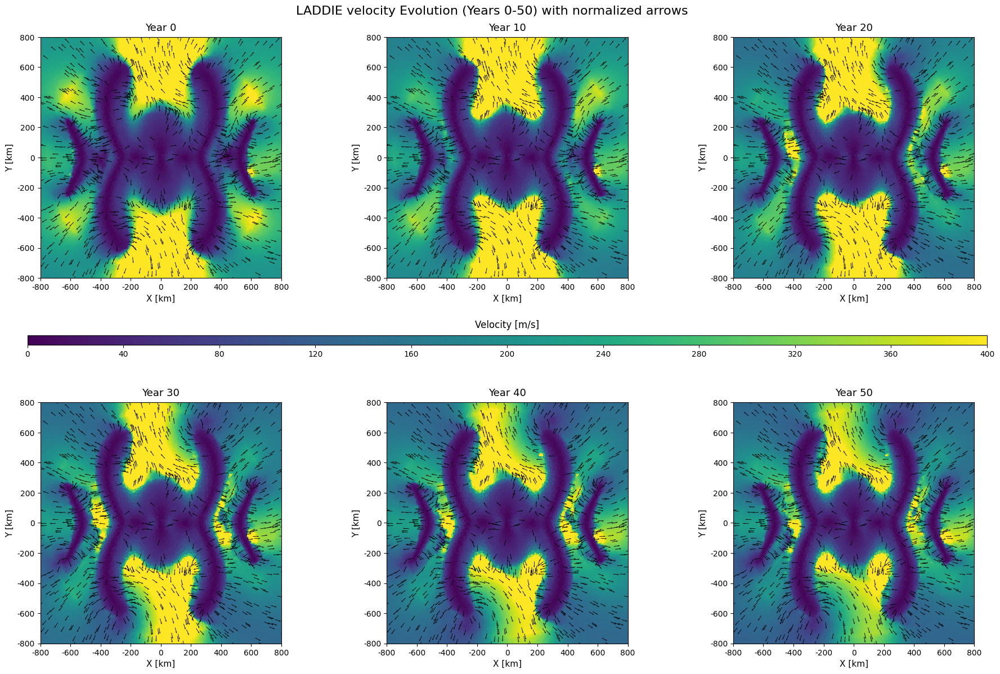

Year 50: <xarray.DataArray ()> Size: 8B
array(873)
Coordinates:
    time     float64 8B 50.0 arrows being plotted


In [279]:
u_s = Lad['u_surf']
v_s = Lad['v_surf']
          
magice = np.sqrt(u_s**2 +v_s**2)
colorbar_kwargs = {
    'aspect': 20,
    'pad': 0.01,
    'shrink': 1, 
}

m = 20
Tricc = Lad['Tricc']

fig = plt.figure(figsize=(22, 14))  # Slightly reduced figure size
gs = gridspec.GridSpec(3, 3, height_ratios=[1, 0.04, 1], hspace=0.35, wspace=0.3)  # Tighter spacing

# Create subplots
axes = []
for i in range(6):
    if i < 3:
        axes.append(fig.add_subplot(gs[0, i]))  # First row
    else:
        axes.append(fig.add_subplot(gs[2, i-3]))  # Third row

# Create horizontal colorbar axis between rows
cax = fig.add_subplot(gs[1, :])  # Span all columns in middle row

for i, year in enumerate(years):
    ax = axes[i]

    # Main plot with contour lines
    c0 = ax.tripcolor(
        Tricc[0, :], 
        Tricc[1, :], 
        magice[year], 
        cmap='viridis', 
        vmin=0, 
        vmax=400

    )
    # Axis formatting
    ax.set_title(f'Year {year}', fontsize=13, pad=8)  # Reduced padding
    ax.set_xlabel('X [km]', fontsize=11)
    ax.set_ylabel('Y [km]', fontsize=11)
    ax.set_xticks(np.arange(-n, n+1, 200000))
    ax.set_yticks(np.arange(-n, n+1, 200000))
    ax.set_xticklabels(np.arange(-800, 801, 200))  # Direct labels
    ax.set_yticklabels(np.arange(-800, 801, 200))
    ax.set_xlim(-n, n)
    ax.set_ylim(-n, n)
    ax.set_aspect('equal')


    u_s_norm = u_s[u][::m] / np.sqrt(u_s[u][::m]**2 + v_s[u][::m]**2)
    v_s_norm = v_s[u][::m] / np.sqrt(u_s[u][::m]**2 + v_s[u][::m]**2)


    ax.quiver(Tricc[0, :][::m],
        Tricc[1, :][::m],
        u_s_norm,
        v_s_norm,
        scale=40,
        width=0.002,
        headwidth=3,
        headlength=4,
        headaxislength=3
    )


# Colorbar formatting
cbar = fig.colorbar(c0, cax=cax, orientation='horizontal')
cbar.set_label('Velocity [m/s]', fontsize=12, labelpad=10)
cbar.set_ticks(np.linspace(0, 400, 11))  # Add evenly spaced ticks
cax.xaxis.set_ticks_position('bottom')
cax.xaxis.set_label_position('top')

# Main title with adjusted position
plt.suptitle('LADDIE velocity Evolution (Years 0-50) with normalized arrows', 
            fontsize=16, y=0.92)  # More compact title
plt.tight_layout(pad=1.5)  # Reduced padding
plt.show()
print(f"Year {year}: {np.sum(subsampled_mask)} arrows being plotted")

